# Supplemental Code for "Powerful batch conformal prediction for classification" by U. Gazin, R. Heller, E. Roquain and A. Solari.

On this notebook you can find the code to obtain the violin plot from the paper "Powerful batch conformal prediction for classification".

You can also find a function to see the empirical coverage, the empirical mean of the power of the batch prediction region. 

All data in this folder comes from experiments when using the code from the file 'AISTATS25_Code' from the last section "Large sample study of the procedure"

In [1]:
import random
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stat
import pandas as pd
import seaborn as sns

colors_blindness = sns.color_palette("colorblind")

colorA=colors_blindness[1]
colorB=colors_blindness[2]
color_Rose=colors_blindness[4]
plt.rcParams['text.usetex'] = True
plt.rc('text.latex', preamble=r'\usepackage{bm} \usepackage{amsfonts}')

In [2]:
# To suppress Future Warning for sns:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

In [119]:
def MeanPlot(TotCoverage,TotPower,TotnPredict,Procedure,AlphaArr,Name='0',SaveFigs=False):
    (nProc,nAlpha,N)=np.shape(TotCoverage)
    
    MeanTotnPredict=np.zeros((nProc,nAlpha))
    MeanTotCoverage=np.zeros((nProc,nAlpha))
    MeanTotPower=np.zeros((nProc,nAlpha))
    
    for i in range (nProc):
        for j in range(nAlpha):
            MeanTotnPredict[i][j]=np.sum(TotnPredict[i][j])/N
            MeanTotCoverage[i][j]=np.sum(TotCoverage[i][j])/N
            MeanTotPower[i][j]=np.sum(TotPower[i][j])/N
        

        
        
    #Coverage Plot

    #plt.figure(figsize=(10,10))
    #plt.rc('text.latex', preamble=r'\usepackage{bm} ')
    #ep=3.3
    #fs=20
    #for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
        #tickLabel.set_fontsize(fs)

        
    plt.figure(figsize=(15,15))
    plt.rc('text.latex', preamble=r'\usepackage{bm} ')
    ep=4.4
    fs=30
    
    for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
        tickLabel.set_fontsize(fs)
    plt.plot(AlphaArr,1-AlphaArr,label='Targeted coverage level',linewidth=ep, color='black')
    for i in range (nProc):

        plt.plot(AlphaArr,MeanTotCoverage[i],'-',label=Procedure[i],linewidth=ep,color=colors_blindness[i])
        
    plt.xlabel(r"$\alpha$", fontsize=fs)
    plt.title(r'Estimation of the Coverage with $N=$ '+str(N)+' simulations',fontsize=fs)
    
    plt.legend(fontsize=fs)
    
    if SaveFigs:
        plt.savefig('MeanCov'+Name+'.pdf',format='pdf')
    
    plt.show()
    
    
    
    
    #Power Plot

    plt.figure(figsize=(10,10))
    plt.rc('text.latex', preamble=r'\usepackage{bm} ')
    ep=3.3
    fs=20
    for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
        tickLabel.set_fontsize(fs)

    for i in range (nProc):

        plt.plot(AlphaArr,MeanTotPower[i],'-',label=r"Power of the " +Procedure[i]+ " procedure",linewidth=ep,color=colors_blindness[i])

    plt.xlabel(r"$\alpha$", fontsize=fs)
    plt.title(r'Estimation of the Power with $N=$ '+str(N)+' simulations',fontsize=fs)

    plt.legend(fontsize=fs)
    if SaveFigs:
        plt.savefig('ComparisonPower.pdf',format='pdf')

    plt.show()
    
    
    #Number Batched plot

    plt.figure(figsize=(15,15))
    plt.rc('text.latex', preamble=r'\usepackage{bm} ')
    ep=4.4
    fs=30
    for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
        tickLabel.set_fontsize(fs)

    for i in range (nProc):

        plt.plot(AlphaArr,MeanTotnPredict[i],'-',label=Procedure[i],linewidth=ep,color=colors_blindness[i])

    plt.xlabel(r"$\alpha$", fontsize=fs)
    plt.title(r'Mean size of batch prediction set with $N=$ '+str(N)+' simulations',fontsize=fs)

    plt.legend(fontsize=fs)
    if SaveFigs:
        plt.savefig('MeanSize'+Name+'.pdf',format='pdf')

    plt.show()
    
    
    
    
    
    
    
    
    
    #Log Number Batched plot

    plt.figure(figsize=(15,15))
    plt.rc('text.latex', preamble=r'\usepackage{bm} ')
    ep=4.4
    fs=30
    plt.yscale('log')
    for tickLabel in plt.gca().get_xticklabels(which="both") + plt.gca().get_yticklabels(which="both"):
        tickLabel.set_fontsize(fs)

    
    for i in range (nProc):

        plt.plot(AlphaArr,(MeanTotnPredict[i]),'-',label=Procedure[i],linewidth=ep,color=colors_blindness[i])

    plt.xlabel(r"$\alpha$", fontsize=fs)
    plt.title(r'Mean size of batch prediction set with $N=$ '+str(N)+' simulations',fontsize=fs)
    

    for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
        tickLabel.set_fontsize(fs)   
    plt.legend(fontsize=fs)

    if SaveFigs:
        plt.savefig('LogMeanSize'+Name+'.pdf',format='pdf')

    plt.show()
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    return(MeanTotCoverage,MeanTotPower,MeanTotnPredict)

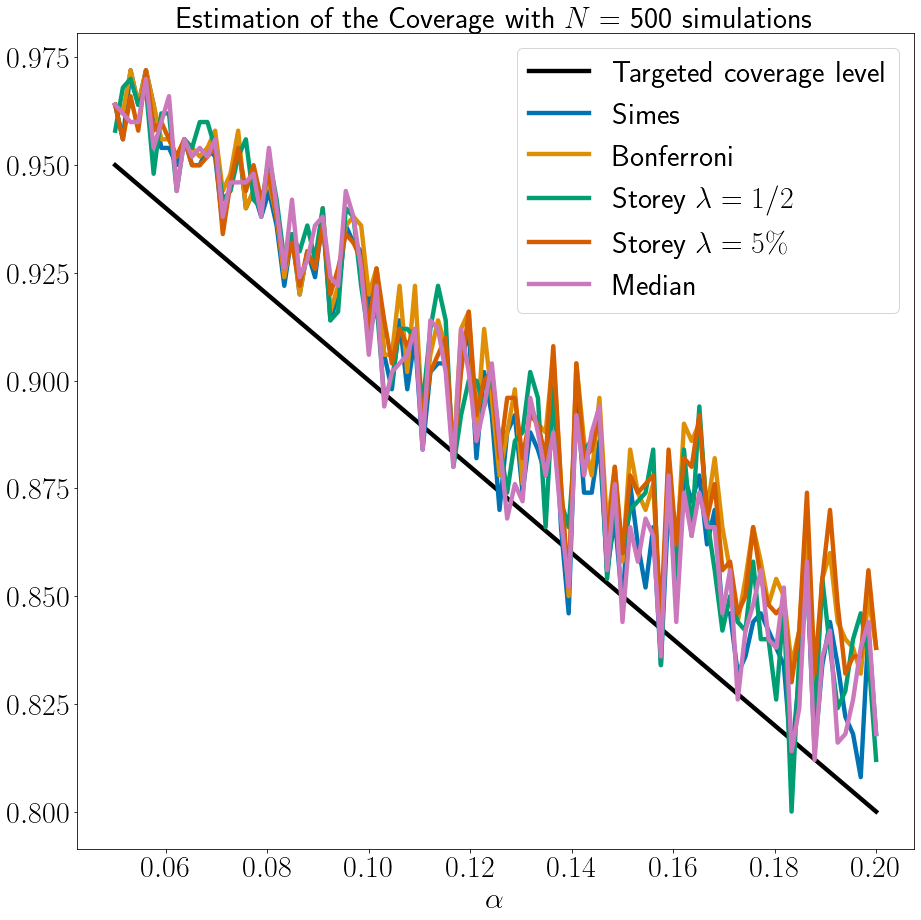

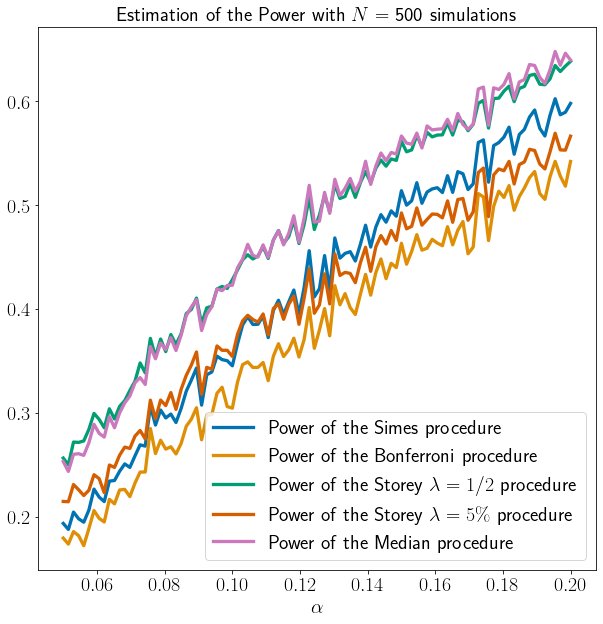

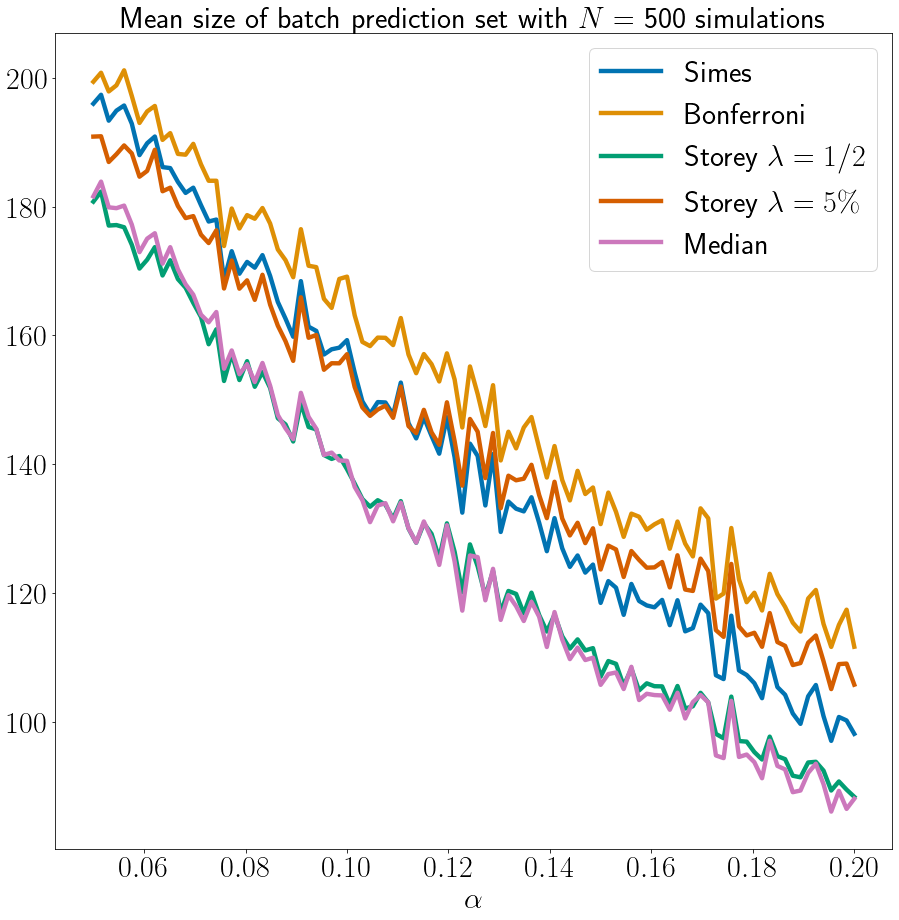

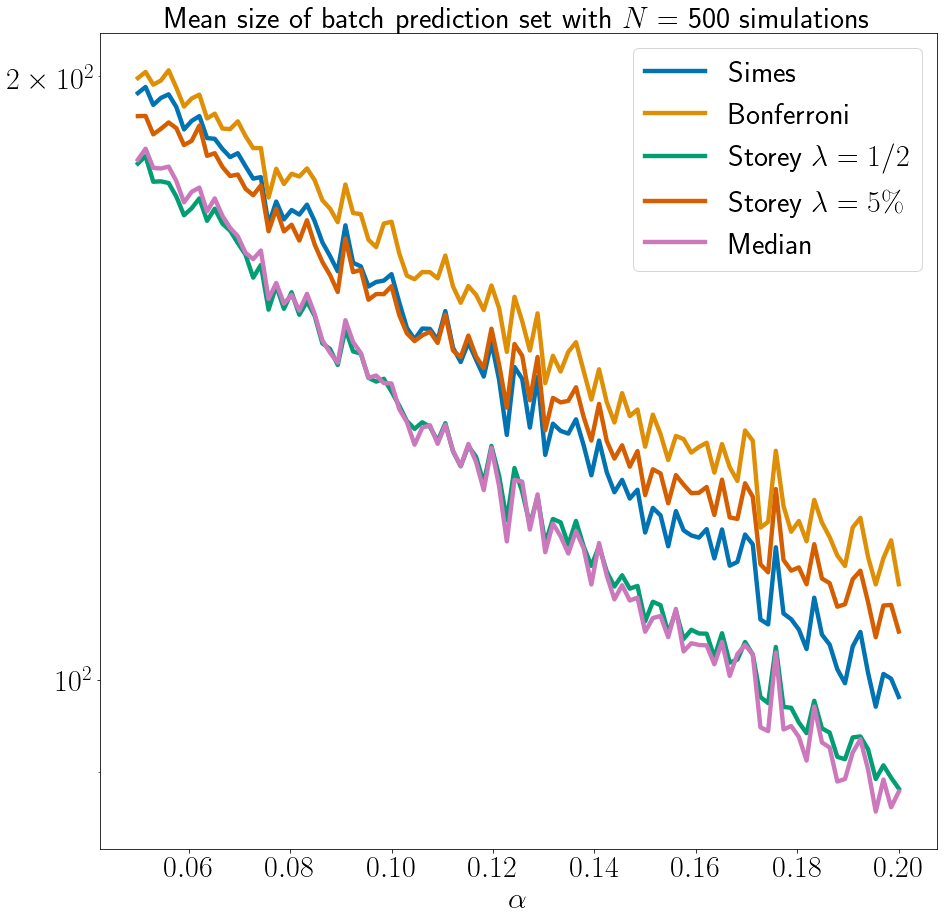

In [120]:
MCov,MPow,MSize=MeanPlot(CoverageMEDIAN,PowerMEDIAN,nPredictMEDIAN,Procedure,AlphaArr)

In [4]:
def ViolinPlot(TotCoverage,TotPower,TotnPredict,Procedure,AlphaArr,NumberAlpha,SaveFigs=False):
    (nProc,nAlpha,N)=np.shape(TotCoverage)
    
    alpha=AlphaArr[NumberAlpha]
    CoverageAlphaPandas=pd.DataFrame(TotCoverage[:,NumberAlpha].T,columns=Procedure)
    PowerAlphaPandas=pd.DataFrame(TotPower[:,NumberAlpha].T, columns=Procedure)
    nPredictAlphaPandas=pd.DataFrame(TotnPredict[:,NumberAlpha].T, columns=Procedure)
    
    
    
    
    plt.figure(figsize=(10,10))
    plt.rc('text.latex', preamble=r'\usepackage{bm} ')
    ep=3.3
    fs=18
    for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
        tickLabel.set_fontsize(fs)

    sns.violinplot(data=CoverageAlphaPandas, linewidth=ep,cut=0)   
    
    
    ax=plt.gca() 
    ax.axhline(y=1-alpha)
    
    
    plt.title(r'Violin plot of the coverage at level $\alpha=$ '+str(alpha)+' with $N=$ '+str(N)+' simulations',fontsize=fs)
    
    plt.legend(fontsize=fs)
    if SaveFigs:
    
        plt.savefig('ViolinPlotCoverage.pdf',format='pdf')
    

    plt.show()
    
    plt.figure(figsize=(10,10))
    plt.rc('text.latex', preamble=r'\usepackage{bm} ')

    for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
        tickLabel.set_fontsize(fs)

    sns.violinplot(data=PowerAlphaPandas, linewidth=ep,cut=0)   
   
    plt.title(r'Violin plot of the power at level $\alpha=$ '+str(alpha)+' with $N=$ '+str(N)+' simulations',fontsize=fs)
    
    plt.legend(fontsize=fs)
    if SaveFigs:
    
        plt.savefig('ViolinPlotPower.pdf',format='pdf')
    

    plt.show()
    
    plt.figure(figsize=(10,10))
    plt.rc('text.latex', preamble=r'\usepackage{bm} ')

    for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
        tickLabel.set_fontsize(fs)

    sns.violinplot(data=nPredictAlphaPandas, linewidth=ep,cut=0)   
   
    plt.title(r'Violin plot of the number in the batched prediction at level $\alpha=$ '+str(alpha)+' with $N=$ '+str(N)+' simulations',fontsize=fs)
    
    plt.legend(fontsize=fs)
    if SaveFigs:
    
        plt.savefig('ViolinPlotnPredict.pdf',format='pdf')
    

    plt.show()
    
    

### You can use it to display directly for different alpha in the AlphaArr with index TabNumberAlpha the violinplot for the size.
def CombinViolinPlot(TotnPredict,Procedure,NumberProc,AlphaArr,TabNumberAlpha,Name,SaveFigs=False,SeeTimes=False,TotTimes=[]):
    (nProc,trash,N)=np.shape(TotnPredict)
    nAlpha=len(TabNumberAlpha)

    
    
    
    IntersetnPredict=TotnPredict[NumberProc]
    InterestProcedure=[Procedure[i] for i in NumberProc]
    
    #plt.figure(figsize=(20,20)) #Multiple Images
    plt.figure(figsize=(20*2/3,10)) ###Single Image (10,10)
    plt.rc('text.latex', preamble=r'\usepackage{bm} ')
    #ep=3.3
    #fs=20
    #fsTitle=20
    ep=4.4
    fs=35
    fsTitle=40
    for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
        tickLabel.set_fontsize(fs)
    plt.title('Violin plot of the size of the prediction set')
   
    
    
    for i,NumberAlpha in enumerate(TabNumberAlpha):
        nPredictAlphaPandas=pd.DataFrame(IntersetnPredict[:,NumberAlpha].T, columns=InterestProcedure)
        
        
        
        plt.subplot(1,nAlpha,i+1)
        plt.title(r"$\alpha=$ "+str(AlphaArr[NumberAlpha]),fontsize=fsTitle)
        sns.violinplot(data=nPredictAlphaPandas, linewidth=ep,cut=0)   
        for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
            tickLabel.set_fontsize(fs)
    
    
    
    if SaveFigs:
    
        plt.savefig('ViolinPlotSize'+Name+'.pdf',format='pdf')
        
    plt.show()
    
    if SeeTimes:

        IntersetTimes=TotTimes[NumberProc]
        InterestProcedure=[Procedure[i] for i in NumberProc]

        plt.figure(figsize=(20,20))
        plt.rc('text.latex', preamble=r'\usepackage{bm} ')
        ep=3.3
        #fs=20
        fs=30
        for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
            tickLabel.set_fontsize(fs)
        plt.title('Violin plot of the times of computation (in second)')



        for i,NumberAlpha in enumerate(TabNumberAlpha):
            TimesAlphaPandas=pd.DataFrame(IntersetTimes[:,NumberAlpha].T, columns=InterestProcedure)



            plt.subplot(1,nAlpha,i+1)
            plt.title(r"$\alpha=$ "+str(AlphaArr[NumberAlpha]),fontsize=fs)
            sns.violinplot(data=TimesAlphaPandas, linewidth=ep,cut=0)   
            for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
                tickLabel.set_fontsize(fs)



        if SaveFigs:

            plt.savefig('ViolinPlotTimes'+Name+'.pdf',format='pdf')        

        
        plt.show()

In [5]:
# Scatter plot with one point has for coordinates the size of the prediction set for the procedure n°NumberProc[0]
# and and the size for the procedure n° NumberProc[1]

def ScatteredPaired(TotnPredict,Procedure,NumberProc,AlphaArr,NumberAlpha,Name,SaveFigs=False):
    (nProc,trash,N)=np.shape(TotnPredict)

    
    
    
    
    IntersetnPredict=TotnPredict[NumberProc]
    print(np.shape(IntersetnPredict))
    InterestProcedure=[Procedure[i] for i in NumberProc]
    
    plt.figure(figsize=(20*2/3,10))
    plt.rc('text.latex', preamble=r'\usepackage{bm} ')
    ep=2.5
    fs=25
    
    
    
    for tickLabel in plt.gca().get_xticklabels() + plt.gca().get_yticklabels():
        tickLabel.set_fontsize(fs)
    
   
    
    
    
    IntersetPoint=IntersetnPredict[:,NumberAlpha]
    print(np.shape(IntersetPoint))
        
    plt.axline((0,0),(1,1),color='black',linewidth=ep,label='Identity')
    plt.title(r"$\alpha=$ "+str(AlphaArr[NumberAlpha]),fontsize=40)
    plt.scatter(IntersetPoint[0],IntersetPoint[1],marker='x',color=colorA,linewidth=ep)
    
    plt.xlabel("Size of the prediction set from the "+ InterestProcedure[0]+" procedure",fontsize=fs)
    plt.ylabel("Size of the prediction set from the "+ InterestProcedure[1]+" procedure",fontsize=fs)

    plt.legend(fontsize=fs)
    
    
    if SaveFigs:
    
        plt.savefig('ScatterPlotSize'+Name+'.pdf',format='pdf')
    

    plt.show()

# USPS Dataset
$\alpha$=Alpha.npy $N=500$, Support-Vector Classifier, $m=3$, $n_{cal}=500$, Class Calibrated $p$-values.

Methods: Simes, Bonf, Storey $0.5$, Storey $0.05$, Median

In [6]:
CoverageUSPSClass_3=np.load('CovMedianUSPSClassRand_500_3.npy')
PowerUSPSClass_3=np.load('PowerMedianUSPSClassRand_500_3.npy')
nPredictUSPSClass_3=np.load('nPredictMedianUSPSClassRand_500_3.npy')

In [36]:
Procedure=['Simes', 'Bonferroni',  r"Storey $\lambda=1/2$",r"Storey $\lambda=5\%$",'Median']

In [40]:
AlphaArr=np.load('Alpha.npy')
AlphaArr

array([0.05      , 0.05151515, 0.0530303 , 0.05454545, 0.05606061,
       0.05757576, 0.05909091, 0.06060606, 0.06212121, 0.06363636,
       0.06515152, 0.06666667, 0.06818182, 0.06969697, 0.07121212,
       0.07272727, 0.07424242, 0.07575758, 0.07727273, 0.07878788,
       0.08030303, 0.08181818, 0.08333333, 0.08484848, 0.08636364,
       0.08787879, 0.08939394, 0.09090909, 0.09242424, 0.09393939,
       0.09545455, 0.0969697 , 0.09848485, 0.1       , 0.10151515,
       0.1030303 , 0.10454545, 0.10606061, 0.10757576, 0.10909091,
       0.11060606, 0.11212121, 0.11363636, 0.11515152, 0.11666667,
       0.11818182, 0.11969697, 0.12121212, 0.12272727, 0.12424242,
       0.12575758, 0.12727273, 0.12878788, 0.13030303, 0.13181818,
       0.13333333, 0.13484848, 0.13636364, 0.13787879, 0.13939394,
       0.14090909, 0.14242424, 0.14393939, 0.14545455, 0.1469697 ,
       0.14848485, 0.15      , 0.15151515, 0.1530303 , 0.15454545,
       0.15606061, 0.15757576, 0.15909091, 0.16060606, 0.16212

In [12]:
AlphaArr[33]

0.1

In [7]:
MCov,MPow,MSize=MeanPlot(CoverageUSPSClass_3,PowerUSPSClass_3,nPredictUSPSClass_3,Procedure,AlphaArr,SaveFigs=False)

NameError: name 'CoverageUSPSClass_3' is not defined

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


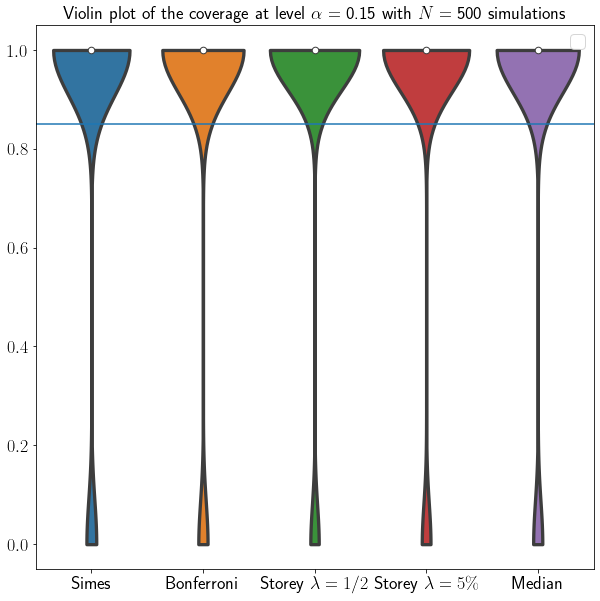

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


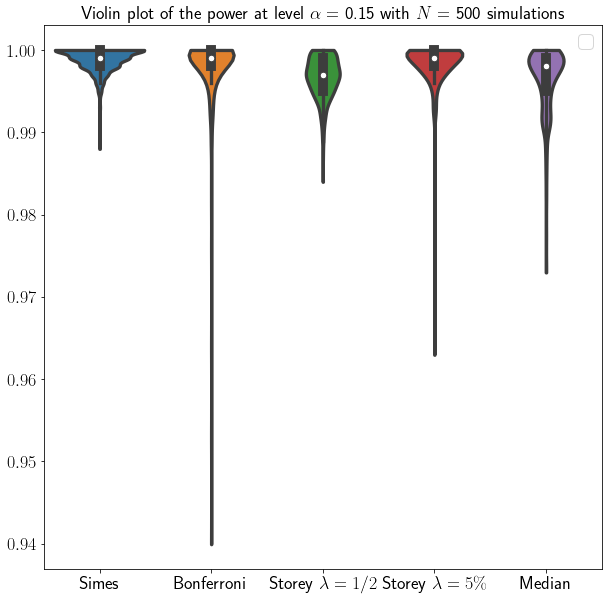

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


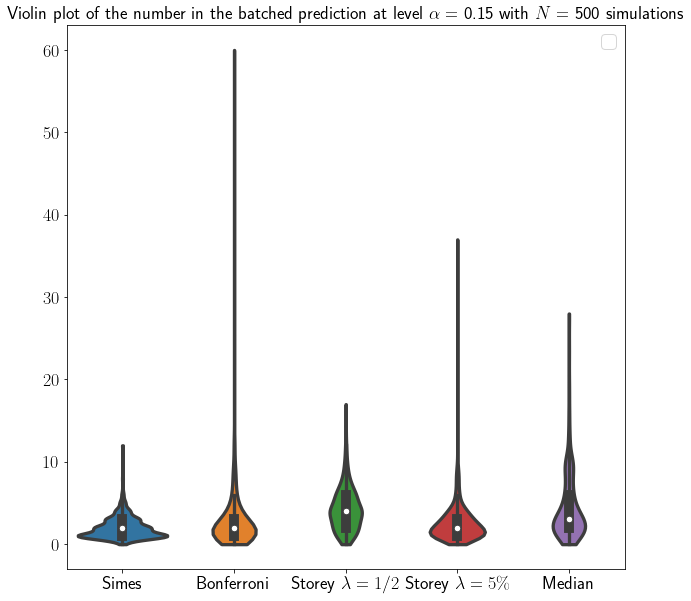

In [10]:
ViolinPlot(CoverageUSPSClass_3,PowerUSPSClass_3,nPredictUSPSClass_3,Procedure,AlphaArr,66)

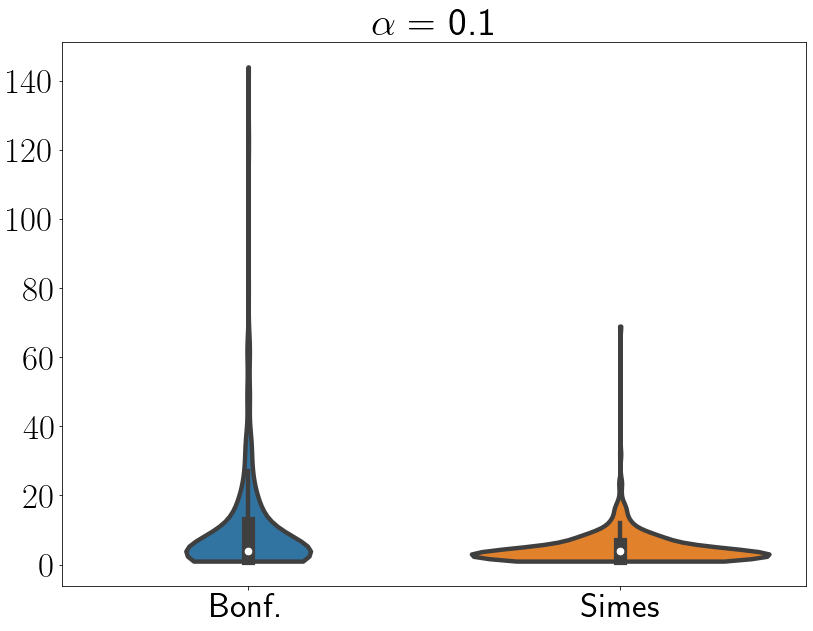

In [27]:
CombinViolinPlot(nPredictUSPSClass_3,Procedure,[1,0],AlphaArr,[33],'IntroUSPSQuaterBis',SaveFigs=True,SeeTimes=False,TotTimes=[])

(2, 100, 500)
(2, 500)


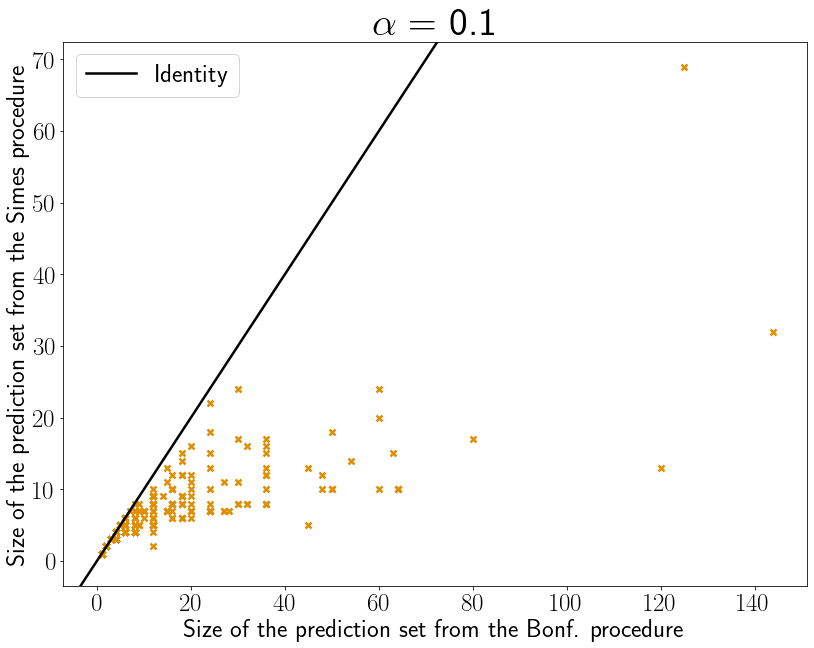

In [36]:
ScatteredPaired(nPredictUSPSClass_3,Procedure,[1,0],AlphaArr,33,'IntroCrossedBis',True)

# USPS with Fisher

$\alpha$=AlphaViolin.npy $N=500$, Support-Vector Classifier, $m=3$, $n_{cal}=500$, Class Calibrated $p$-values.

Methods: Simes, Bonf, Storey $0.5$, Storey $0.05$, Median, Fisher

In [13]:
CovUSPSFisher=np.load('CovMedianUSPSViolinFisher_700_3.npy')
PowerUSPSFisher=np.load('PowerMedianUSPSViolinFisher_700_3.npy')
SizeUSPSFisher=np.load('nPredictMedianUSPSViolinFisher_700_3.npy')

In [14]:
NewProcedure=['Simes', 'Bonf.',  r"Storey",r'Storey $5\%$','Median','Fisher']

In [15]:
AlphaViolin=np.load('AlphaViolin.npy')
AlphaViolin

array([0.01, 0.05, 0.1 ])

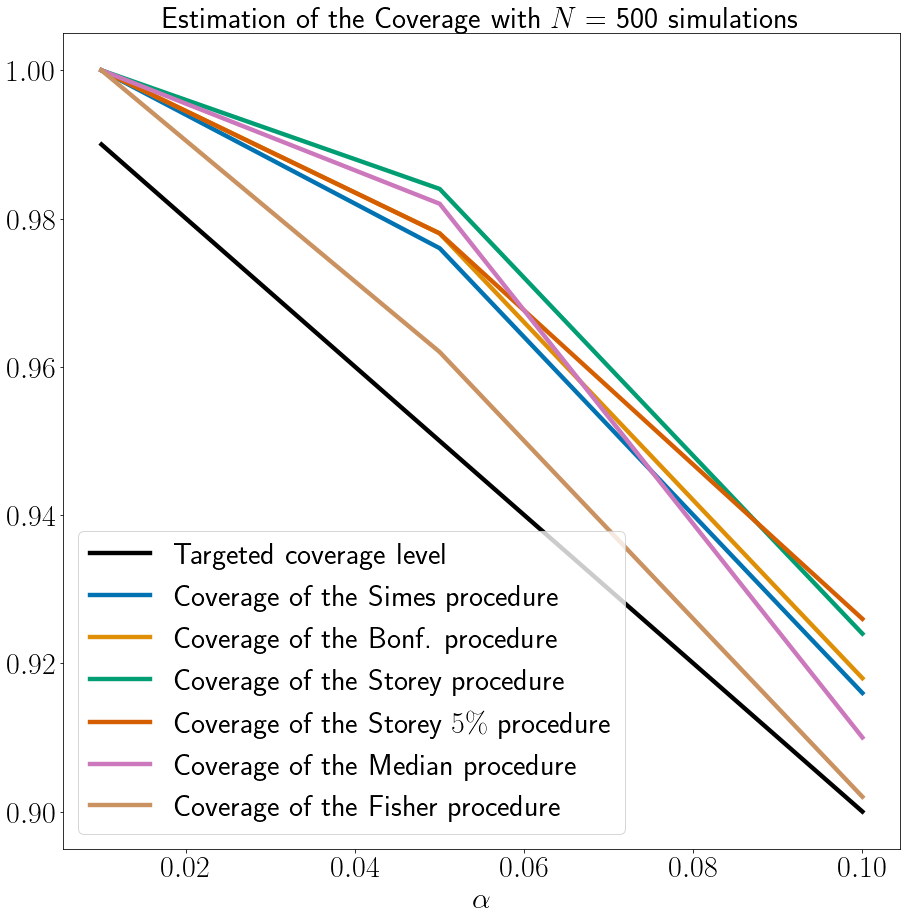

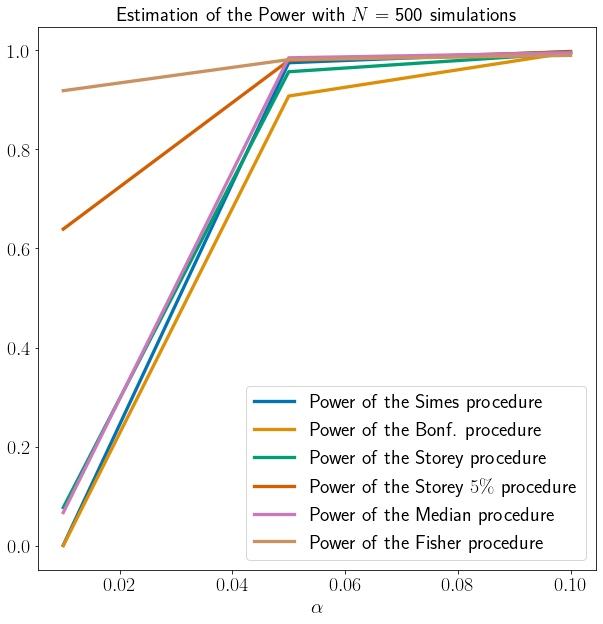

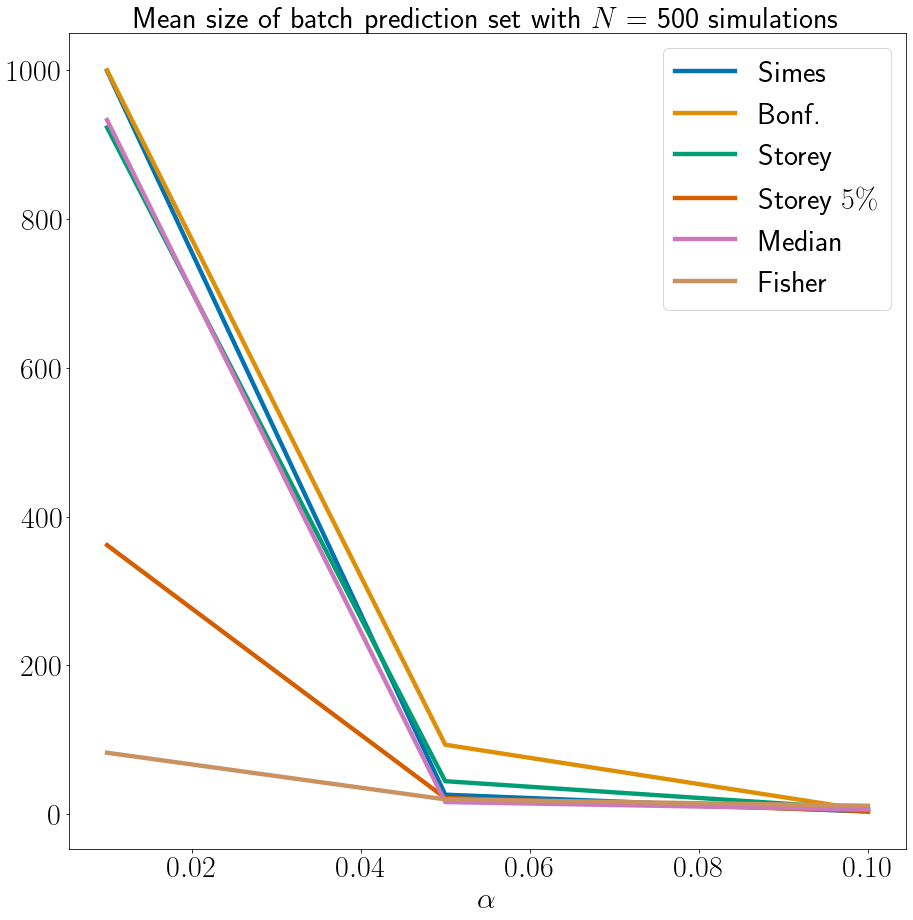

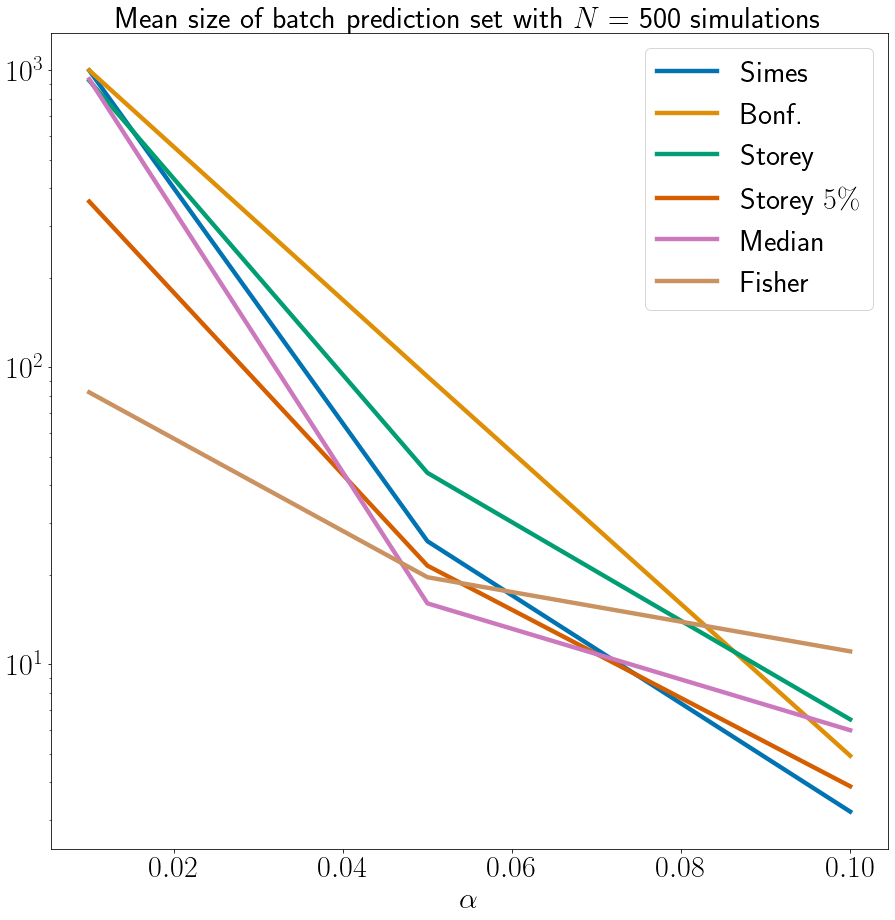

In [32]:
MCov,MPow,MSize=MeanPlot(CovUSPSFisher,PowerUSPSFisher,SizeUSPSFisher,NewProcedure,AlphaViolin)

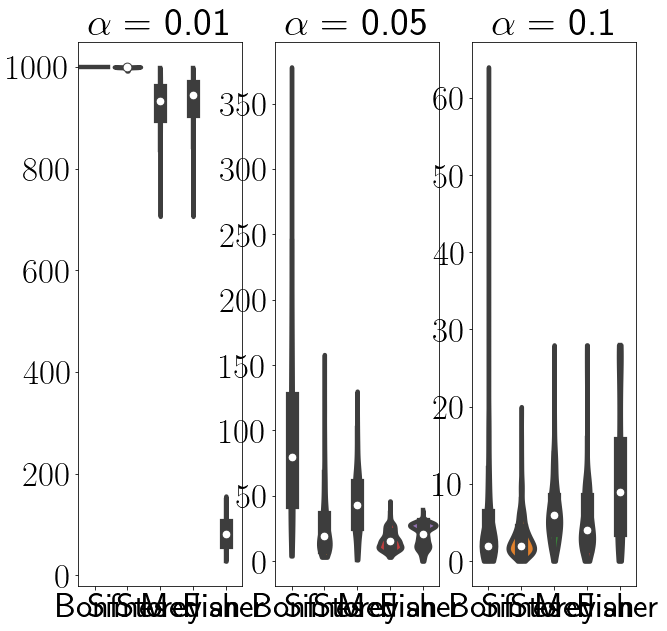

In [33]:
CombinViolinPlot(SizeUSPSFisher,NewProcedure,np.array([1,0,2,4,5]).astype(int),AlphaViolin,np.array([0,1,2]).astype(int),"USPSINTROTER")

# USPS Dataset
$\alpha$=AlphaBis.npy $N=500$, Support-Vector Classifier, $m=3$, $n_{cal}=500$, Class Calibrated $p$-values.

Methods: Simes, Bonf, Storey $0.5$, Storey $0.05$, Median, Fisher

In [16]:
TotCovUSPS_500_3=np.load('TotCovUSPS_500_3.npy')
TotPowerUSPS_500_3=np.load('TotPowerUSPS_500_3.npy')
TotnPredictUSPS_500_3=np.load('TotnPredictUSPS_500_3.npy')

In [17]:
AlphaBis=np.load('AlphaBis.npy')
AlphaBis

array([0.01      , 0.01183673, 0.01367347, 0.0155102 , 0.01734694,
       0.01918367, 0.02102041, 0.02285714, 0.02469388, 0.02653061,
       0.02836735, 0.03020408, 0.03204082, 0.03387755, 0.03571429,
       0.03755102, 0.03938776, 0.04122449, 0.04306122, 0.04489796,
       0.04673469, 0.04857143, 0.05040816, 0.0522449 , 0.05408163,
       0.05591837, 0.0577551 , 0.05959184, 0.06142857, 0.06326531,
       0.06510204, 0.06693878, 0.06877551, 0.07061224, 0.07244898,
       0.07428571, 0.07612245, 0.07795918, 0.07979592, 0.08163265,
       0.08346939, 0.08530612, 0.08714286, 0.08897959, 0.09081633,
       0.09265306, 0.0944898 , 0.09632653, 0.09816327, 0.1       ])

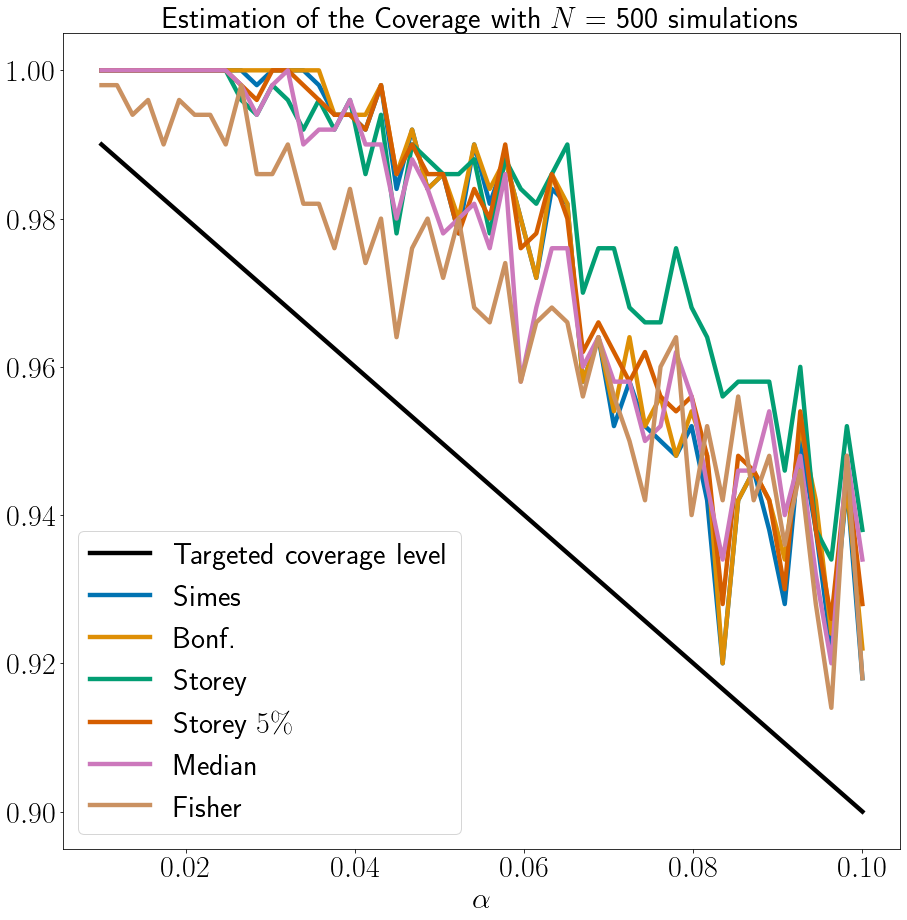

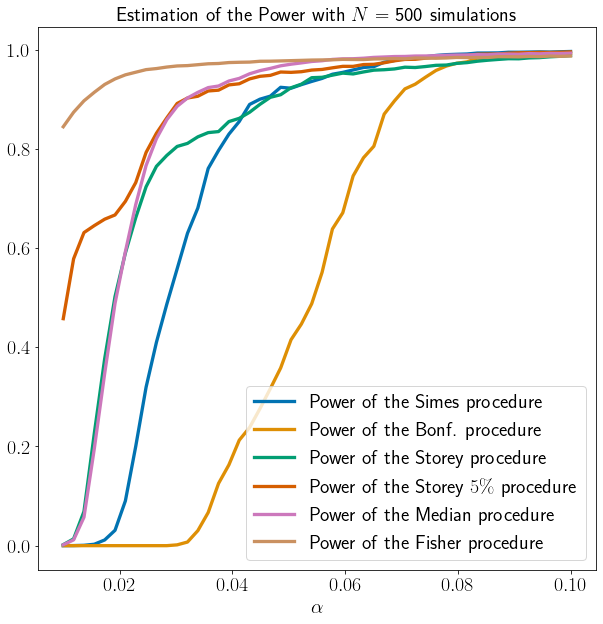

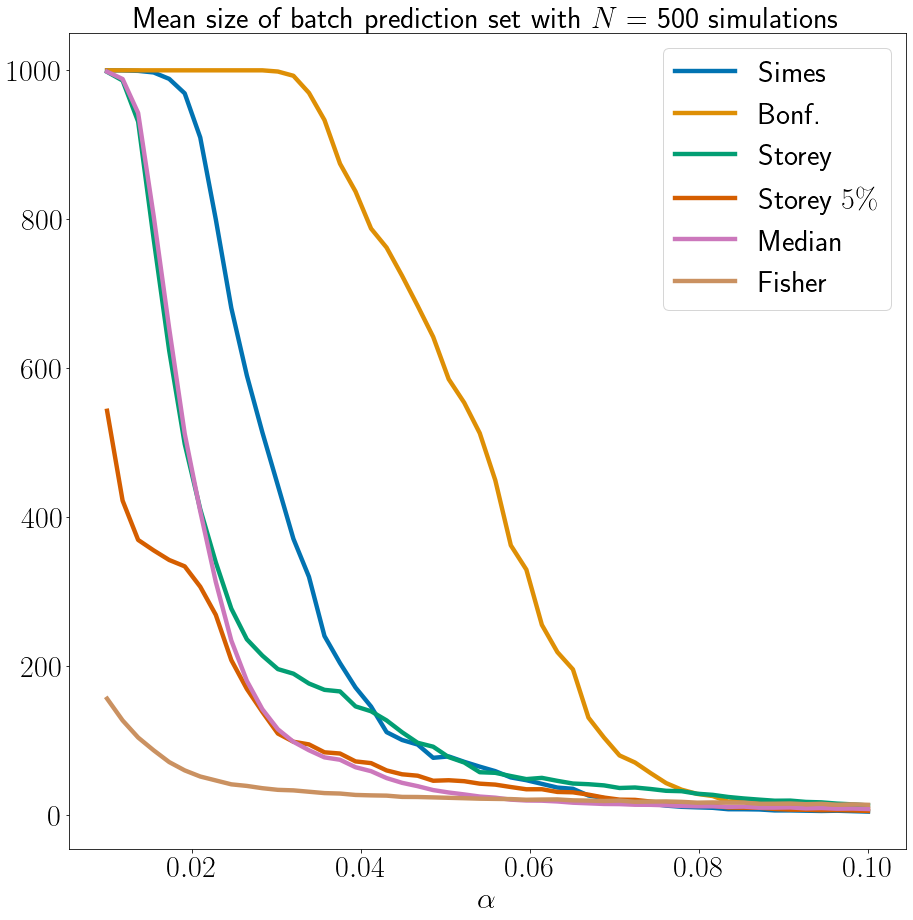

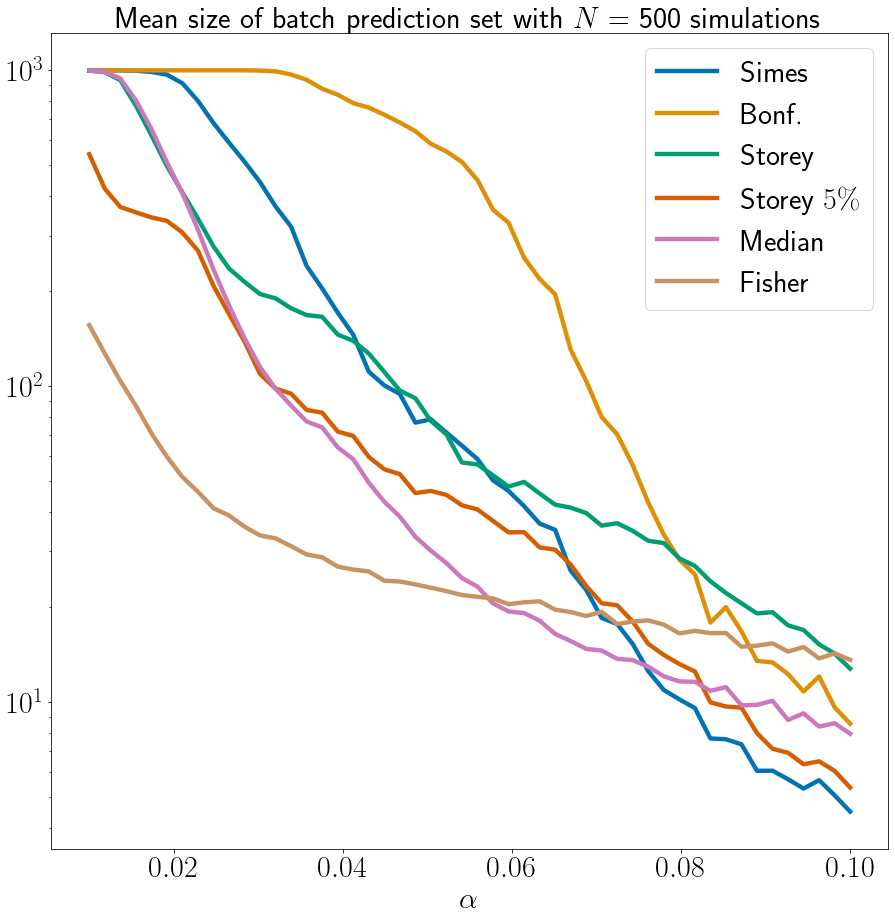

In [18]:
MCov,MPow,MSize=MeanPlot(TotCovUSPS_500_3,TotPowerUSPS_500_3,TotnPredictUSPS_500_3,NewProcedure,AlphaBis)

In [19]:
# We remove Storey 5% procedure from the graph
TotCovUSPS_500_3Bis=np.zeros((5,50,500))
TotCovUSPS_500_3Bis[:3]=TotCovUSPS_500_3[:3]
TotCovUSPS_500_3Bis[3:]=TotCovUSPS_500_3[4:]

TotPowerUSPS_500_3Bis=np.zeros((5,50,500))
TotPowerUSPS_500_3Bis[:3]=TotPowerUSPS_500_3[:3]
TotPowerUSPS_500_3Bis[3:]=TotPowerUSPS_500_3[4:]

TotnPredictUSPS_500_3Bis=np.zeros((5,50,500))
TotnPredictUSPS_500_3Bis[:3]=TotnPredictUSPS_500_3[:3]
TotnPredictUSPS_500_3Bis[3:]=TotnPredictUSPS_500_3[4:]

NewProcedureBis=np.zeros(5).astype(str)
NewProcedureBis[:3]=NewProcedure[:3]
NewProcedureBis[3:]=NewProcedure[4:]

print(NewProcedureBis)

['Simes' 'Bonf.' 'Storey' 'Median' 'Fisher']


# (To Use)

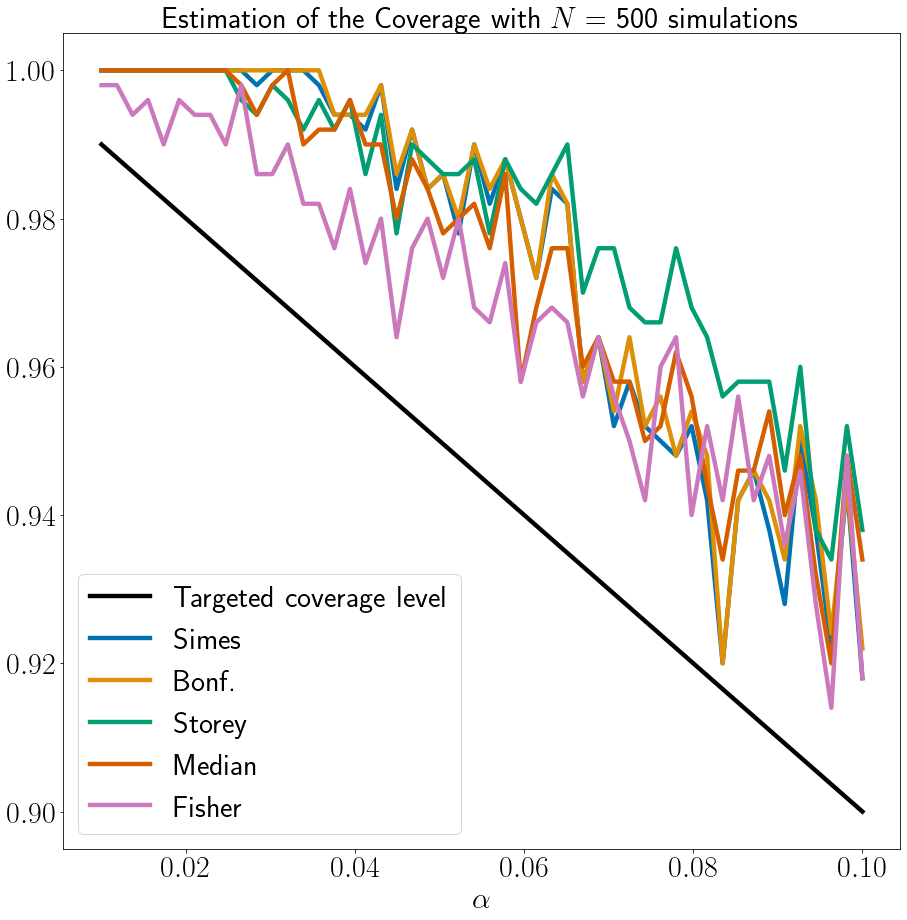

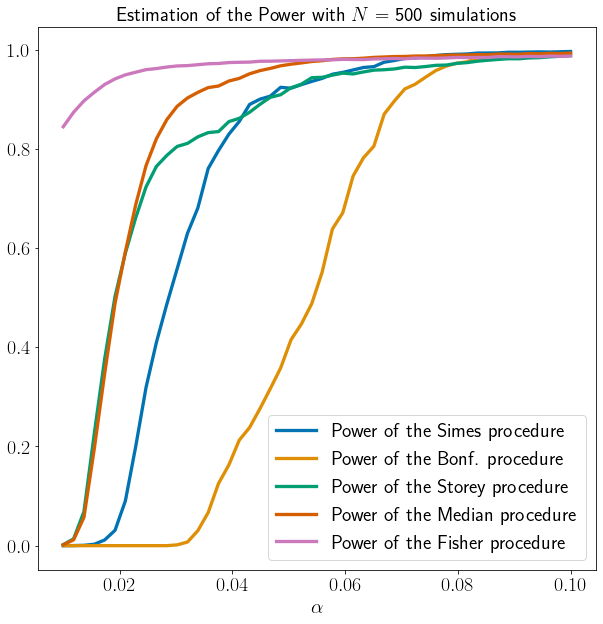

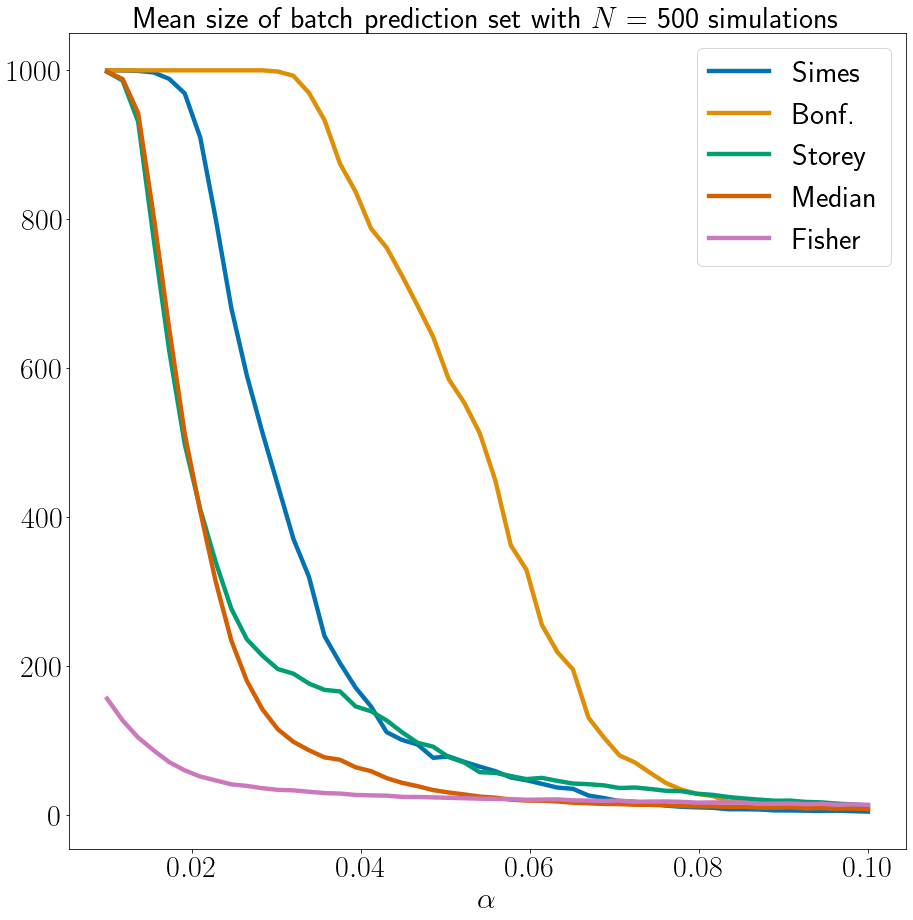

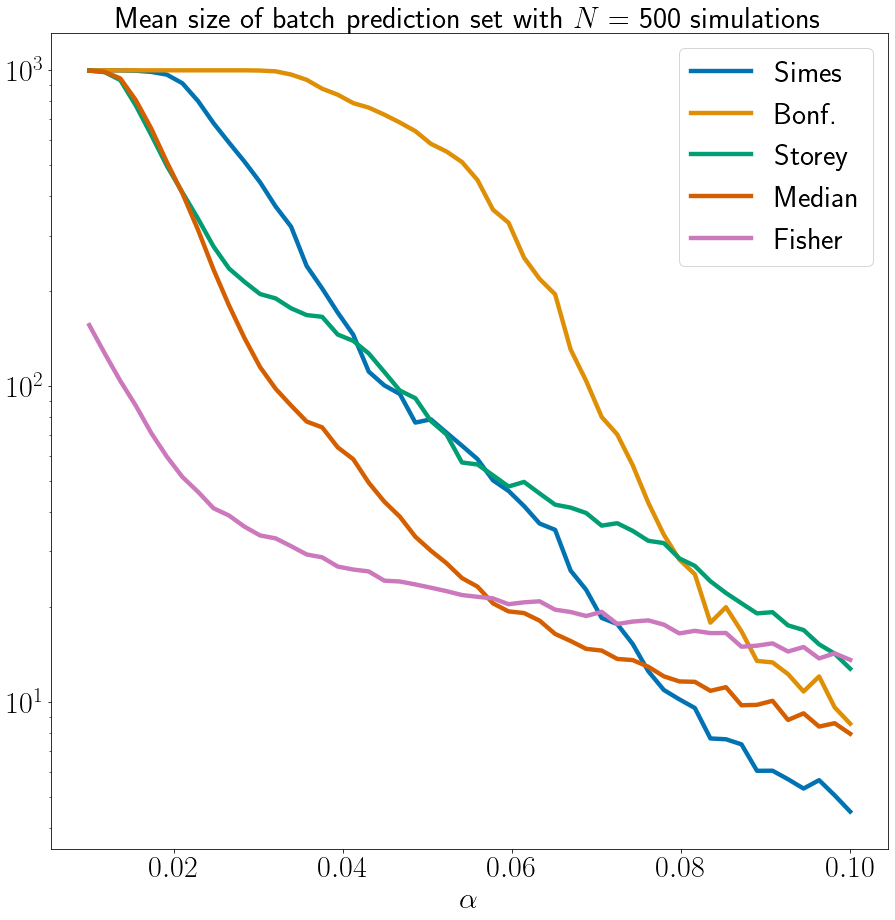

In [169]:
MCov,MPow,MSize=MeanPlot(TotCovUSPS_500_3Bis,TotPowerUSPS_500_3Bis,TotnPredictUSPS_500_3Bis,NewProcedureBis,AlphaBis,'USPS_Final1',True)

In [32]:
np.max(np.std((TotCovUSPS_500_3Bis),axis=2))

0.2803640490505157

# USPS Dataset
$\alpha$=Alpha.npy $N=500$, Support-Vector Classifier, $m=3$, $n_{cal}=700$, Class Calibrated $p$-values.

Methods: Simes, Bonf, Storey $0.5$, Storey $0.05$, Median, Fisher

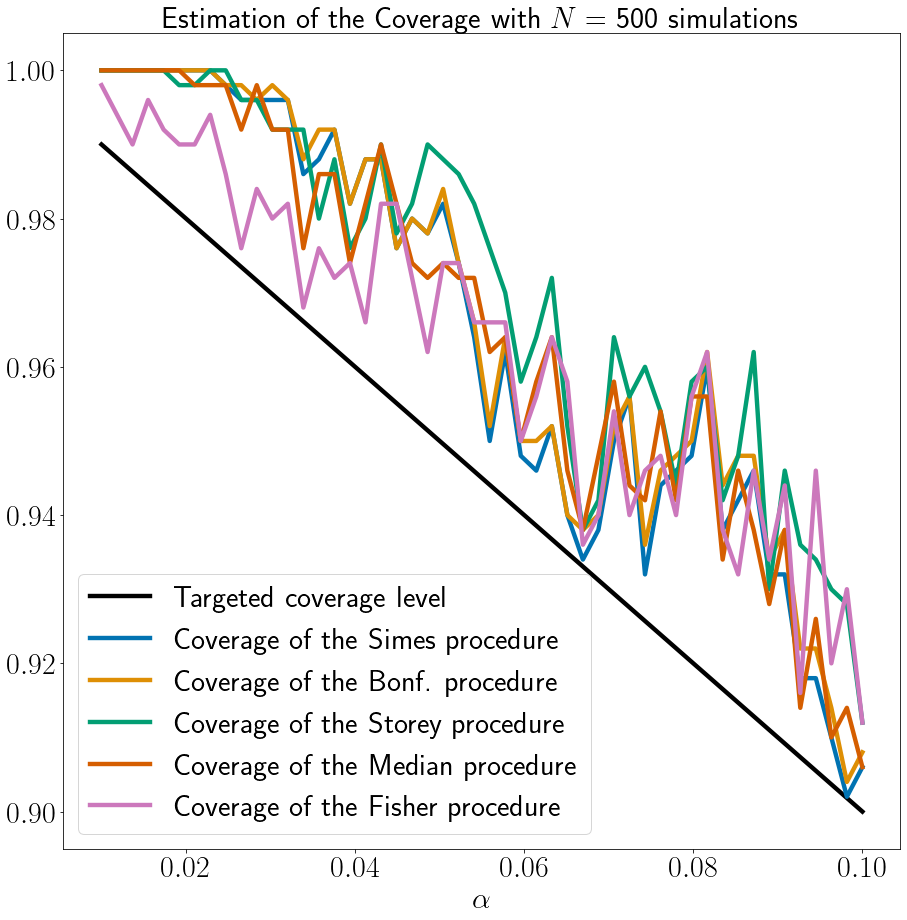

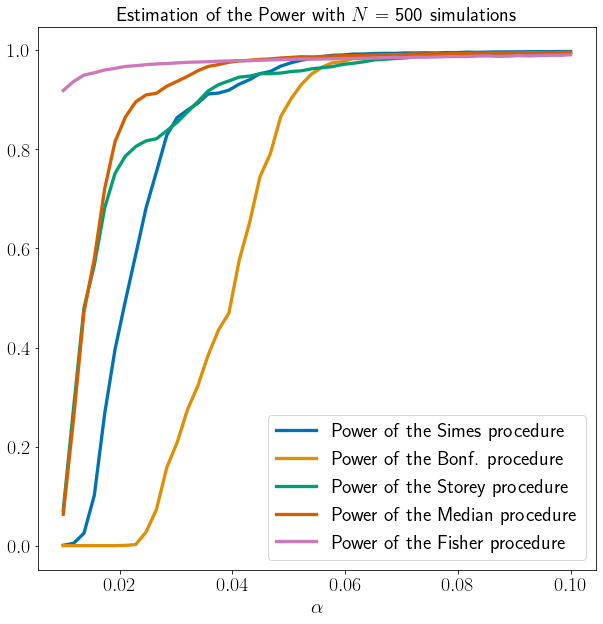

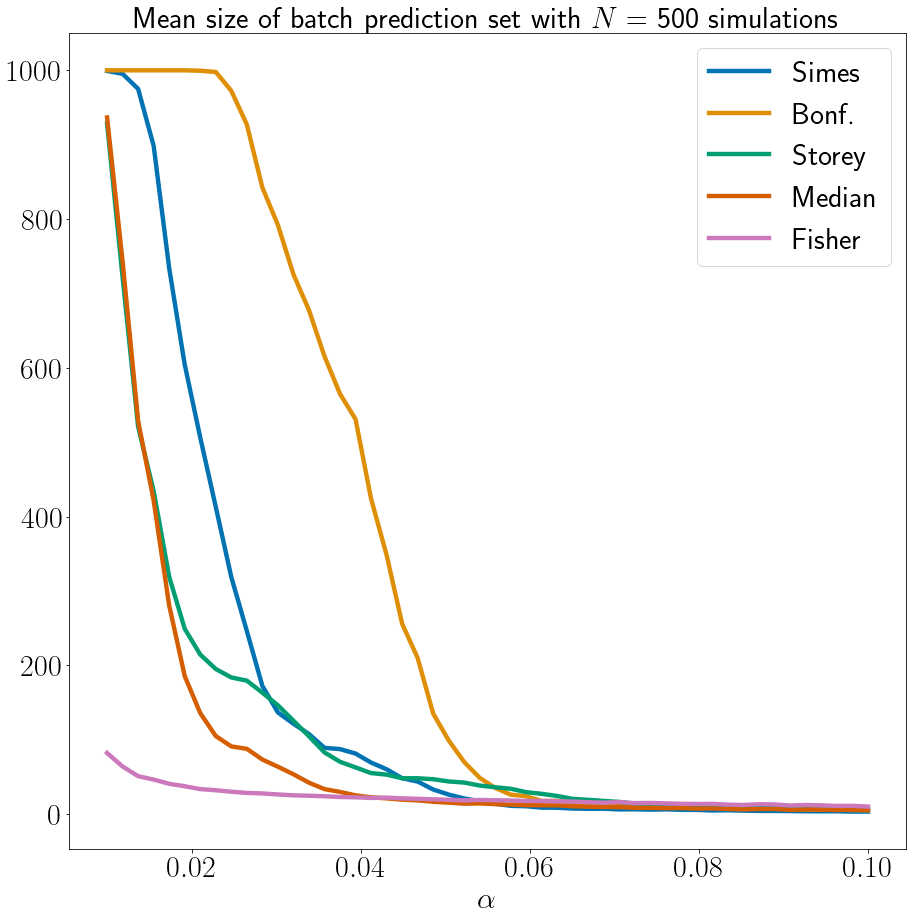

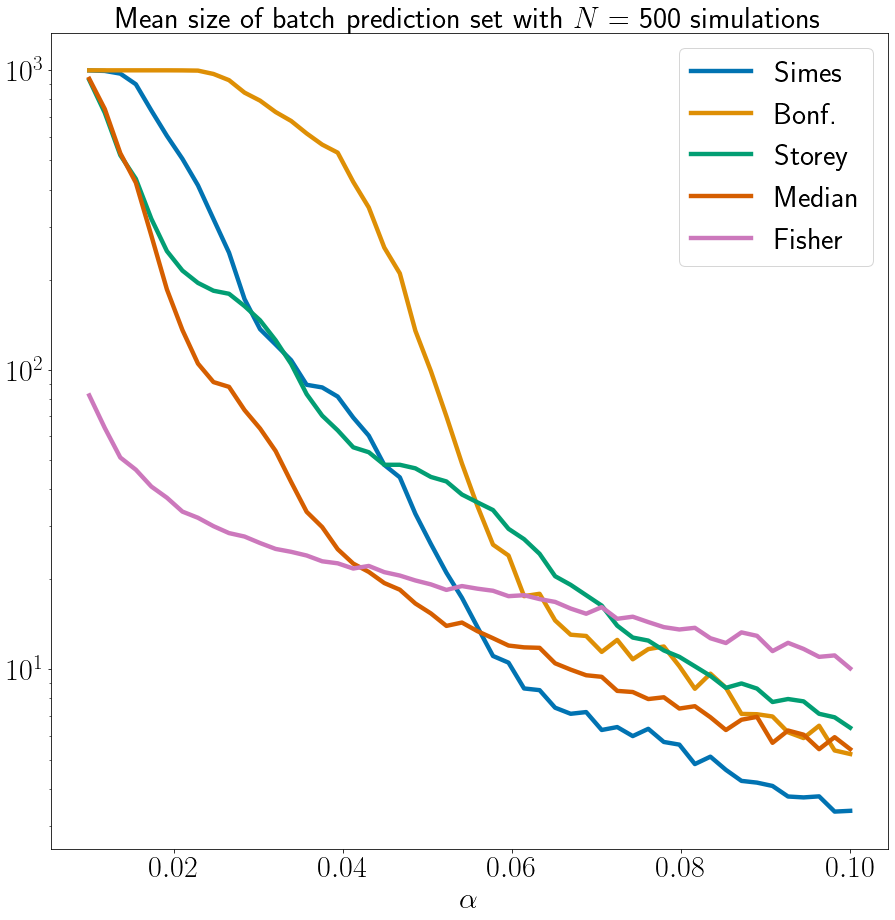

In [39]:
TotCovUSPS_700_3=np.load('TotCovUSPS_700_3.npy')
TotPowerUSPS_700_3=np.load('TotPowerUSPS_700_3.npy')
TotnPredictUSPS_700_3=np.load('TotnPredictUSPS_700_3.npy')

# We remove Storey 5% procedure for the graph
TotCovUSPS_700_3Bis=np.zeros((5,50,500))
TotCovUSPS_700_3Bis[:3]=TotCovUSPS_700_3[:3]
TotCovUSPS_700_3Bis[3:]=TotCovUSPS_700_3[4:]

TotPowerUSPS_700_3Bis=np.zeros((5,50,500))
TotPowerUSPS_700_3Bis[:3]=TotPowerUSPS_700_3[:3]
TotPowerUSPS_700_3Bis[3:]=TotPowerUSPS_700_3[4:]

TotnPredictUSPS_700_3Bis=np.zeros((5,50,500))
TotnPredictUSPS_700_3Bis[:3]=TotnPredictUSPS_700_3[:3]
TotnPredictUSPS_700_3Bis[3:]=TotnPredictUSPS_700_3[4:]

MCov,MPow,MSize=MeanPlot(TotCovUSPS_700_3Bis,TotPowerUSPS_700_3Bis,TotnPredictUSPS_700_3Bis,NewProcedureBis,AlphaBis,'USPSFinal')

# CIFAR Dataset
$\alpha$=Alpha.npy $N=500$, Convolutional Neural Network, $m=5$, $n_{cal}=1000$, Class Calibrated $p$-values.

Methods: Simes, Bonf, Storey $0.5$, Storey $0.05$, Median. 

In [42]:
CoverageMEDIAN=np.load('CovMedianCIFAR.npy')
PowerMEDIAN=np.load('PowerMedianCIFAR.npy')
nPredictMEDIAN=np.load('nPredictMedianCIFAR.npy')

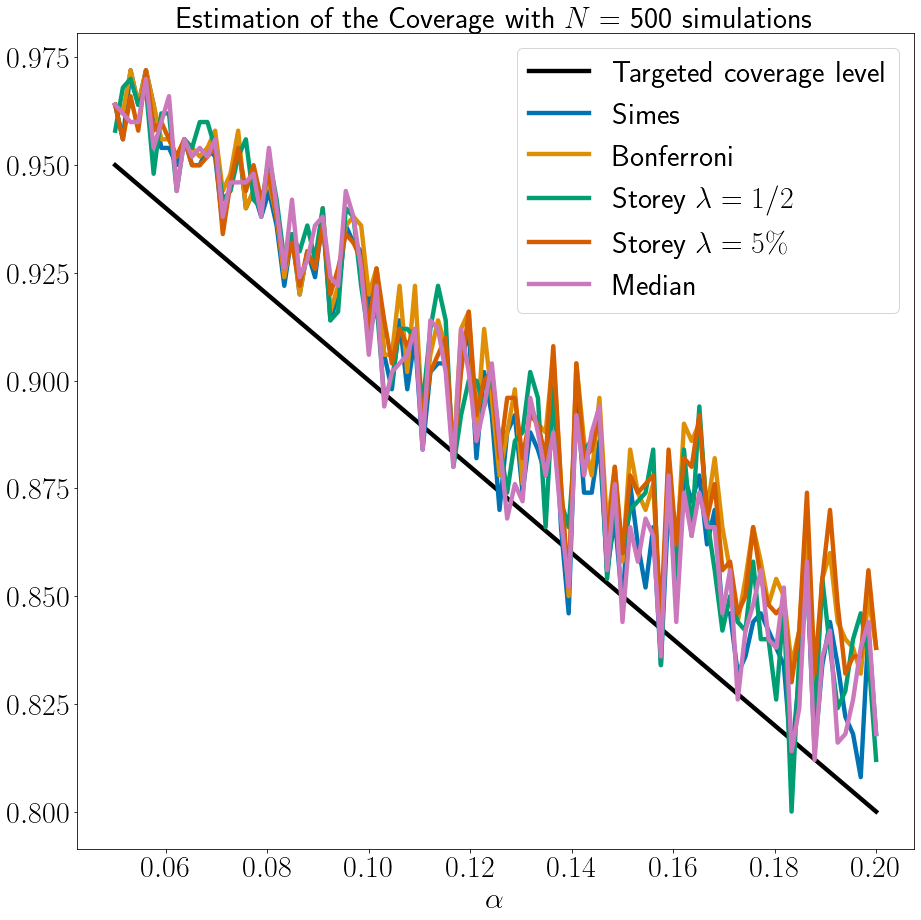

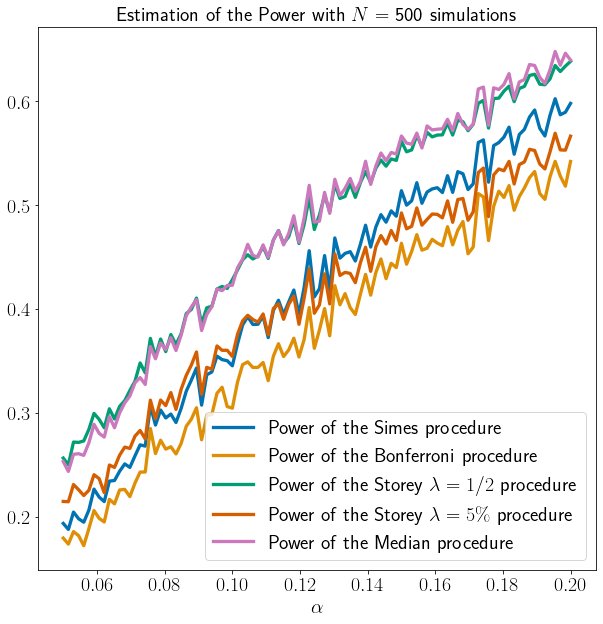

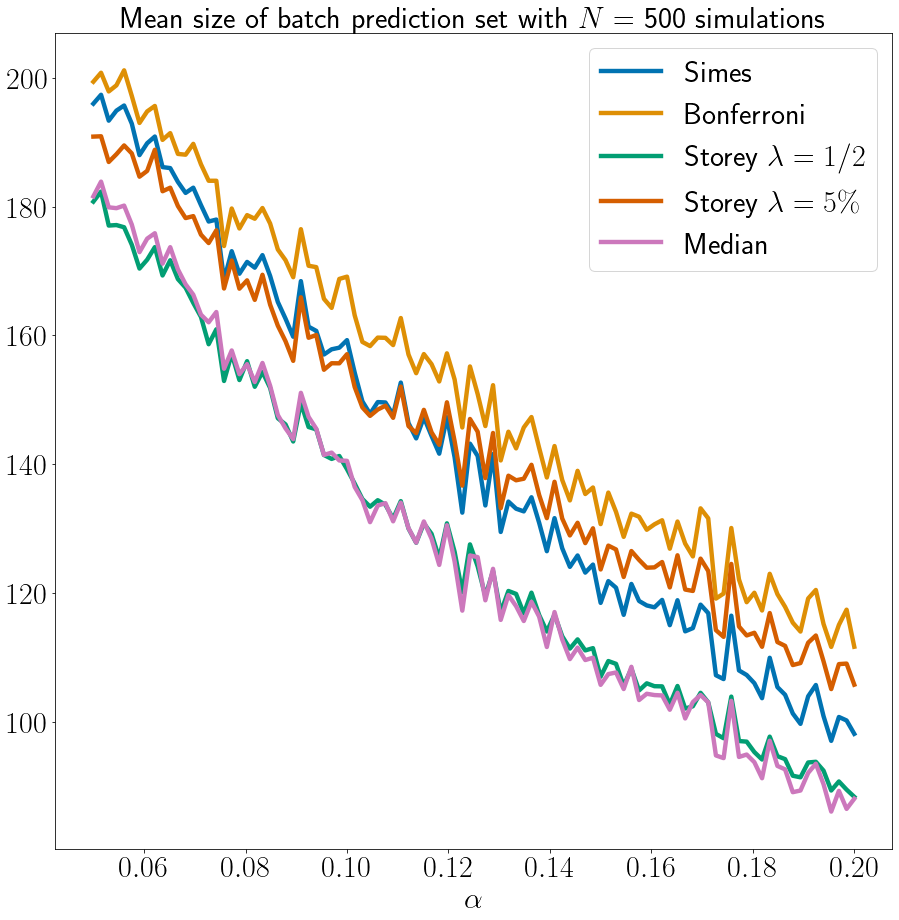

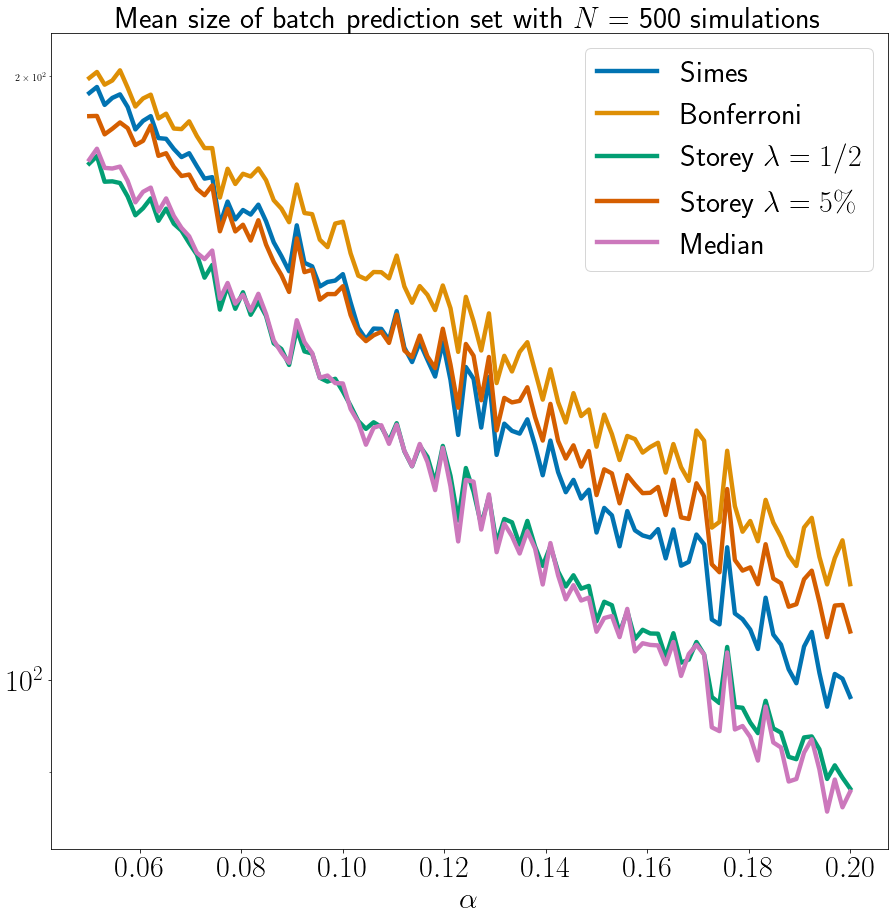

In [43]:
MCov,MPow,MSize=MeanPlot(CoverageMEDIAN,PowerMEDIAN,nPredictMEDIAN,Procedure,AlphaArr)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


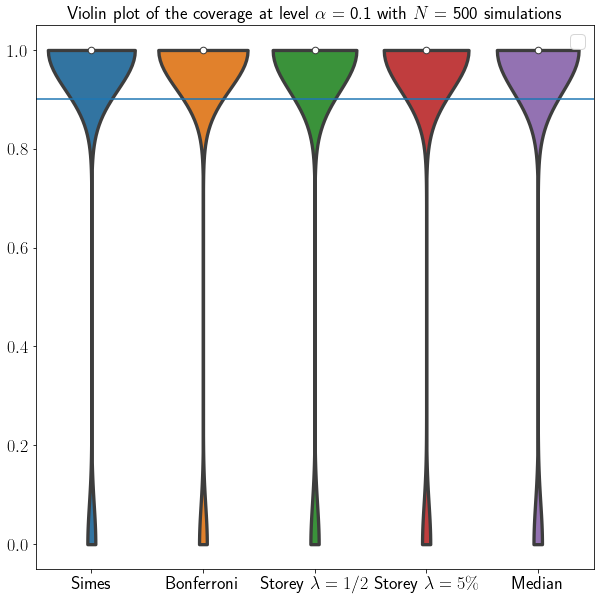

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


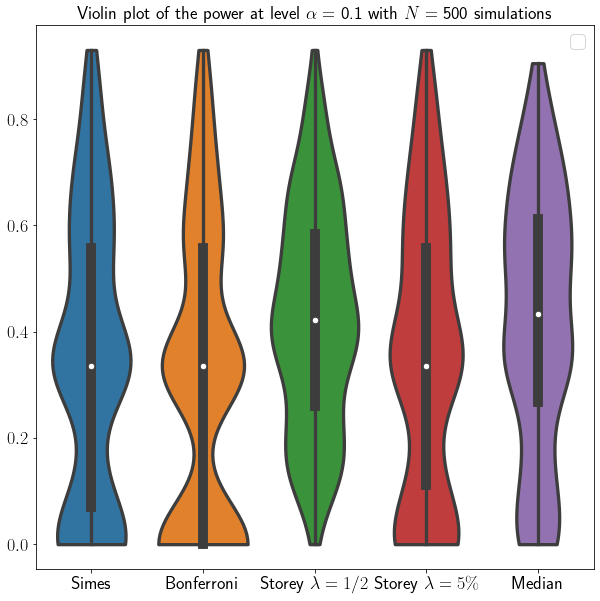

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


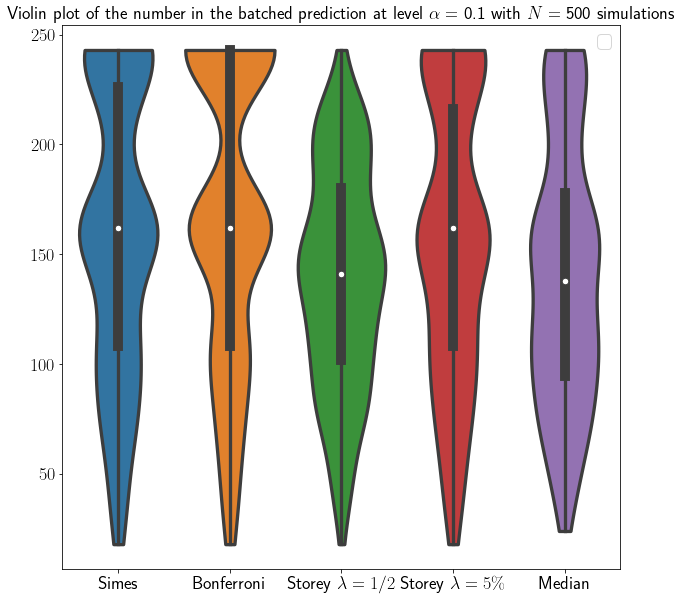

In [42]:
ViolinPlot(CoverageMEDIAN,PowerMEDIAN,nPredictMEDIAN,Procedure,AlphaArr,33)

# CIFAR with Fisher

$\alpha$=AlphaViolin.npy Convolutional Neural Network, $m=5$, $n_{cal}=2000$, Class Calibrated $p$-values.

Methods: Simes, Bonf, Storey $0.5$, Storey $0.05$, Median, Fisher

In [43]:
CovCIFARFisher=np.load('CovMedianCIFARViolinFisher_2000_5.npy')
PowerCIFARFisher=np.load('PowerMedianCIFARViolinFisher_2000_5.npy')
SizeCIFARFisher=np.load('nPredictMedianCIFARViolinFisher_2000_5.npy')

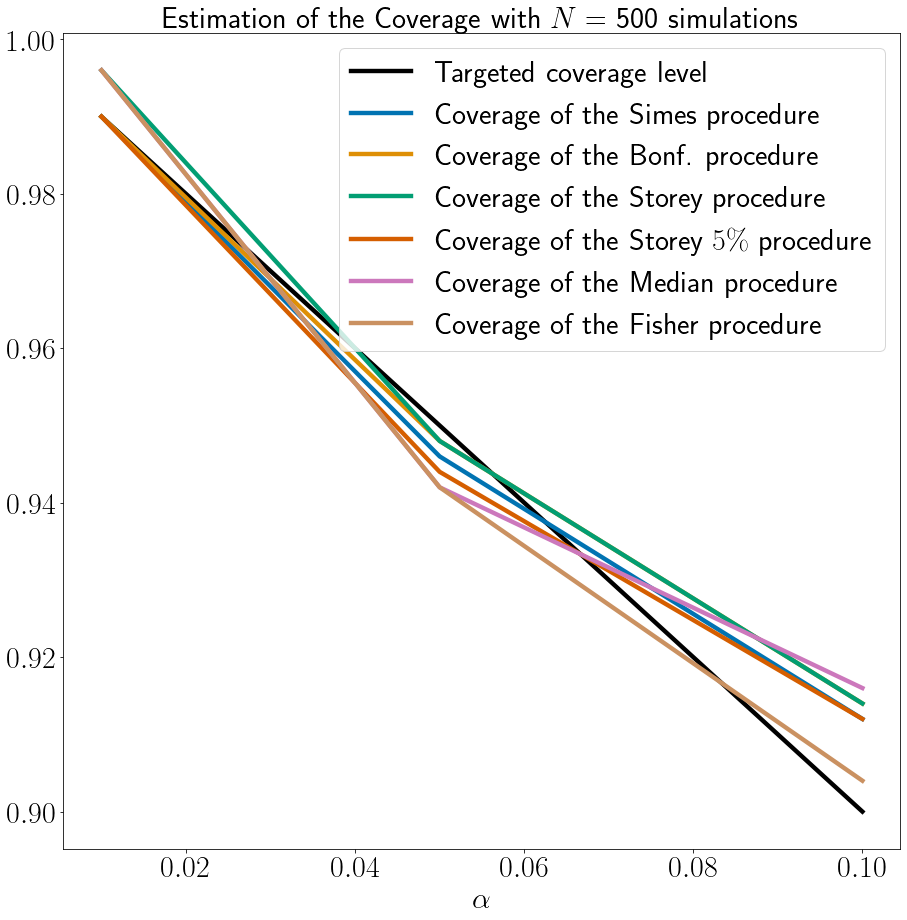

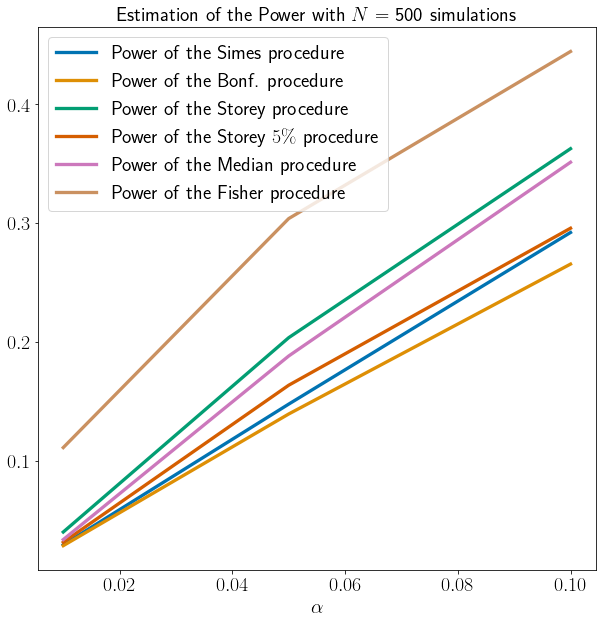

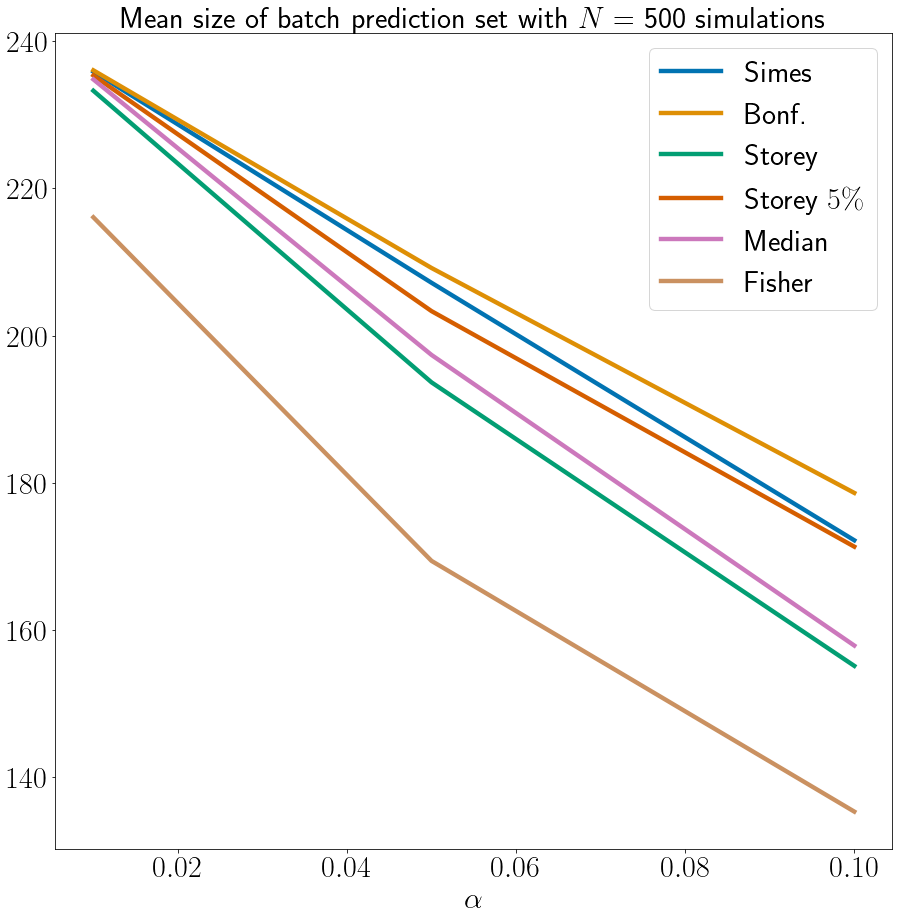

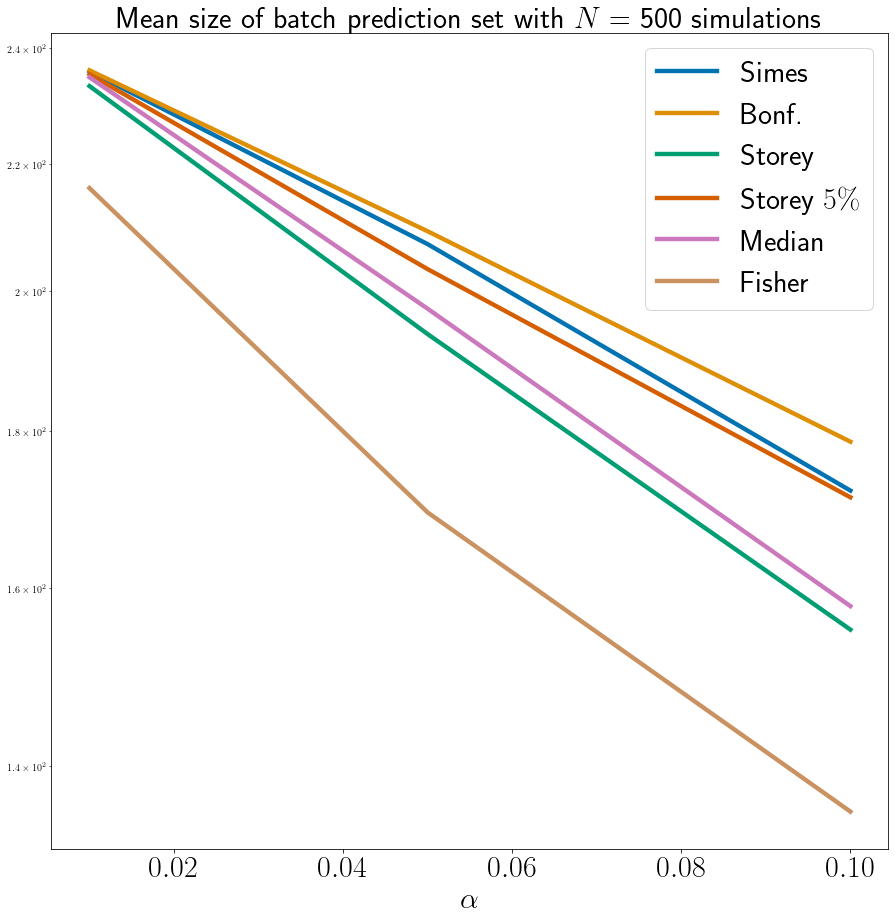

In [44]:
MCov,MPow,MSize=MeanPlot(CovCIFARFisher,PowerCIFARFisher,SizeCIFARFisher,NewProcedure,AlphaViolin)

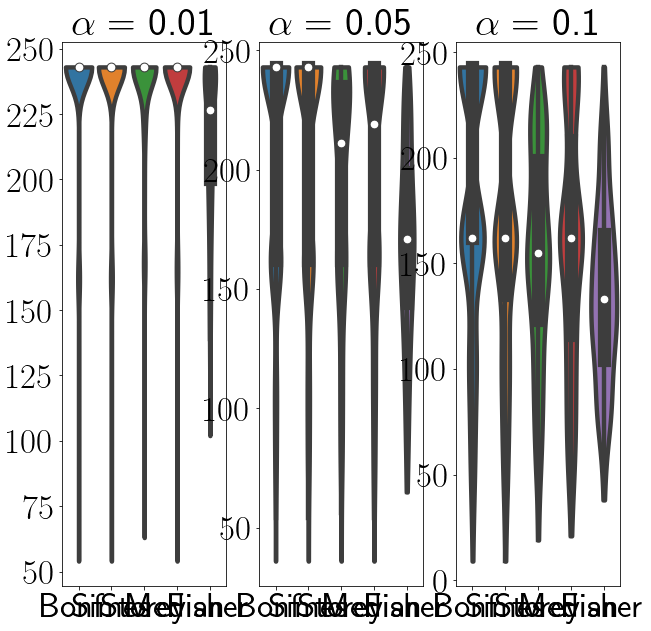

In [45]:
CombinViolinPlot(SizeCIFARFisher,NewProcedure,np.array([1,0,2,4,5]).astype(int),AlphaViolin,np.array([0,1,2]).astype(int),"CIFARFisher")

# CIFAR Dataset

$\alpha$=AlphaBis.npy Convolutional Neural Network, $m=5$, $n_{cal}=1000$, Class Calibrated $p$-values.

Methods: Simes, Bonf, Storey $0.5$, Storey $0.05$, Median, Fisher

In [162]:
TotCovCIFAR_1000_5=np.load('TotCovCIFAR_1000_5.npy')
TotPowerCIFAR_1000_5=np.load('TotPowerCIFAR_1000_5.npy')
TotnPredictCIFAR_1000_5=np.load('TotnPredictCIFAR_1000_5.npy')

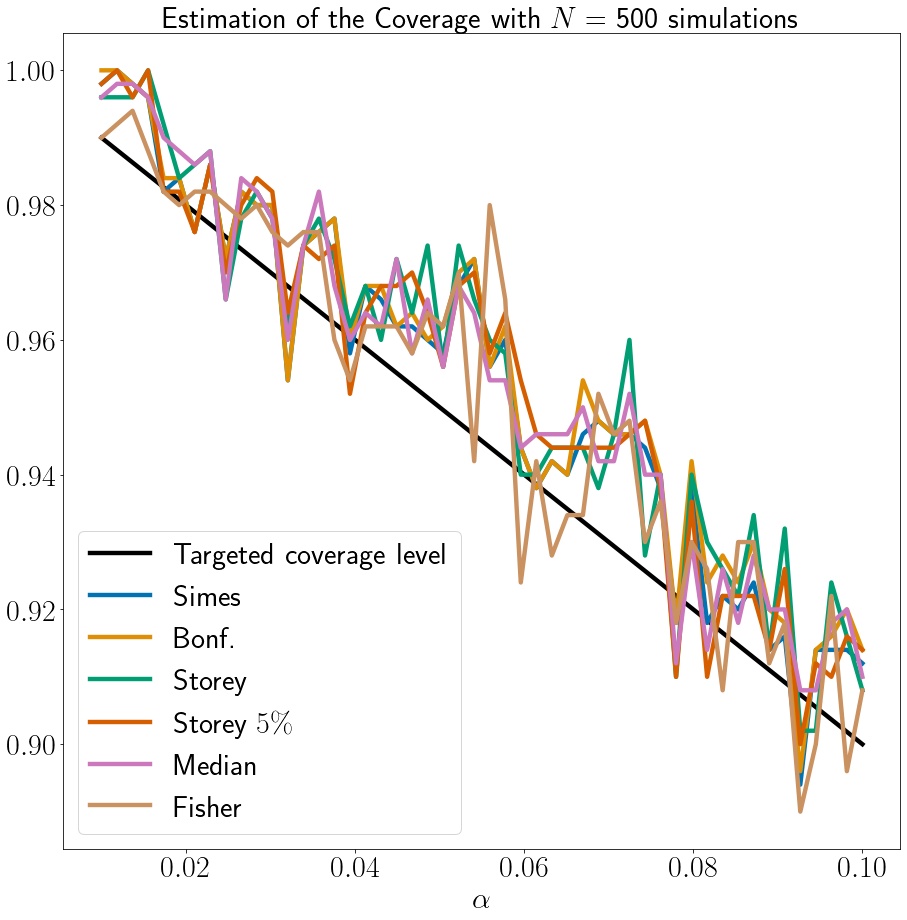

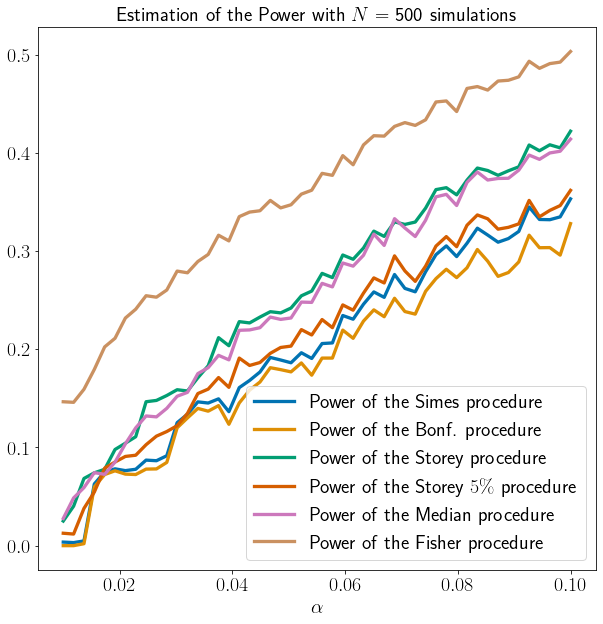

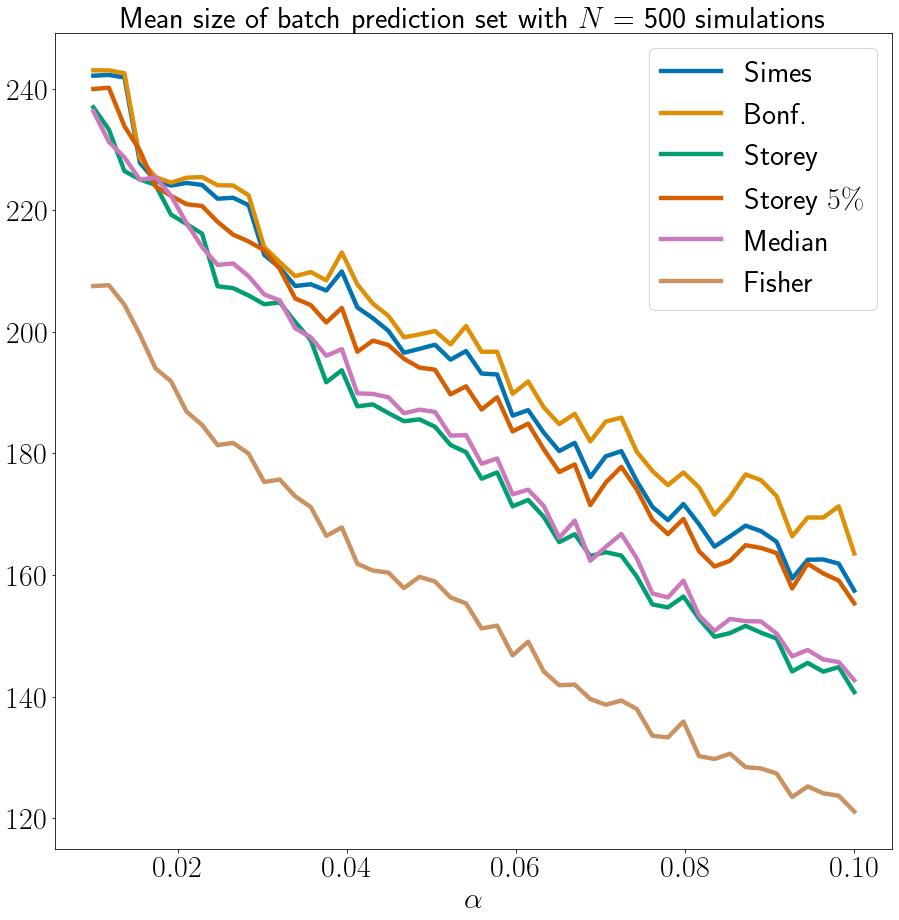

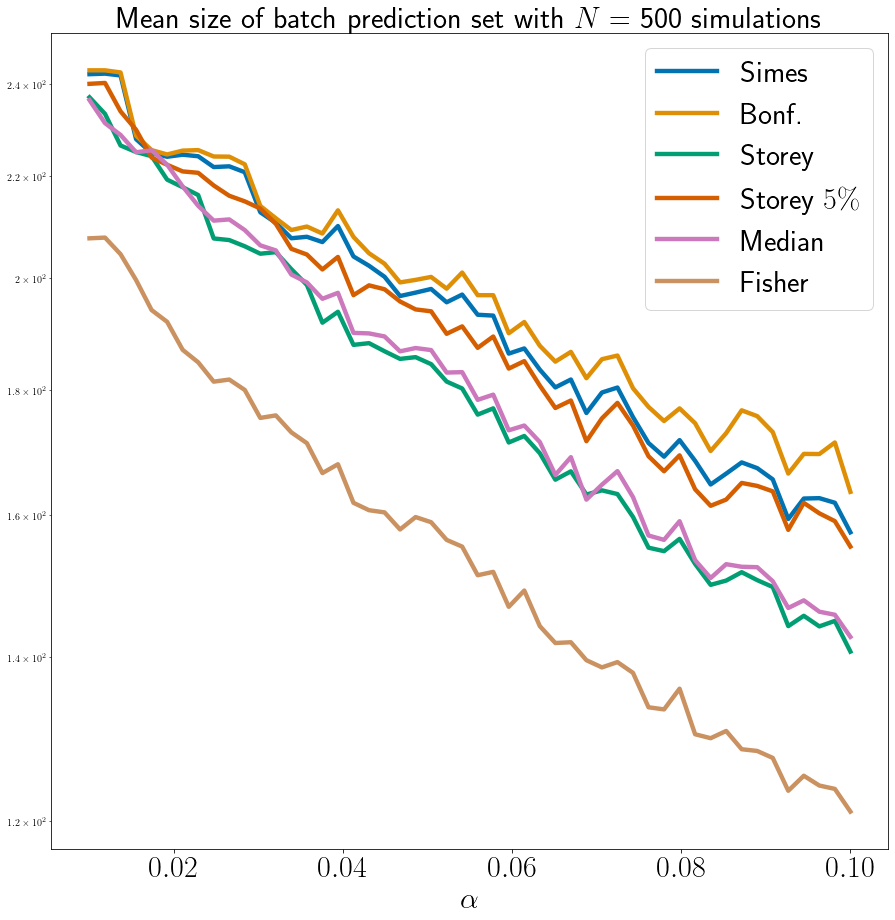

In [45]:
MCov,MPow,MSize=MeanPlot(TotCovCIFAR_1000_5,TotPowerCIFAR_1000_5,TotnPredictCIFAR_1000_5,NewProcedure,AlphaBis)

In [163]:
# We remove Storey 5% procedure from the graph
TotCovCIFAR_1000_5Bis=np.zeros((5,50,500))
TotCovCIFAR_1000_5Bis[:3]=TotCovCIFAR_1000_5[:3]
TotCovCIFAR_1000_5Bis[3:]=TotCovCIFAR_1000_5[4:]

TotPowerCIFAR_1000_5Bis=np.zeros((5,50,500))
TotPowerCIFAR_1000_5Bis[:3]=TotPowerCIFAR_1000_5[:3]
TotPowerCIFAR_1000_5Bis[3:]=TotPowerCIFAR_1000_5[4:]

TotnPredictCIFAR_1000_5Bis=np.zeros((5,50,500))
TotnPredictCIFAR_1000_5Bis[:3]=TotnPredictCIFAR_1000_5[:3]
TotnPredictCIFAR_1000_5Bis[3:]=TotnPredictCIFAR_1000_5[4:]


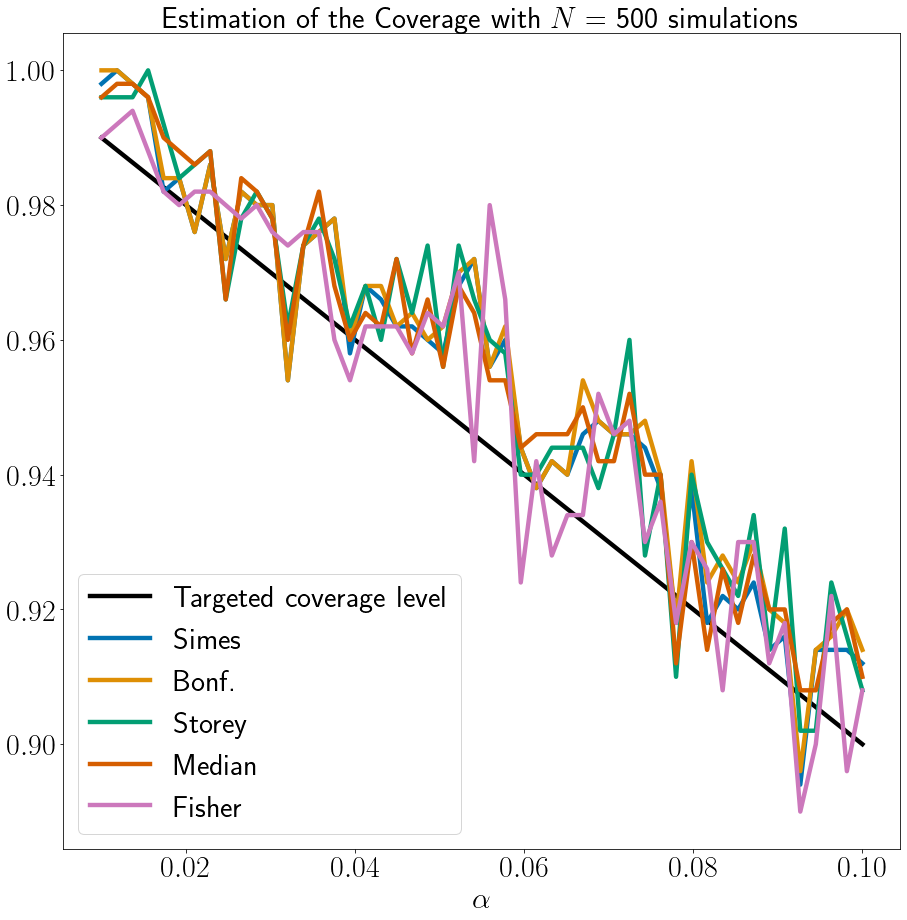

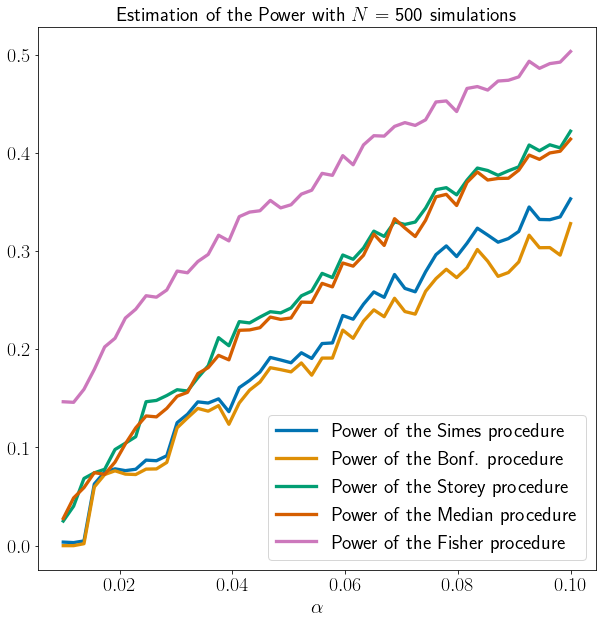

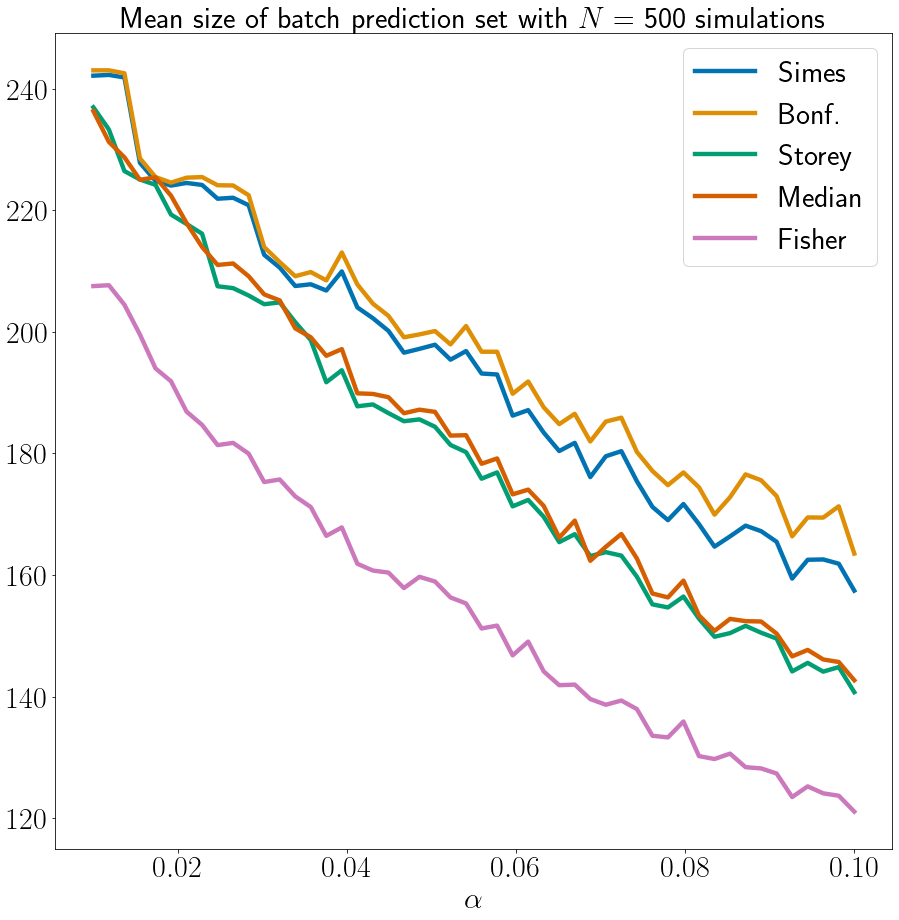

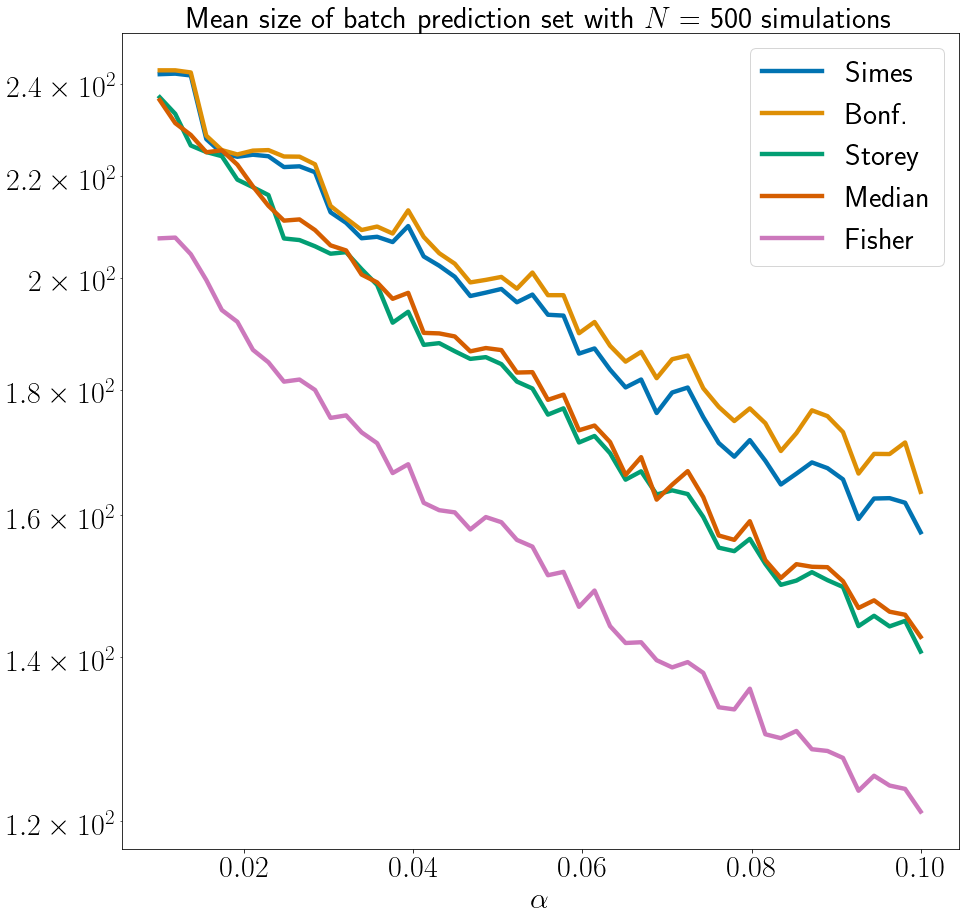

In [164]:
MCov,MPow,MSize=MeanPlot(TotCovCIFAR_1000_5Bis,TotPowerCIFAR_1000_5Bis,TotnPredictCIFAR_1000_5Bis,NewProcedureBis,AlphaBis)

# CIFAR Dataset (To Use)

$\alpha$=AlphaBis.npy Convolutional Neural Network, $m=5$, $n_{cal}=2000$, Class Calibrated $p$-values.

Methods: Simes, Bonf, Storey $0.5$, Storey $0.05$, Median, Fisher

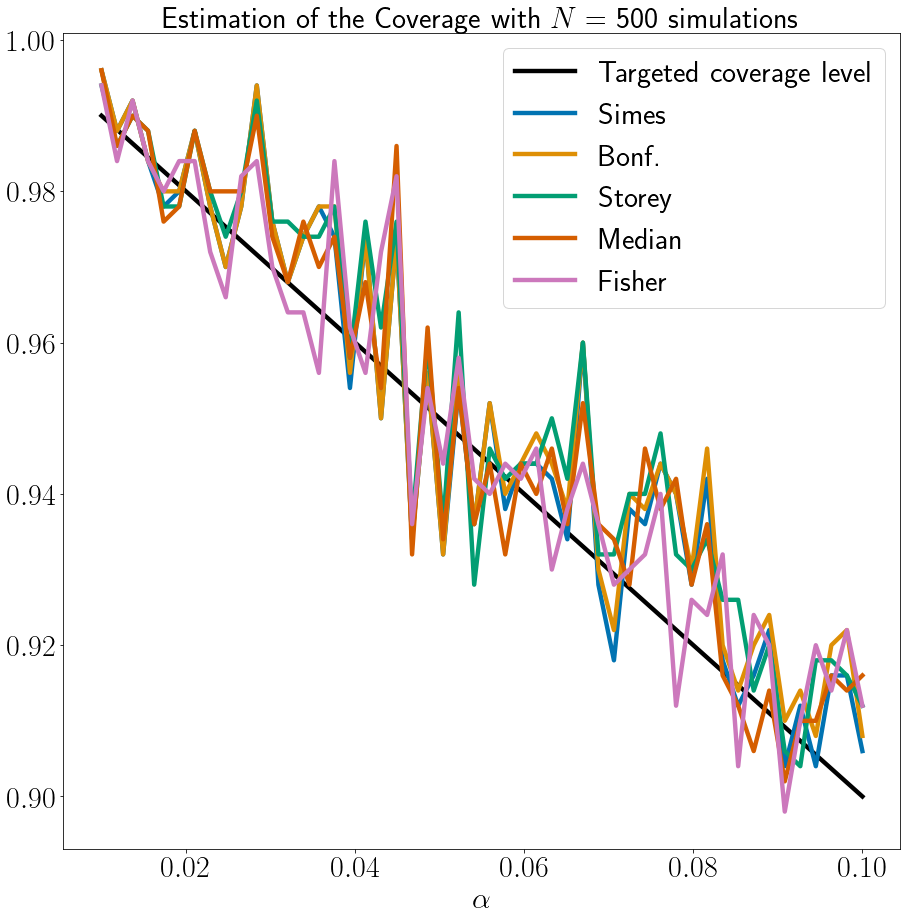

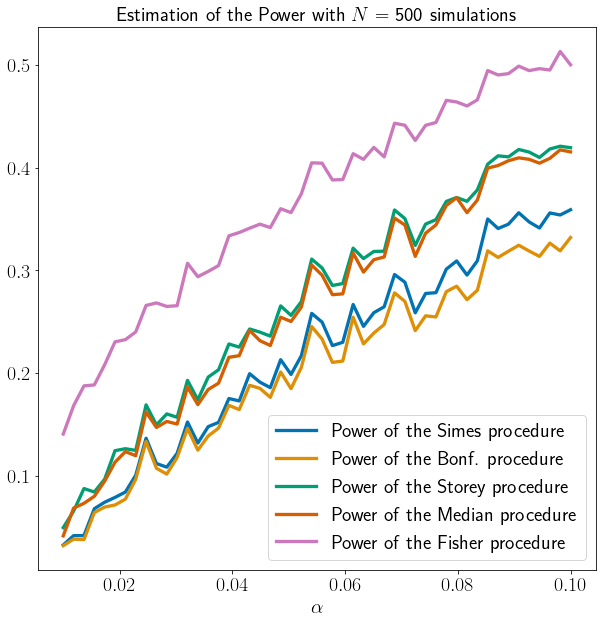

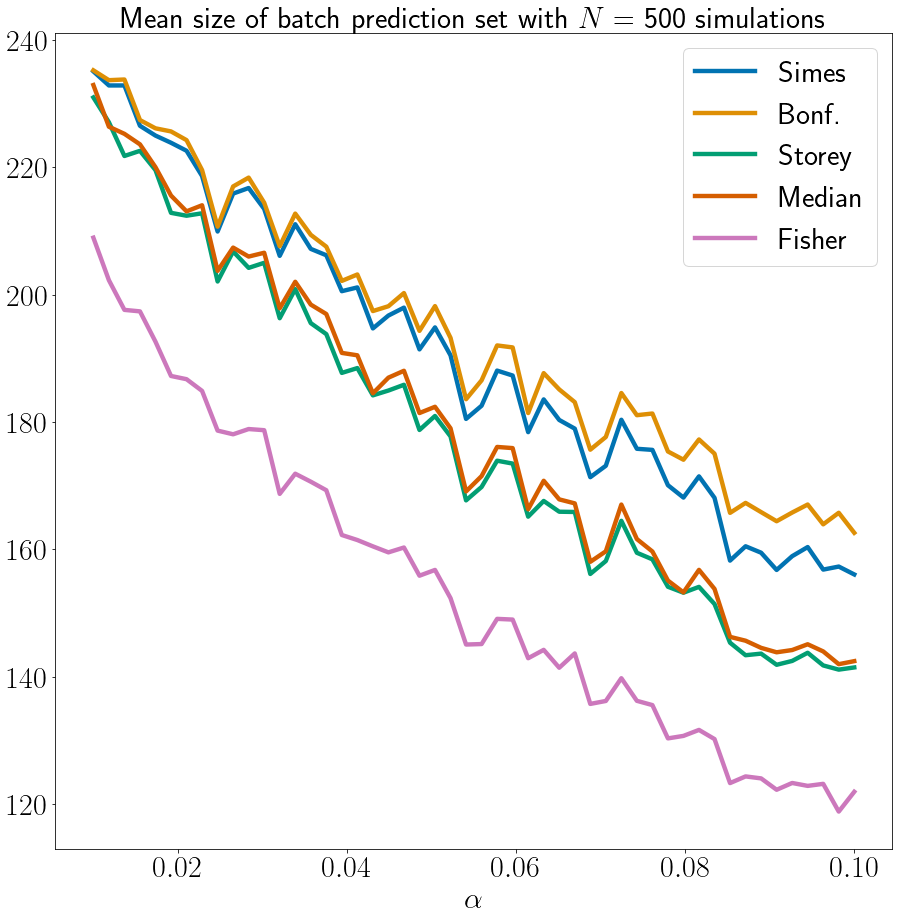

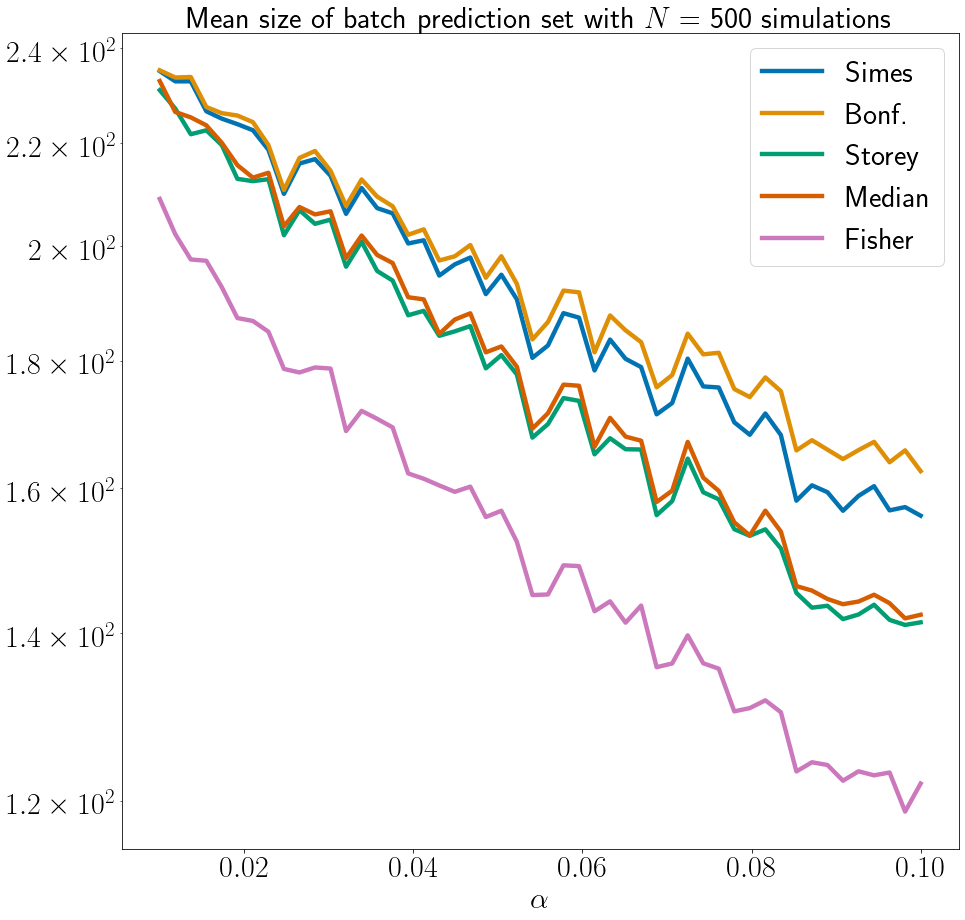

In [167]:
TotCovCIFAR_2000_5=np.load('TotCovCIFAR_2000_5.npy')
TotPowerCIFAR_2000_5=np.load('TotPowerCIFAR_2000_5.npy')
TotnPredictCIFAR_2000_5=np.load('TotnPredictCIFAR_2000_5.npy')


# We remove Storey 5% procedure for the graph
TotCovCIFAR_2000_5Bis=np.zeros((5,50,500))
TotCovCIFAR_2000_5Bis[:3]=TotCovCIFAR_2000_5[:3]
TotCovCIFAR_2000_5Bis[3:]=TotCovCIFAR_2000_5[4:]

TotPowerCIFAR_2000_5Bis=np.zeros((5,50,500))
TotPowerCIFAR_2000_5Bis[:3]=TotPowerCIFAR_2000_5[:3]
TotPowerCIFAR_2000_5Bis[3:]=TotPowerCIFAR_2000_5[4:]

TotnPredictCIFAR_2000_5Bis=np.zeros((5,50,500))
TotnPredictCIFAR_2000_5Bis[:3]=TotnPredictCIFAR_2000_5[:3]
TotnPredictCIFAR_2000_5Bis[3:]=TotnPredictCIFAR_2000_5[4:]


MCov,MPow,MSize=MeanPlot(TotCovCIFAR_2000_5Bis,TotPowerCIFAR_2000_5Bis,TotnPredictCIFAR_2000_5Bis,NewProcedureBis,AlphaBis,'CIFAR_Final1',1)

In [166]:
np.max(np.std(TotCovCIFAR_2000_5Bis,axis=2))

0.3026483107502832

# Unbalanced class :  Large sample study of the procedure

In [34]:
totCovCIFAR1=np.load('TotCovCIFAR_2000_03_03_03_5_05_05_00_N100.npy')
totPowerCIFAR1=np.load('TotPowerCIFAR_2000_03_03_03_5_05_05_00_N100.npy')
totnPredictCIFAR1=np.load('TotnPredictCIFAR_2000_03_03_03_5_05_05_00_N100.npy')
     
    
    
    
totCovCIFAR2=np.load('TotCovCIFAR_2000_01_03_06_5_09_02_02_N1000.npy')
totPowerCIFAR2=np.load('TotPowerCIFAR_2000_01_03_06_5_09_02_02_N1000.npy')
totnPredictCIFAR2=np.load('TotnPredictCIFAR_2000_01_03_06_5_09_02_02_N1000.npy')



totCovCIFAR3=np.load('TotCovCIFAR_2000_03_03_03_5_05_06_00_N1000.npy')
totPowerCIFAR3=np.load('TotPowerCIFAR_2000_03_03_03_5_05_06_00_N1000.npy')
totnPredictCIFAR3=np.load('TotnPredictCIFAR_2000_03_03_03_5_05_06_00_N1000.npy')



In [35]:
Procedure=['Simes', 'Bonf.',  r"Storey $\lambda=1/2$",r"Storey $\lambda=5\%$",'Median','Fisher']
AlphaViolin=np.load('AlphaViolin.npy')
AlphaViolin

array([0.01, 0.05, 0.1 ])

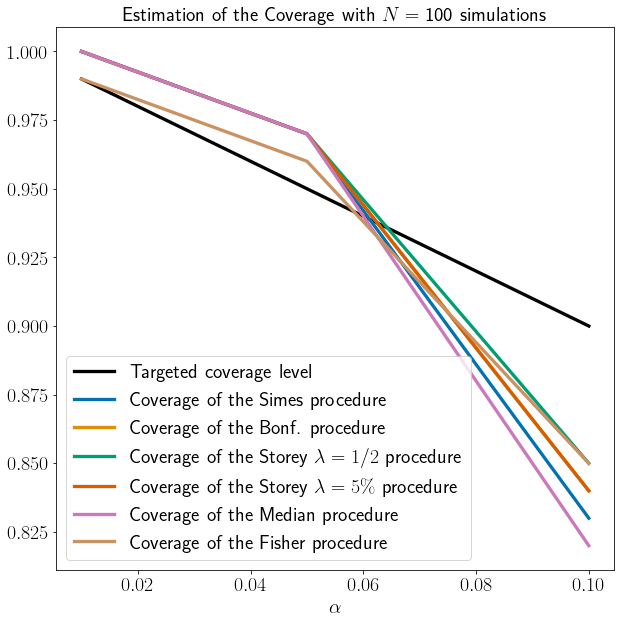

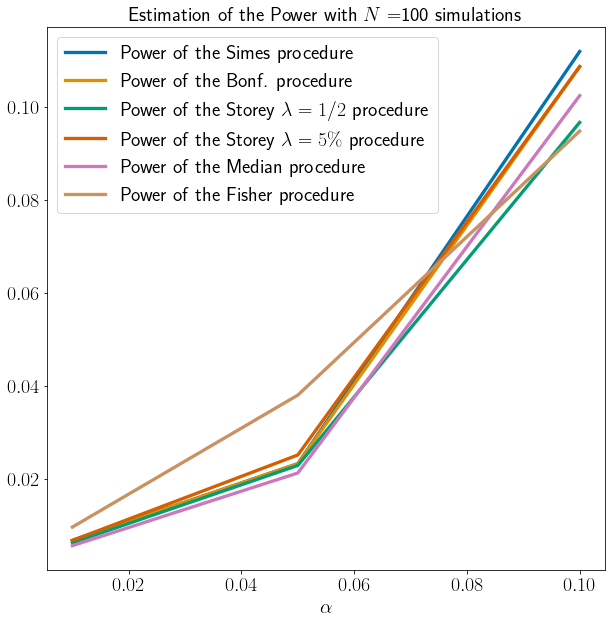

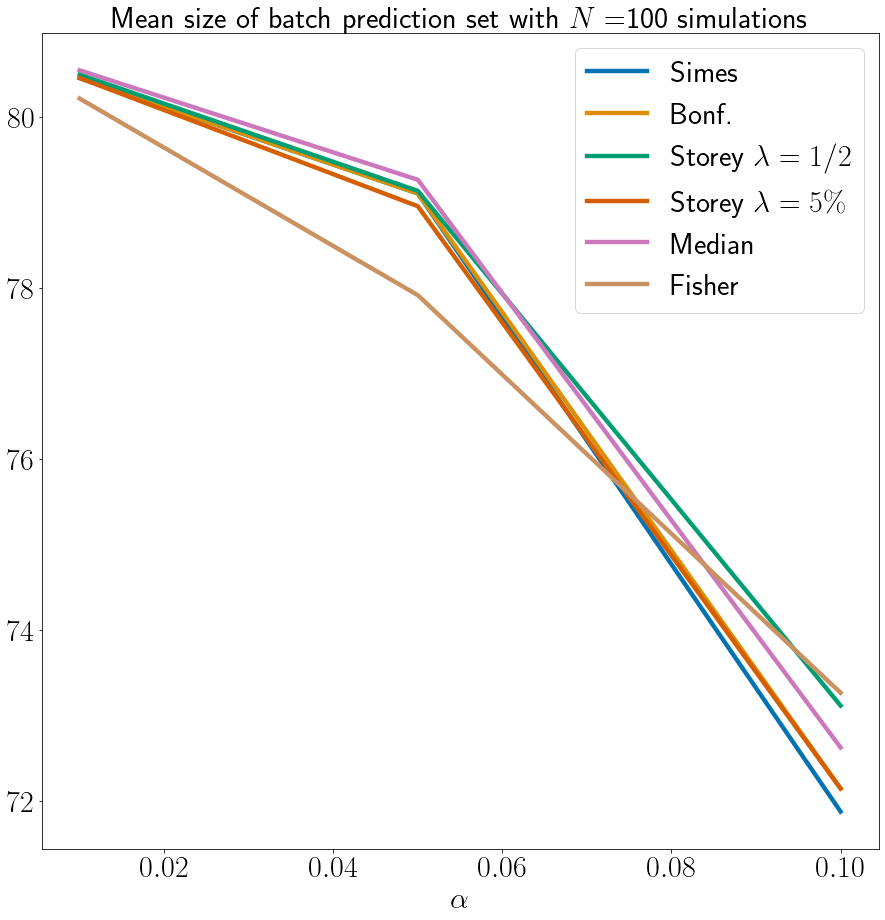

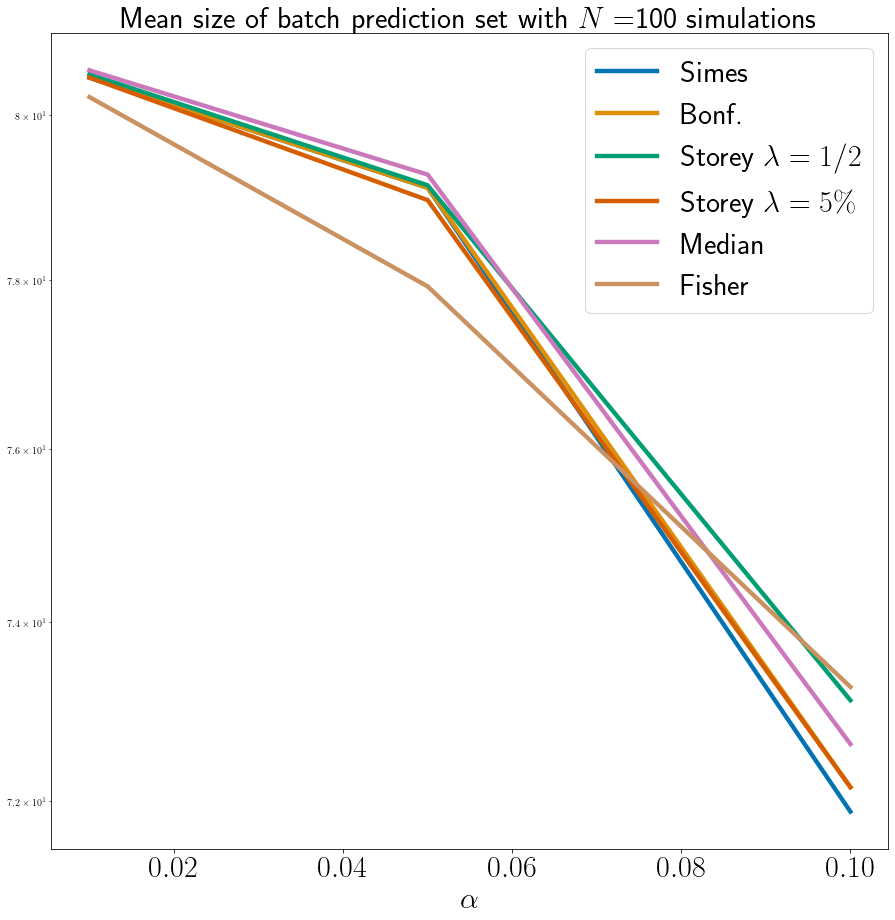

In [37]:
MCov1Full,MPow1Full,MSize1Full=MeanPlot(totCovCIFAR1[1],totPowerCIFAR1[1],totnPredictCIFAR1[1],Procedure,AlphaViolin)

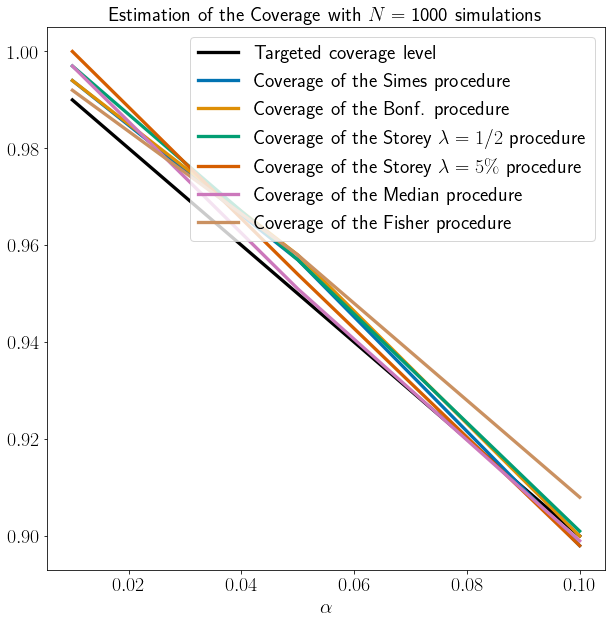

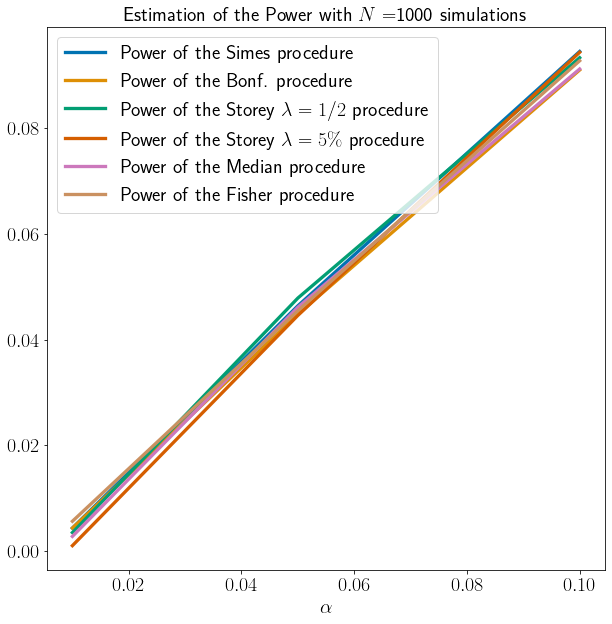

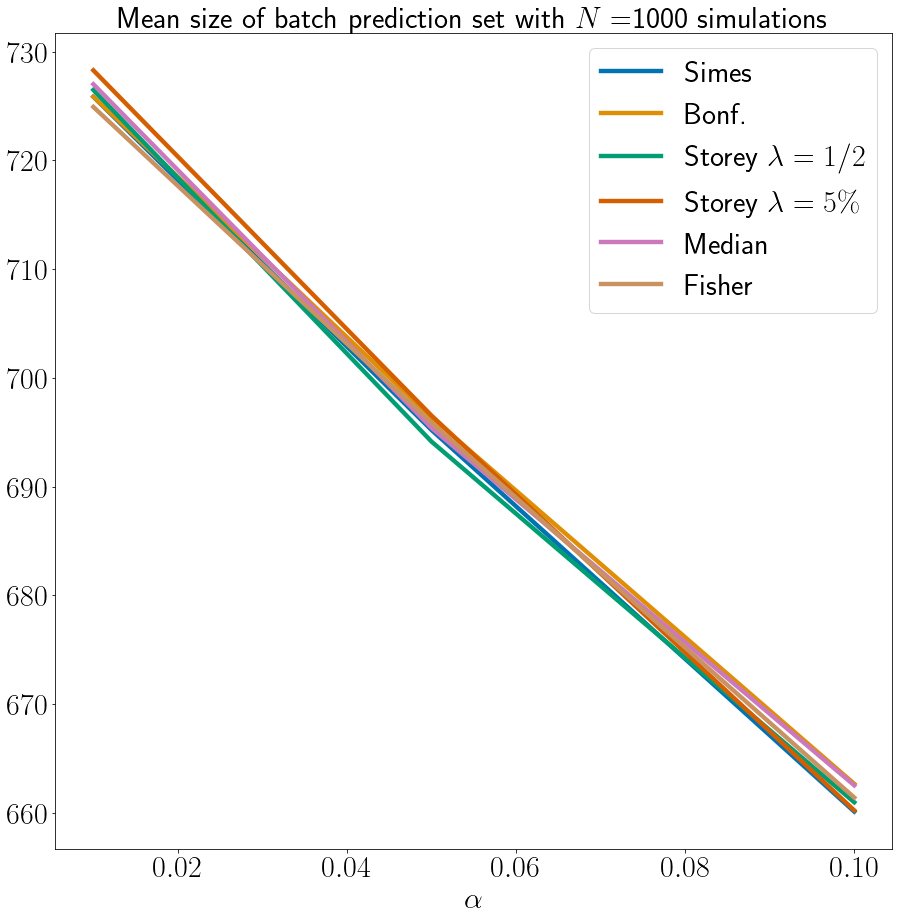

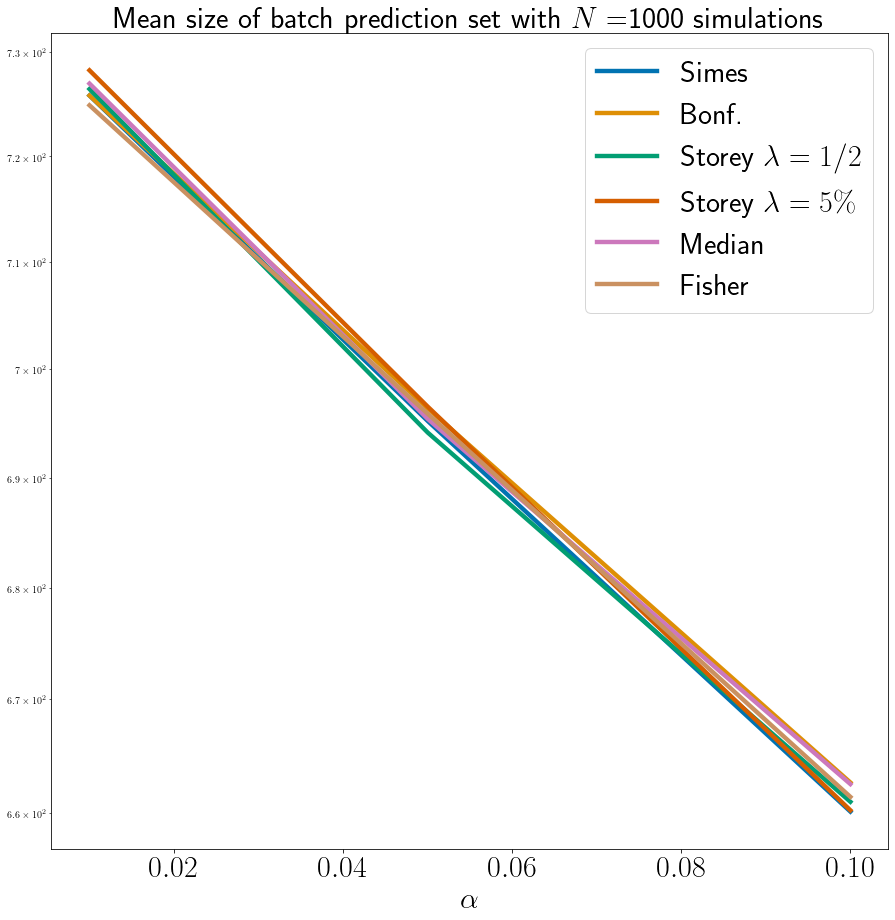

In [38]:
MCov2Class,MPow2Class,MSize2Class=MeanPlot(totCovCIFAR2[0],totPowerCIFAR2[0],totnPredictCIFAR2[0],Procedure,AlphaViolin,'Class',True)

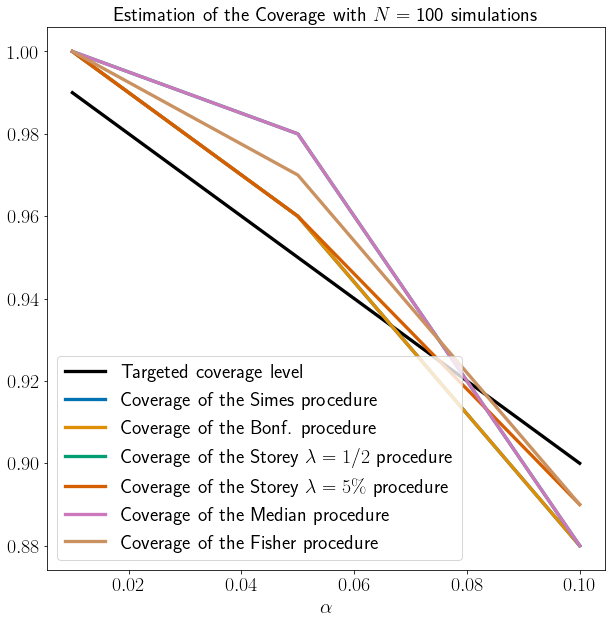

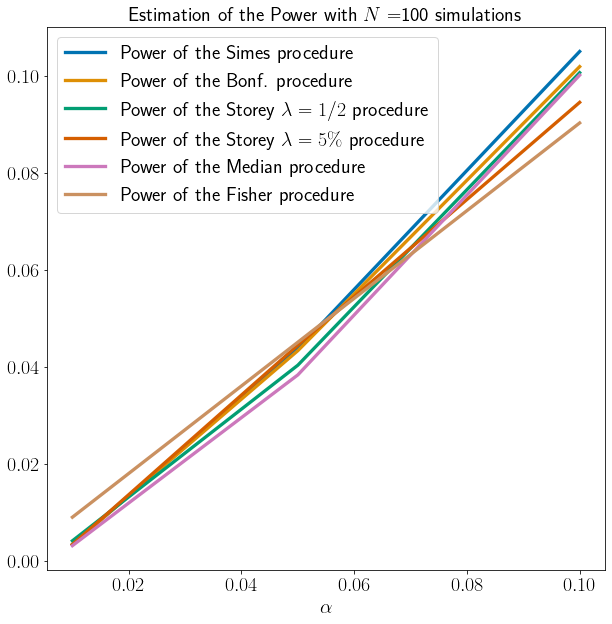

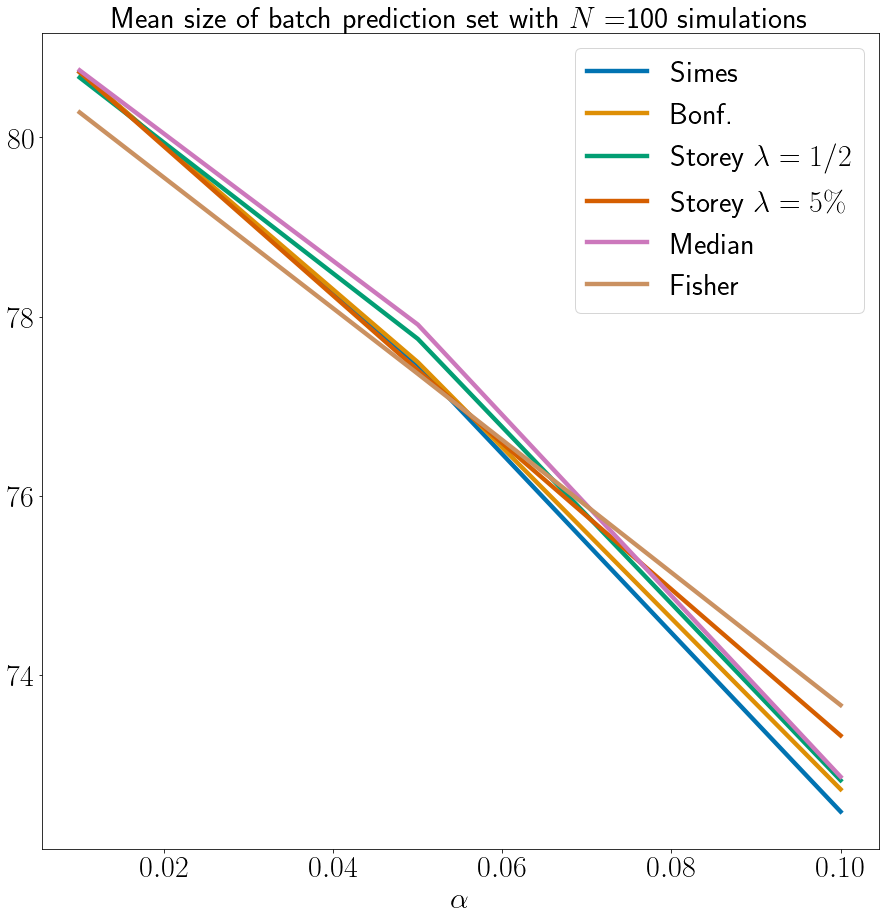

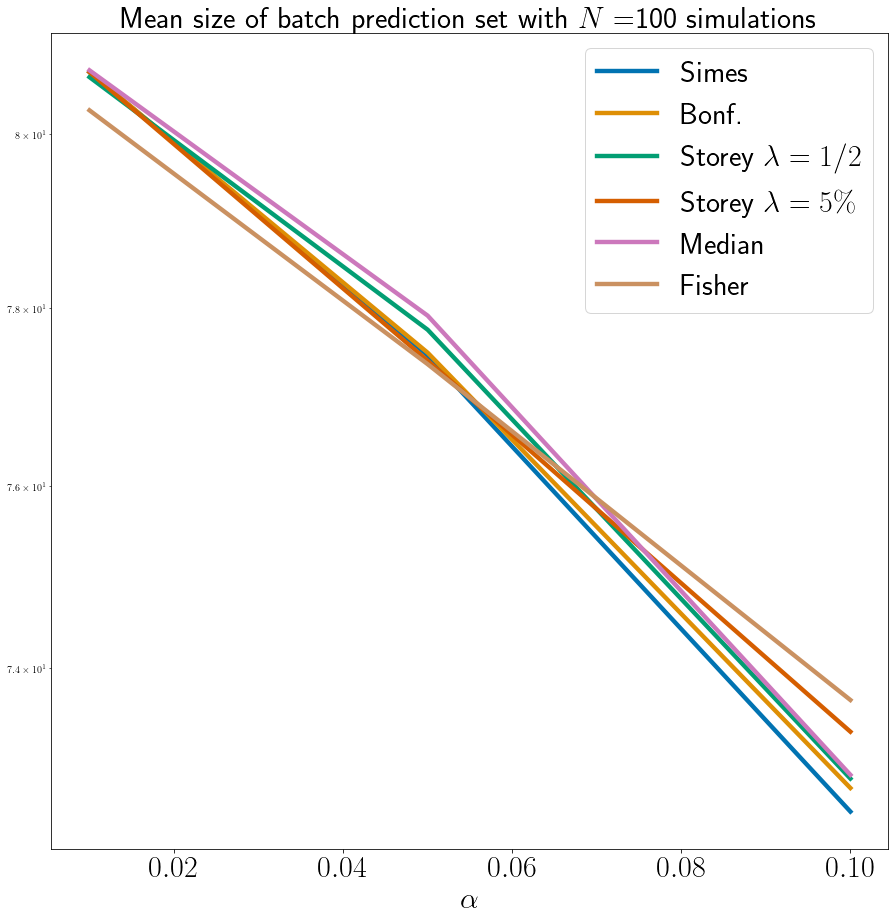

In [36]:
MCov1Class,MPow1Class,MSize1Class=MeanPlot(totCovCIFAR1[0],totPowerCIFAR1[0],totnPredictCIFAR1[0],Procedure,AlphaViolin)

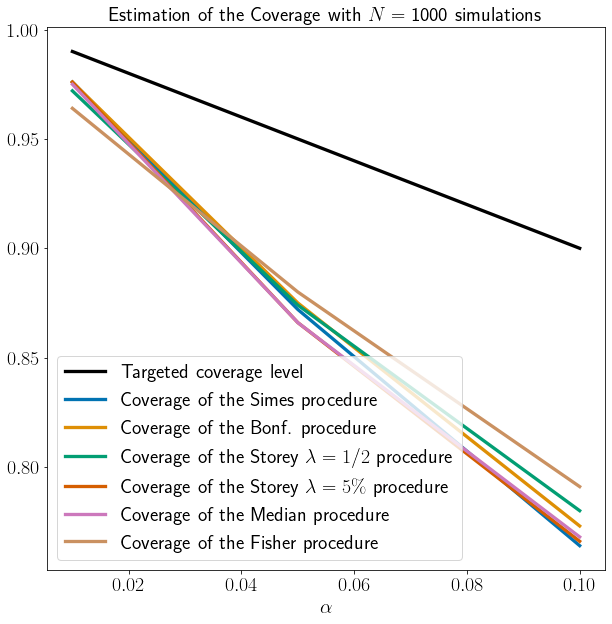

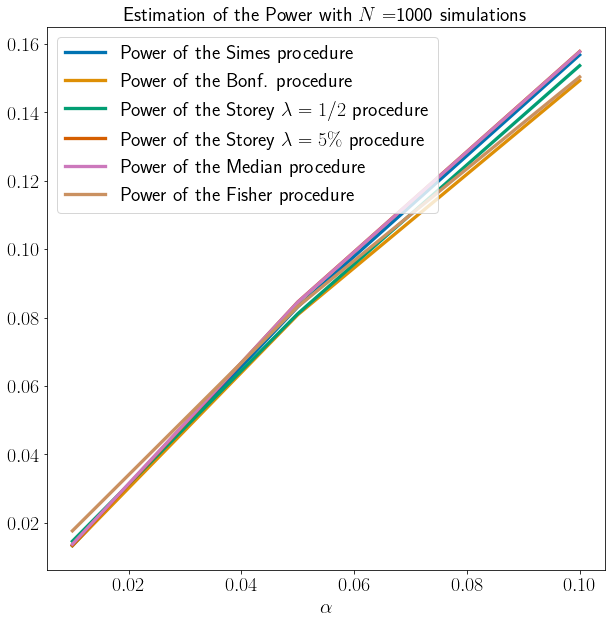

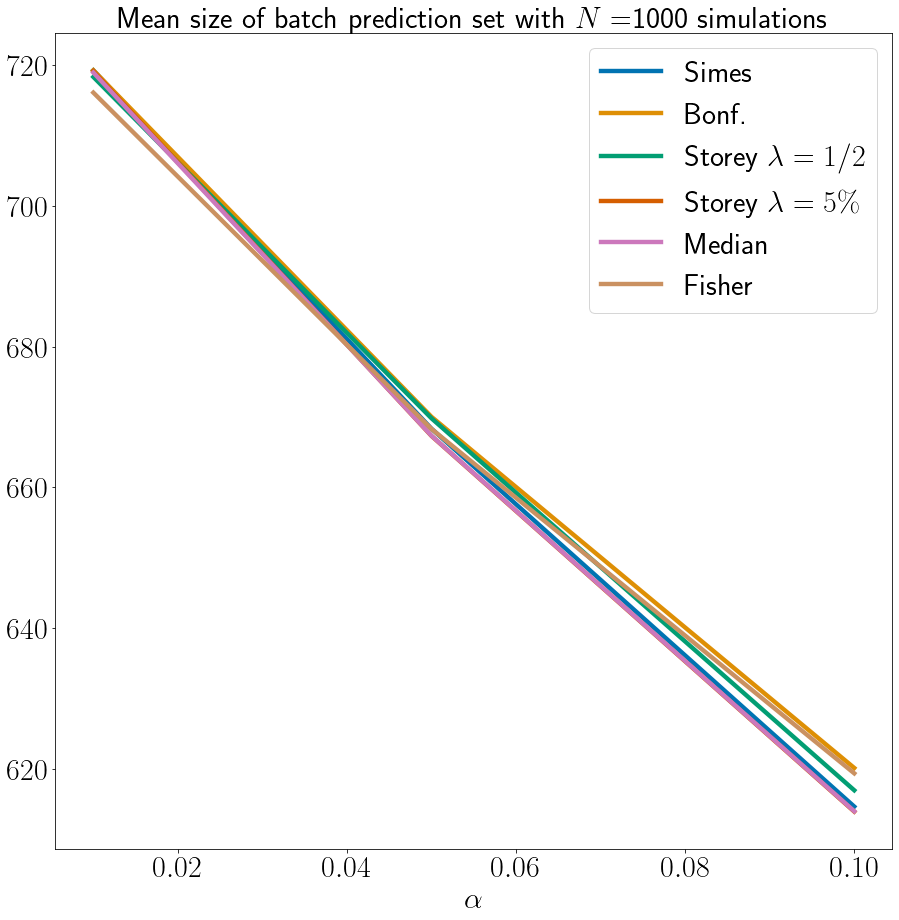

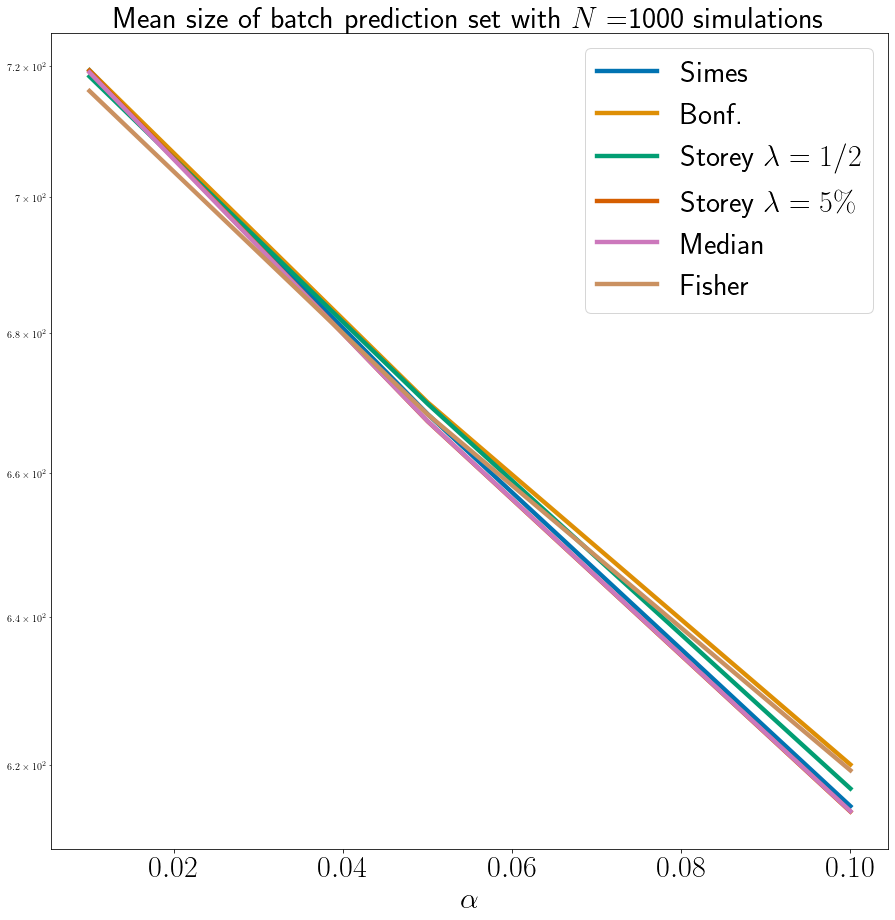

In [39]:
MCov2Full,MPow2Full,MSize2Full=MeanPlot(totCovCIFAR2[1],totPowerCIFAR2[1],totnPredictCIFAR2[1],Procedure,AlphaViolin,Name='FullCIFAR',SaveFigs=1)

In [40]:
CovData=pd.DataFrame({'Coverage':1-AlphaViolin,'Full-calibrated (Bonf.)':MCov2Full[1],'Class-calibrated (Bonf.)':MCov2Class[1]})

In [41]:
CovData.to_latex('CovFullvClass',index=False)

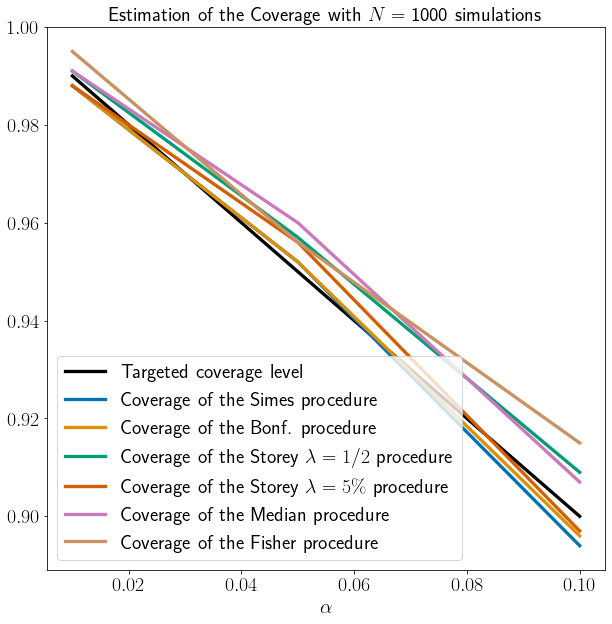

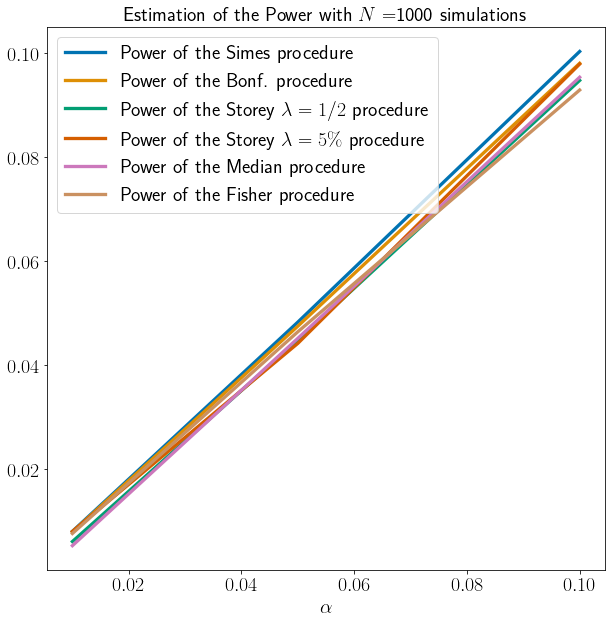

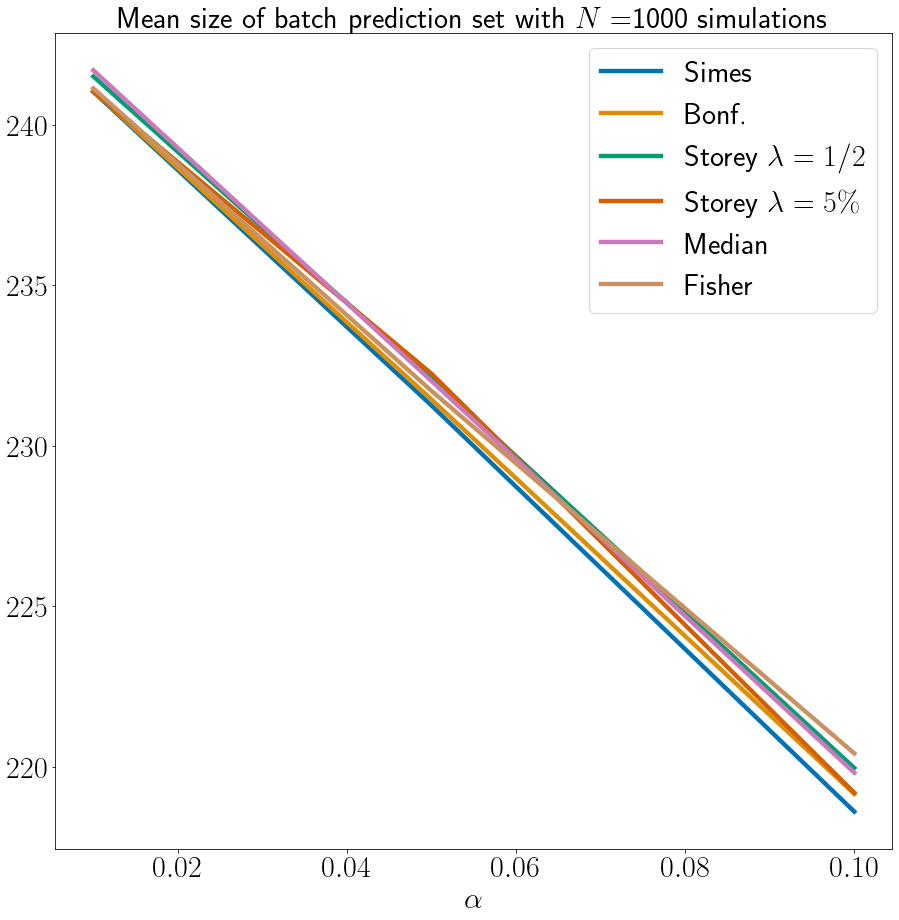

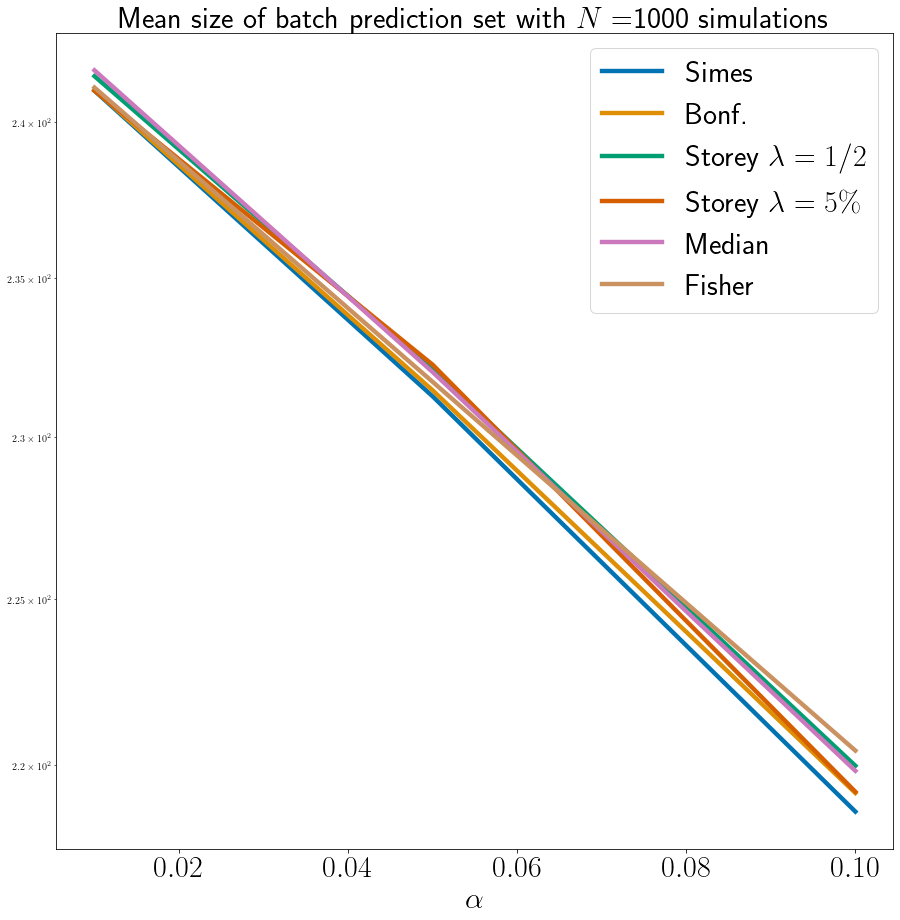

In [42]:
MCov3Class,MPow3Class,MSize3Class=MeanPlot(totCovCIFAR3[0],totPowerCIFAR3[0],totnPredictCIFAR3[0],Procedure,AlphaViolin)

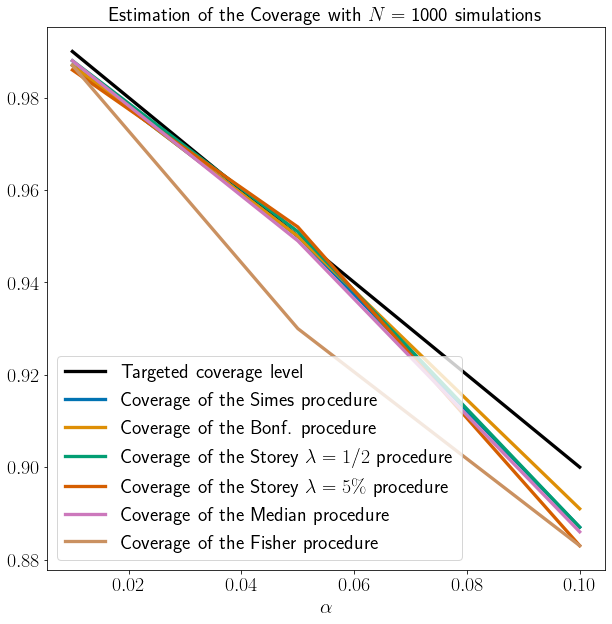

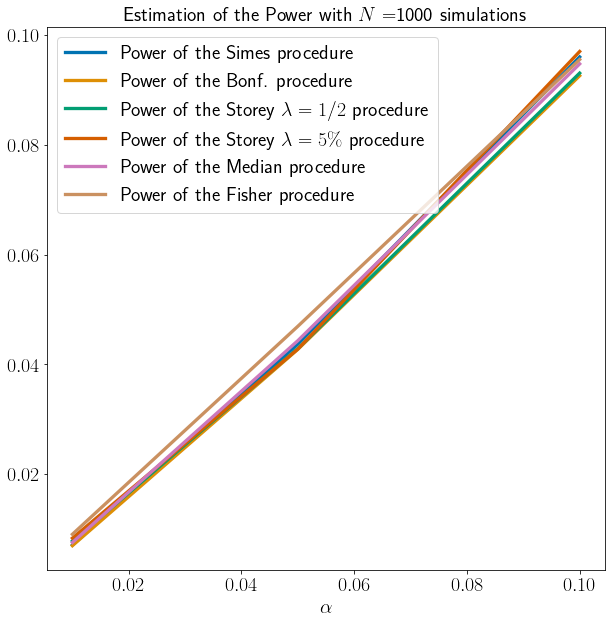

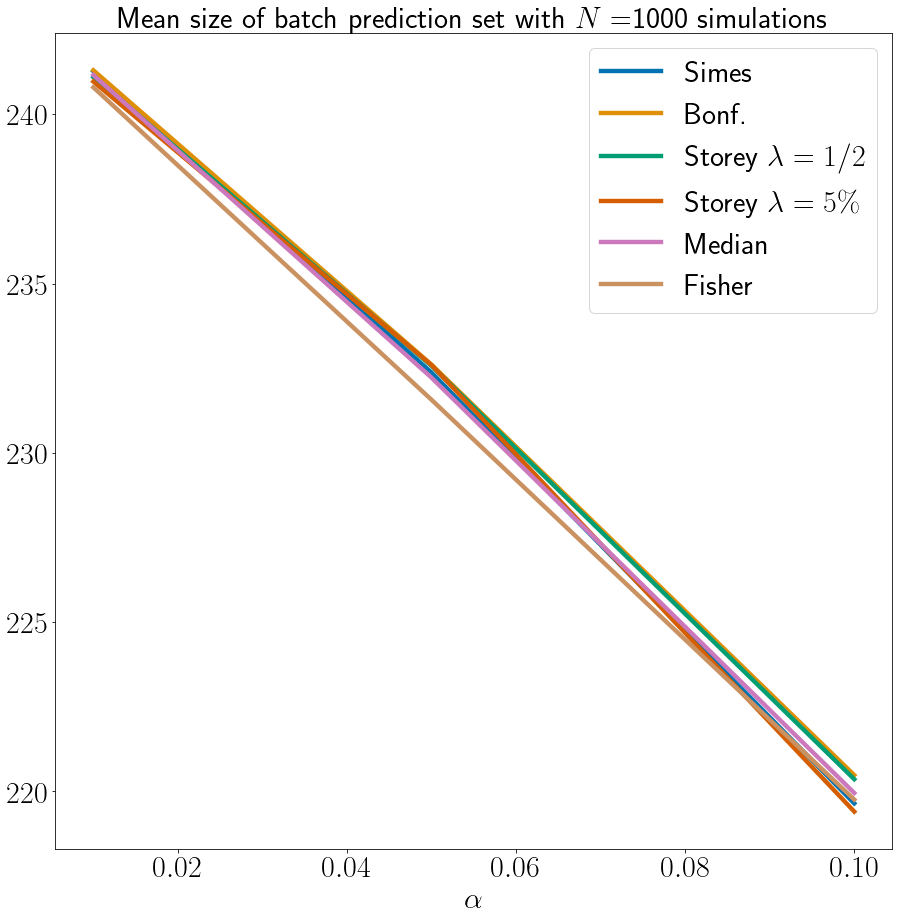

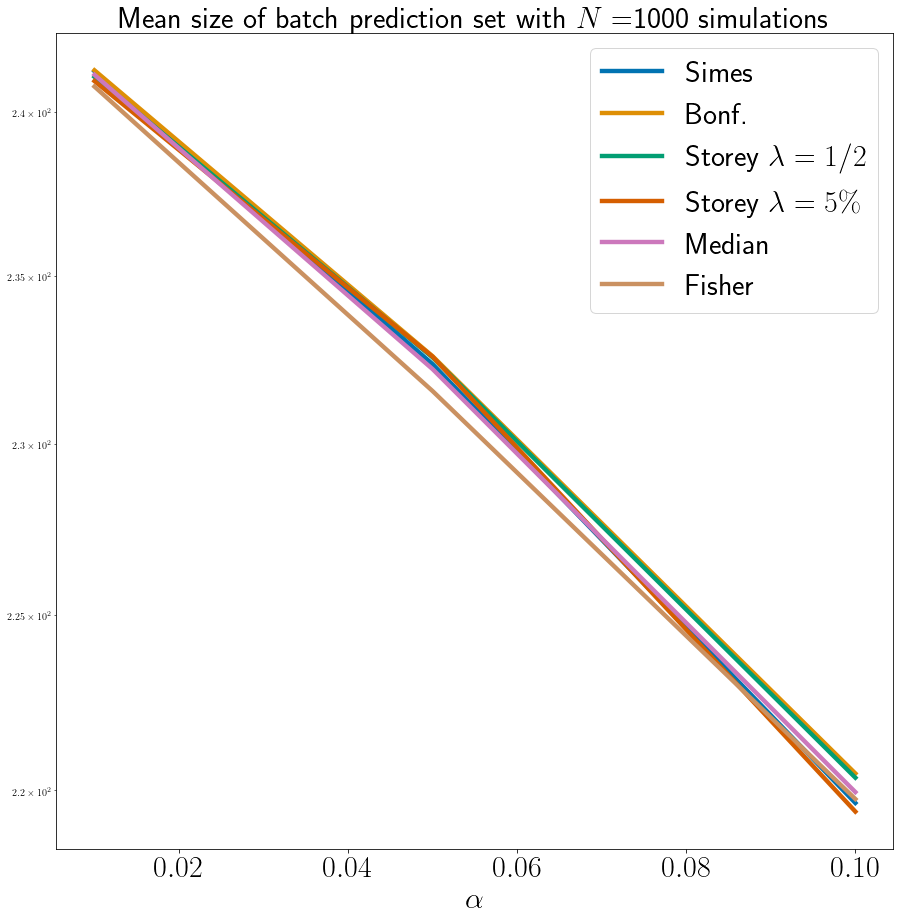

In [43]:
MCov3Full,MPow3Full,MSize3Full=MeanPlot(totCovCIFAR3[1],totPowerCIFAR3[1],totnPredictCIFAR3[1],Procedure,AlphaViolin)

# $\lambda$ influence for $3$ different $\alpha$

In [44]:
LambdaProc=[str(AlphaViolin[0])+' Quantile',str(AlphaViolin[1])+' Quantile',str(AlphaViolin[2])+' Quantile','Median',str(0.9)+' Quantile',str(AlphaViolin[0])+' Storey',str(AlphaViolin[1])+' Storey',str(AlphaViolin[2])+' Storey','Storey',str(0.9)+' Storey']

AlphaViolin

array([0.01, 0.05, 0.1 ])

In [45]:
LambdaProcBis=[str(AlphaViolin[0])+' Q',str(AlphaViolin[1])+' Q',str(AlphaViolin[2])+' Q','Median',str(0.9)+' Q',str(AlphaViolin[0])+' S',str(AlphaViolin[1])+' S',str(AlphaViolin[2])+' S','Storey',str(0.9)+' S']


In [46]:
TotCovCIFAR_2000_5_lambdaClass=np.load('TotCovCIFAR_2000_5_lambda.npy')
TotPowerCIFAR_2000_5_lambdaClass=np.load('TotPowerCIFAR_2000_5_lambda.npy')
TotnPredictCIFAR_2000_5_lambdaClass=np.load('TotnPredictCIFAR_2000_5_lambda.npy')

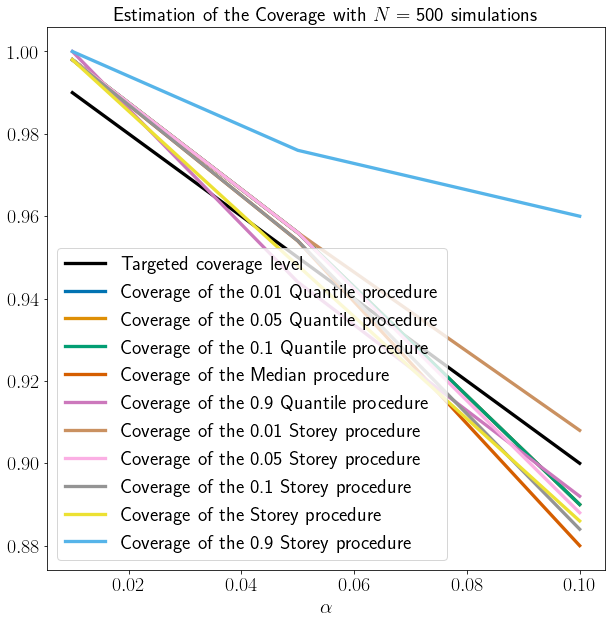

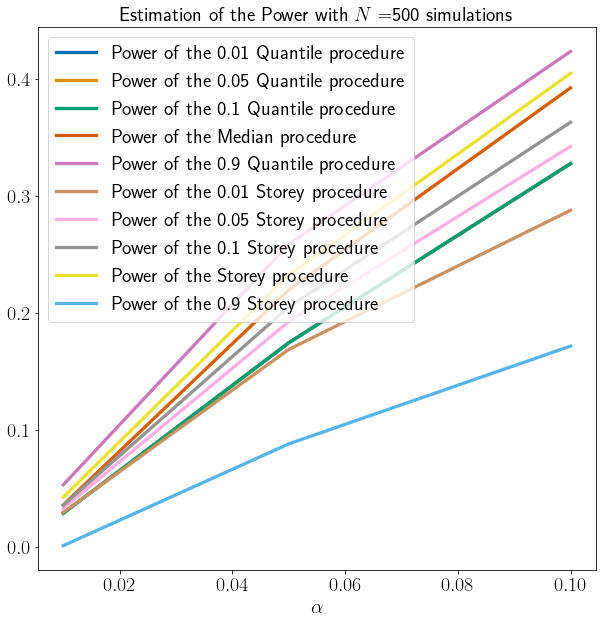

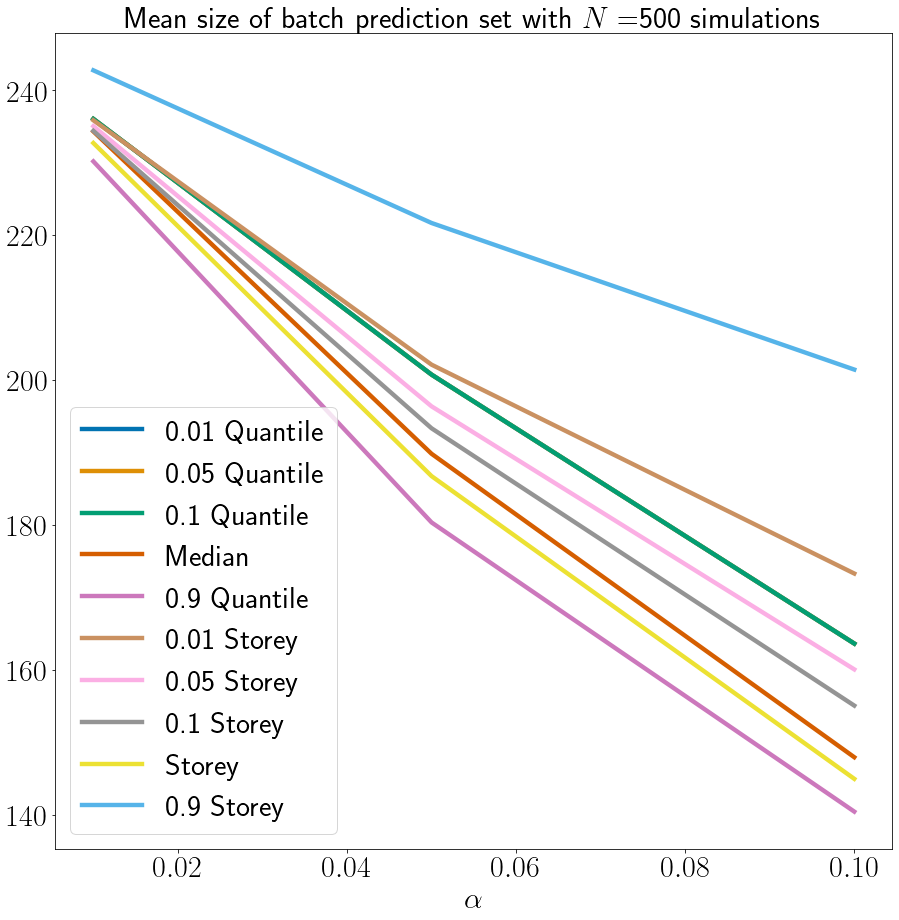

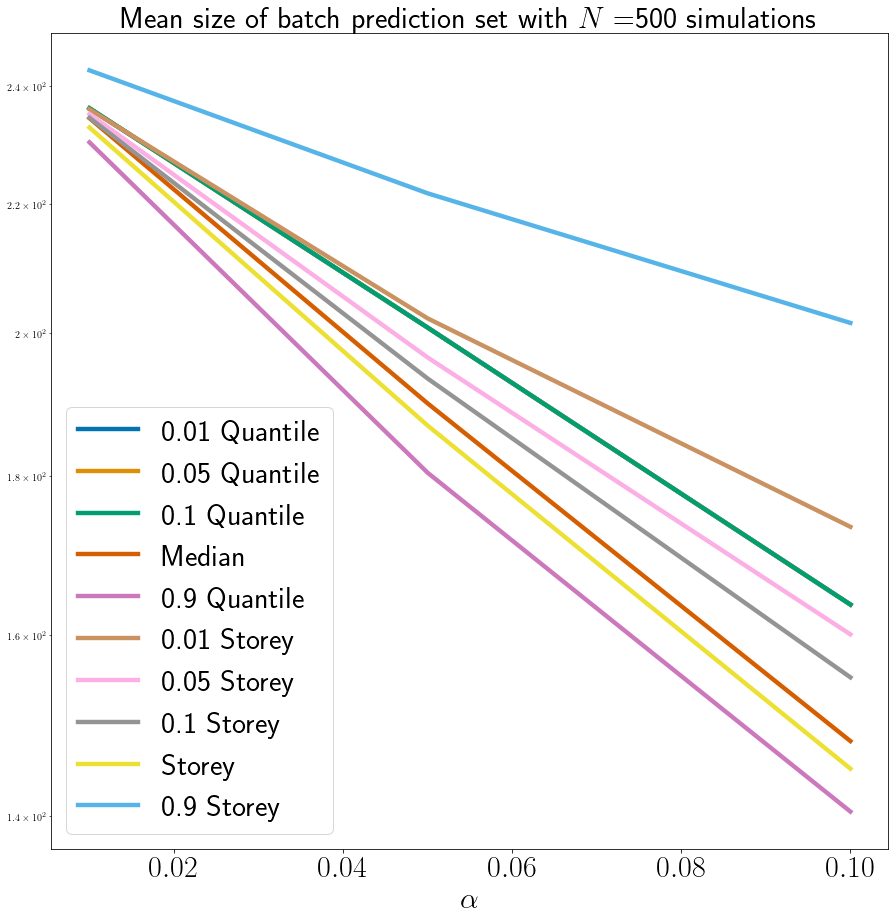

In [47]:
A,B,PowerCIFARClass=MeanPlot(TotCovCIFAR_2000_5_lambdaClass,TotPowerCIFAR_2000_5_lambdaClass,TotnPredictCIFAR_2000_5_lambdaClass,LambdaProc,AlphaViolin,Name='0',SaveFigs=0)

In [48]:
IndicProc=[7,8,9,2,3,4]
NameProc=['0.1 Storey', 'Storey','0.9 Storey','0.1 Quantile','Median','0.9 Quantile']

In [49]:
SizeCifarLambda=pd.DataFrame(PowerCIFARClass[IndicProc].T,columns=NameProc,index=AlphaViolin)

In [50]:
SizeCifarLambda.to_markdown('SizeCifarLambda')

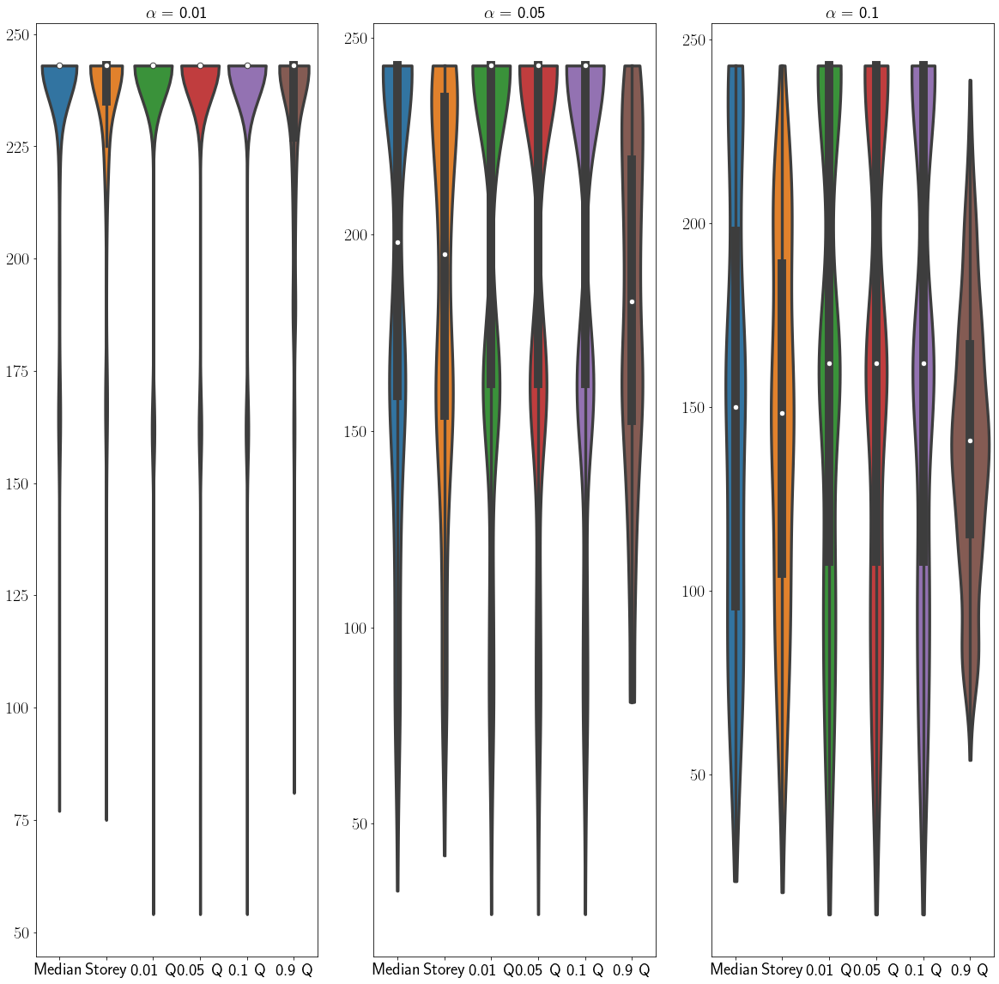

In [51]:
CombinViolinPlot(TotnPredictCIFAR_2000_5_lambdaClass,LambdaProcBis,np.array([3,8,0,1,2,4]).astype(int),AlphaViolin,np.array([0,1,2]).astype(int),"CIFARLambdaQuantile")

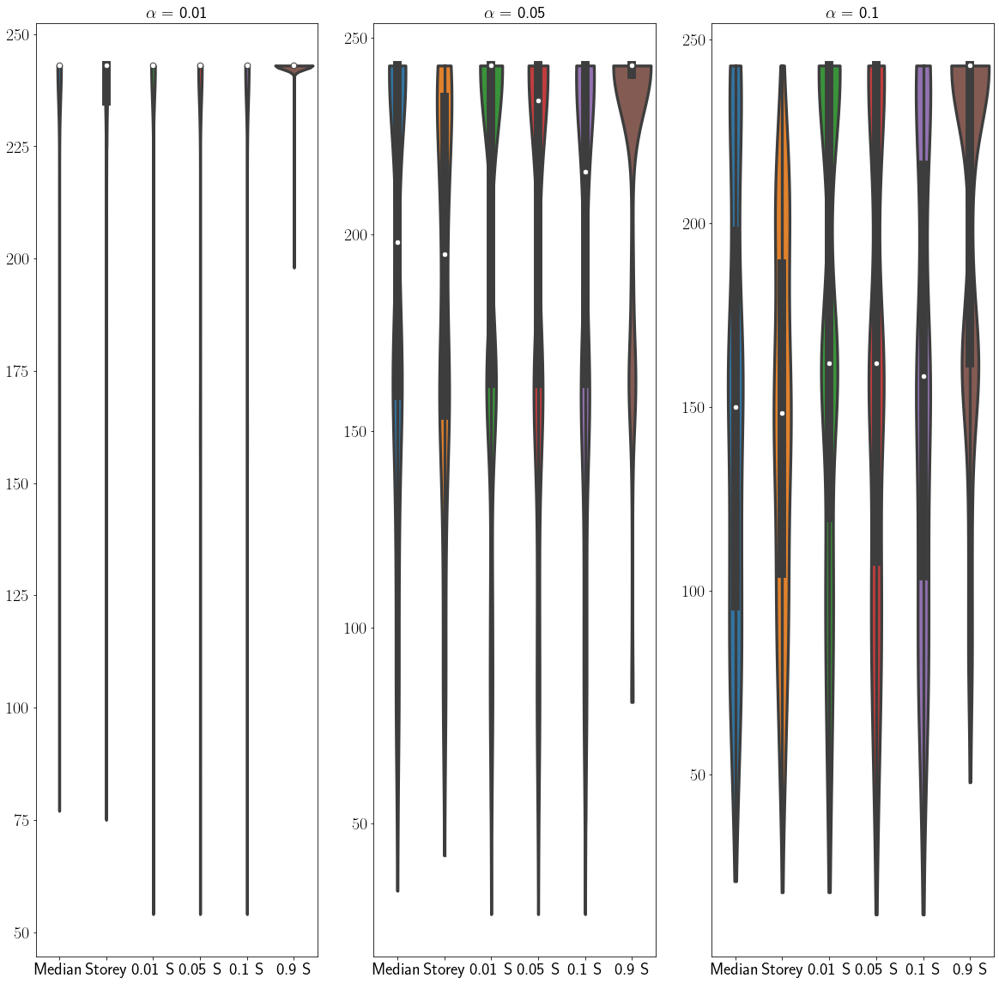

In [52]:
CombinViolinPlot(TotnPredictCIFAR_2000_5_lambdaClass,LambdaProcBis,np.array([3,8,5,6,7,9]).astype(int),AlphaViolin,np.array([0,1,2]).astype(int),"CIFARLambdaQuantile")

In [53]:
TotCovCIFAR_2000_5_lambdaFull=np.load('TotCovCIFAR_2000_5_lambdaFull.npy')
TotPowerCIFAR_2000_5_lambdaFull=np.load('TotPowerCIFAR_2000_5_lambdaFull.npy')
TotnPredictCIFAR_2000_5_lambdaFull=np.load('TotnPredictCIFAR_2000_5_lambdaFull.npy')

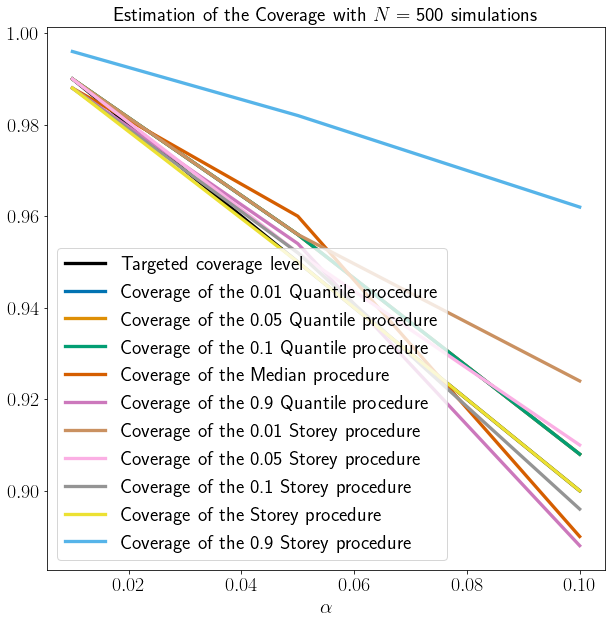

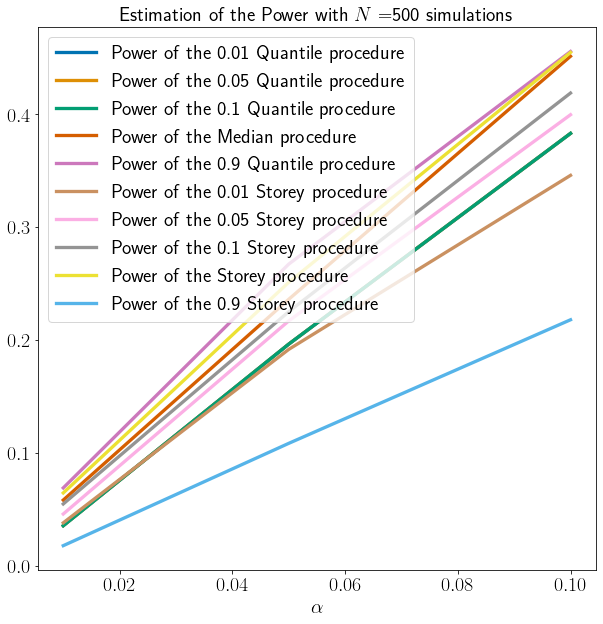

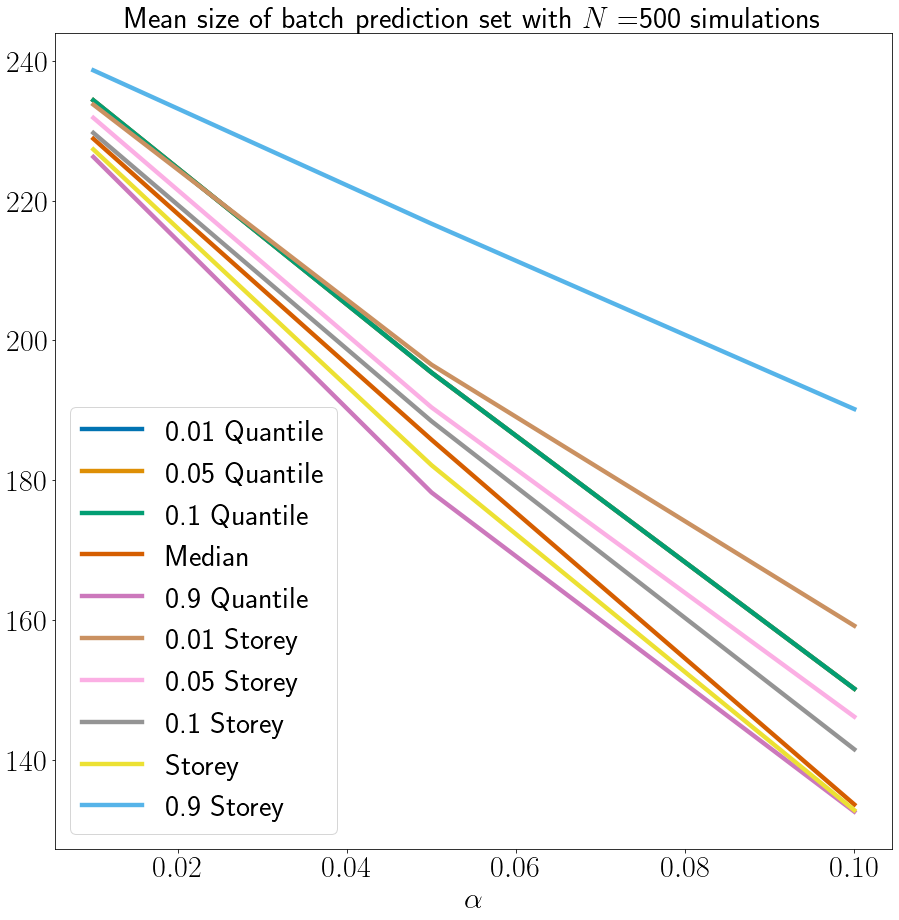

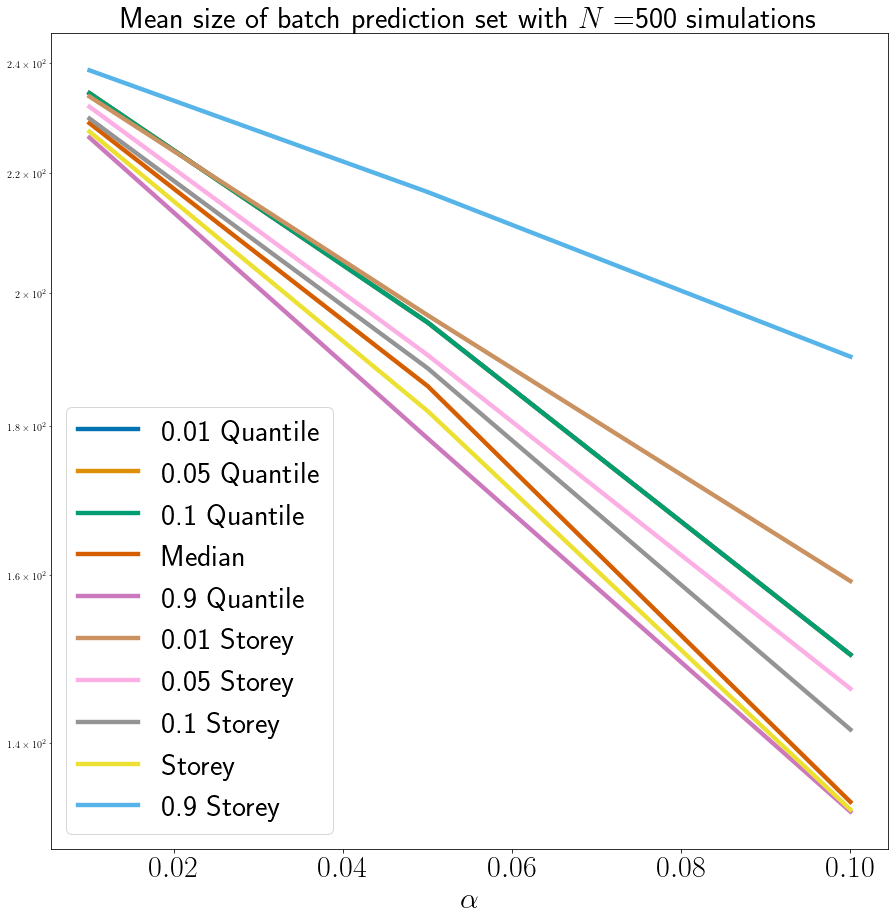

(array([[0.99 , 0.956, 0.908],
        [0.99 , 0.956, 0.908],
        [0.99 , 0.956, 0.908],
        [0.988, 0.96 , 0.89 ],
        [0.988, 0.954, 0.888],
        [0.99 , 0.956, 0.924],
        [0.99 , 0.952, 0.91 ],
        [0.988, 0.952, 0.896],
        [0.988, 0.95 , 0.9  ],
        [0.996, 0.982, 0.962]]),
 array([[0.03573554, 0.1965124 , 0.38316529],
        [0.03573554, 0.1965124 , 0.38316529],
        [0.03573554, 0.1965124 , 0.38316529],
        [0.05842975, 0.23621488, 0.4514876 ],
        [0.06919008, 0.2673719 , 0.45571074],
        [0.03826446, 0.1918595 , 0.34600826],
        [0.04607438, 0.21707438, 0.39971074],
        [0.05496694, 0.22524793, 0.41891736],
        [0.06473554, 0.2512314 , 0.45489256],
        [0.01803306, 0.10864463, 0.21809917]]),
 array([[234.342, 195.4  , 150.182],
        [234.342, 195.4  , 150.182],
        [234.342, 195.4  , 150.182],
        [228.848, 185.796, 133.63 ],
        [226.244, 178.25 , 132.606],
        [233.73 , 196.526, 159.19 ],
    

In [54]:
MeanPlot(TotCovCIFAR_2000_5_lambdaFull,TotPowerCIFAR_2000_5_lambdaFull,TotnPredictCIFAR_2000_5_lambdaFull,LambdaProc,AlphaViolin,Name='0',SaveFigs=0)

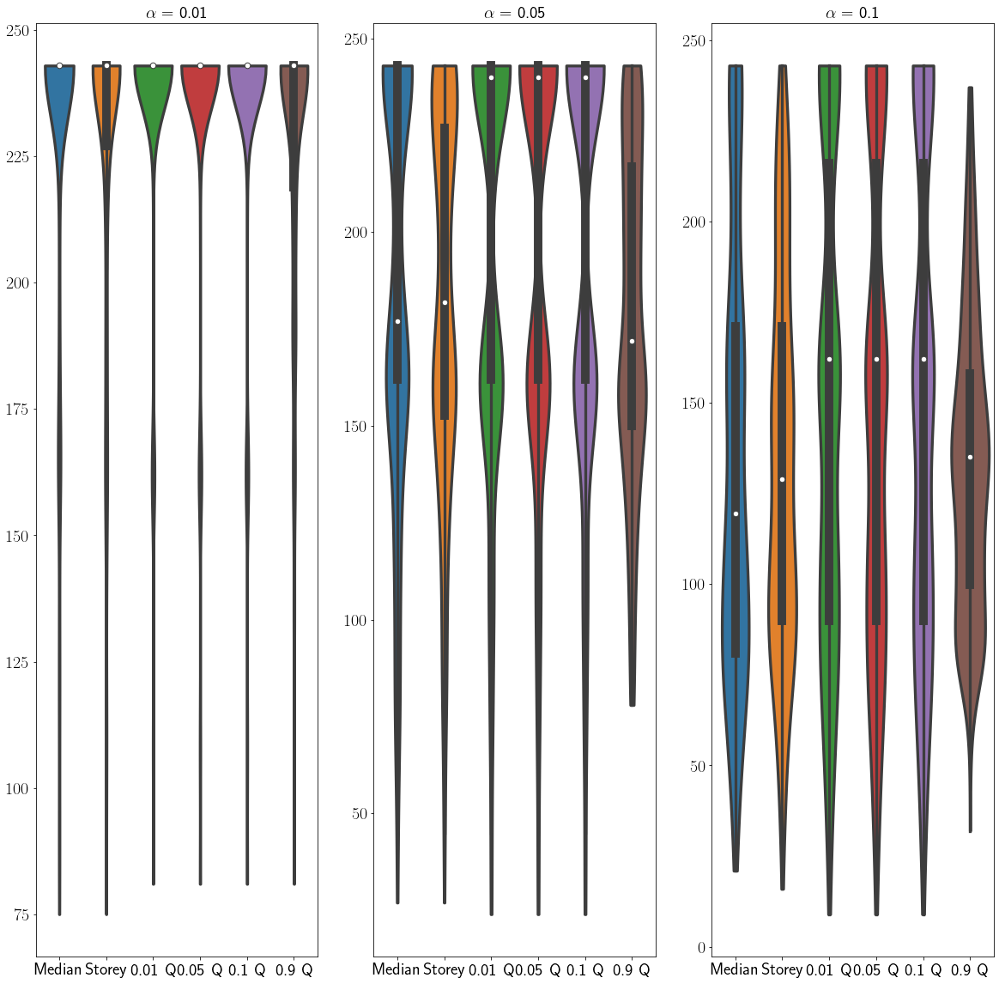

In [55]:
CombinViolinPlot(TotnPredictCIFAR_2000_5_lambdaFull,LambdaProcBis,np.array([3,8,0,1,2,4]).astype(int),AlphaViolin,np.array([0,1,2]).astype(int),"CIFARLambdaQuantile")

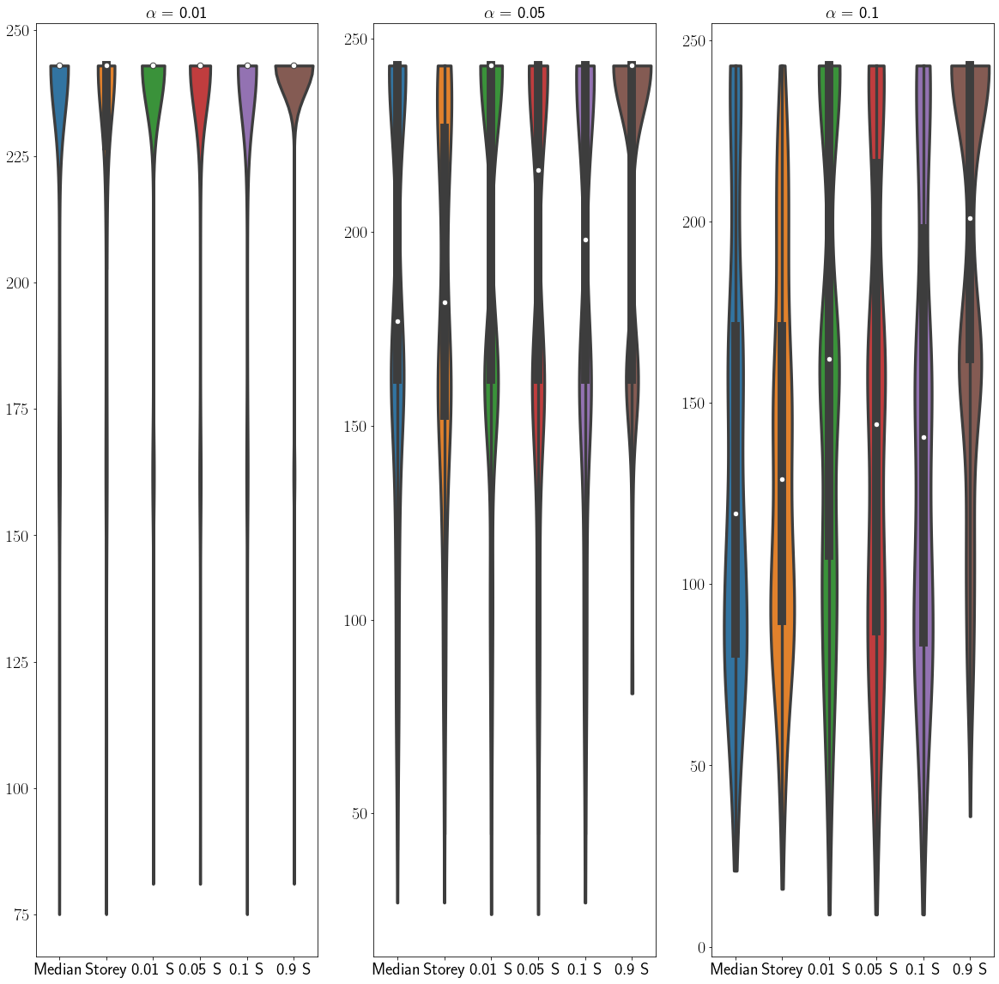

In [56]:
CombinViolinPlot(TotnPredictCIFAR_2000_5_lambdaFull,LambdaProcBis,np.array([3,8,5,6,7,9]).astype(int),AlphaViolin,np.array([0,1,2]).astype(int),"CIFARLambdaQuantile")

In [57]:
TotCovUSPS_700_3_lambdaClass=np.load('TotCovUSPS_700_3_lambdaClass.npy')
TotPowerUSPS_700_3_lambdaClass=np.load('TotPowerUSPS_700_3_lambdaClass.npy')
TotnPredictUSPS_700_3_lambdaClass=np.load('TotnPredictUSPS_700_3_lambdaClass.npy')

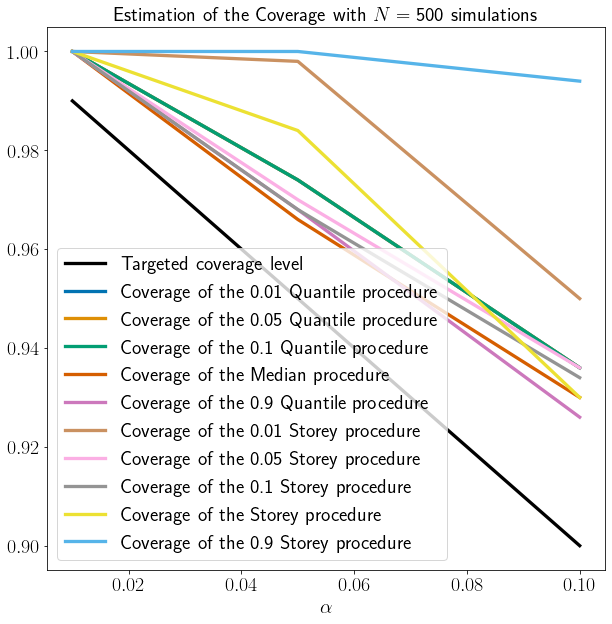

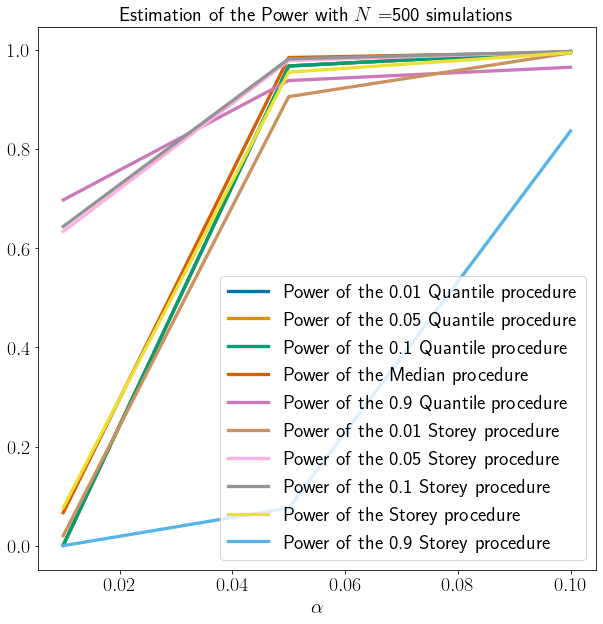

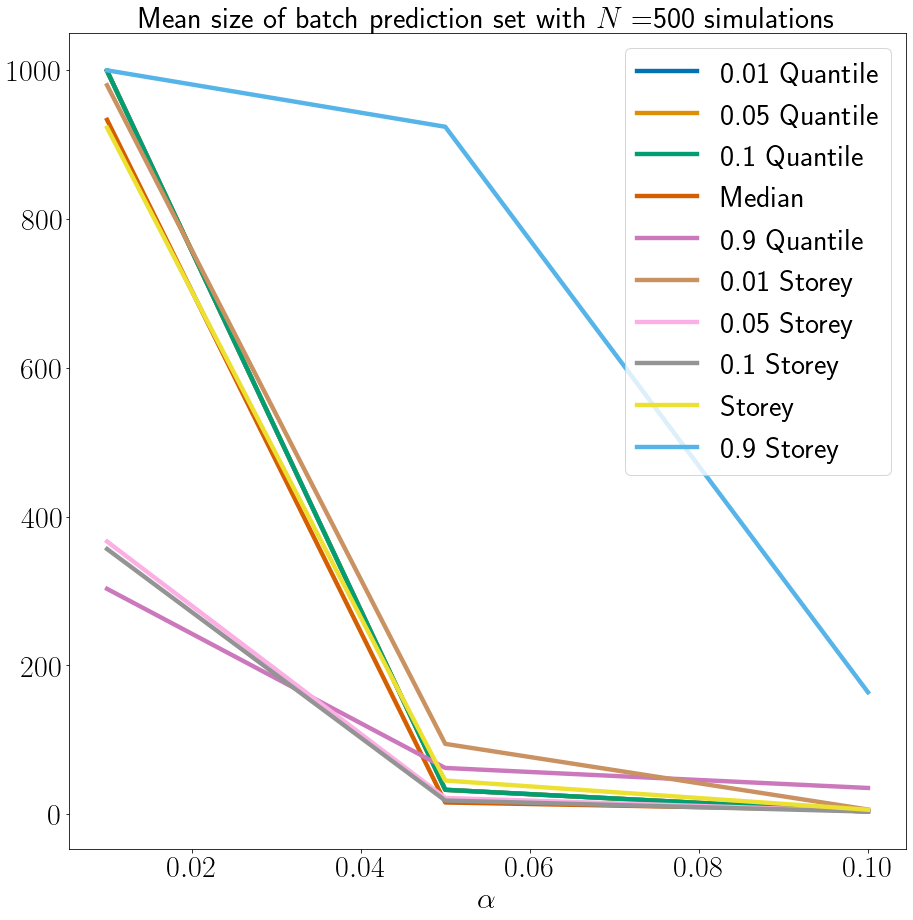

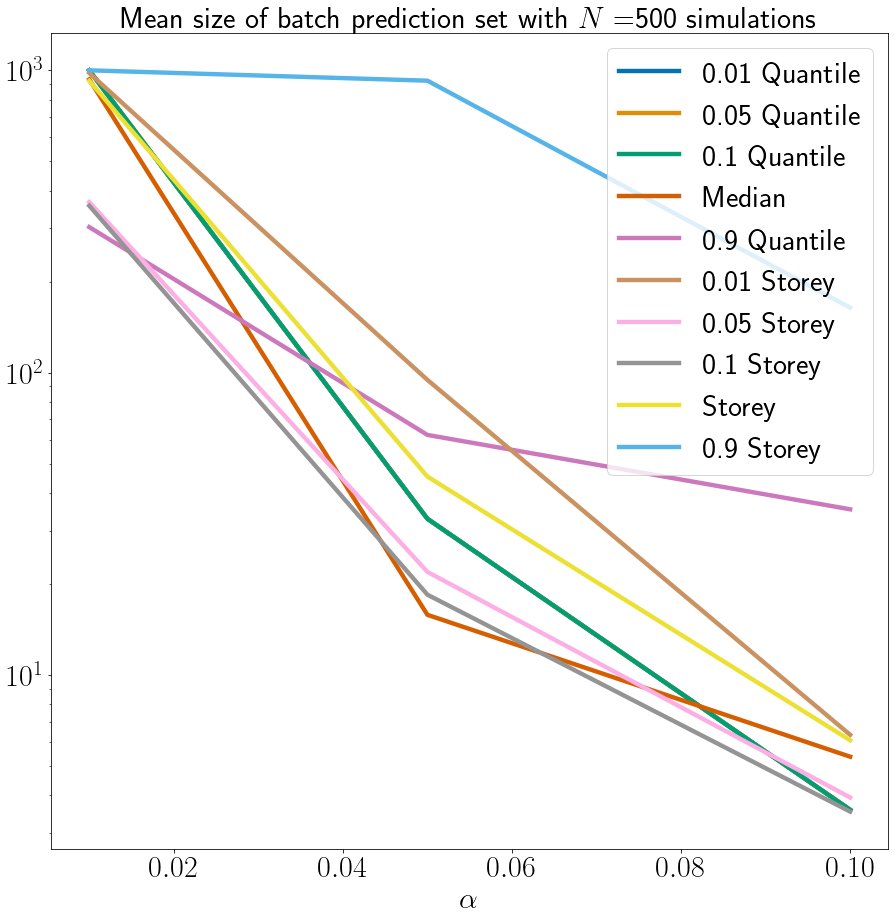

In [58]:
A,B,SizeUSPS=MeanPlot(TotCovUSPS_700_3_lambdaClass,TotPowerUSPS_700_3_lambdaClass,TotnPredictUSPS_700_3_lambdaClass,LambdaProc,AlphaViolin,Name='0',SaveFigs=0)

In [59]:
SizeUSPSLambda=pd.DataFrame(SizeUSPS[IndicProc].T,columns=NameProc,index=AlphaViolin)

In [60]:
SizeUSPSLambda.to_markdown('SizeUSPSLambda')

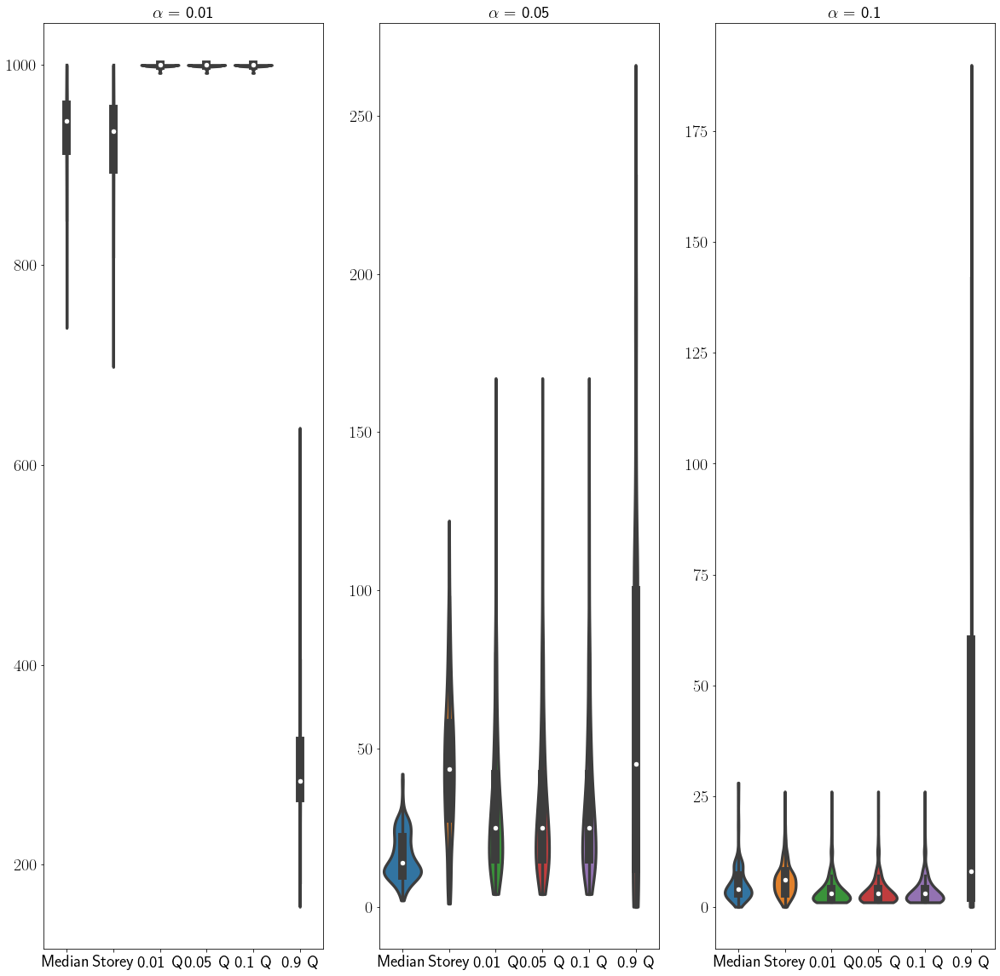

In [61]:
CombinViolinPlot(TotnPredictUSPS_700_3_lambdaClass,LambdaProcBis,np.array([3,8,0,1,2,4]).astype(int),AlphaViolin,np.array([0,1,2]).astype(int),"CIFARLambdaQuantile")

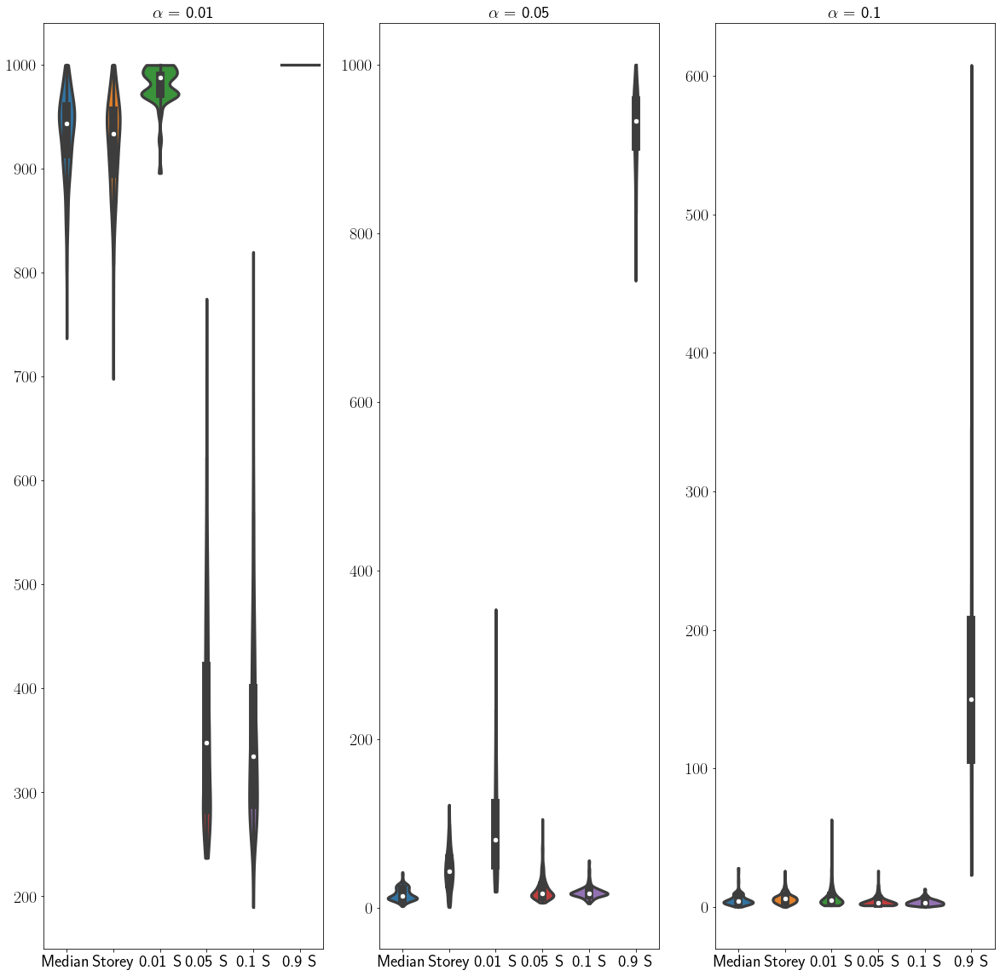

In [62]:
CombinViolinPlot(TotnPredictUSPS_700_3_lambdaClass,LambdaProcBis,np.array([3,8,5,6,7,9]).astype(int),AlphaViolin,np.array([0,1,2]).astype(int),"CIFARLambdaQuantile")

In [63]:
TotCovUSPS_700_3_lambdaFull=np.load('TotCovUSPS_700_3_lambdaFull.npy')
TotPowerUSPS_700_3_lambdaFull=np.load('TotPowerUSPS_700_3_lambdaFull.npy')
TotnPredictUSPS_700_3_lambdaFull=np.load('TotnPredictUSPS_700_3_lambdaFull.npy')

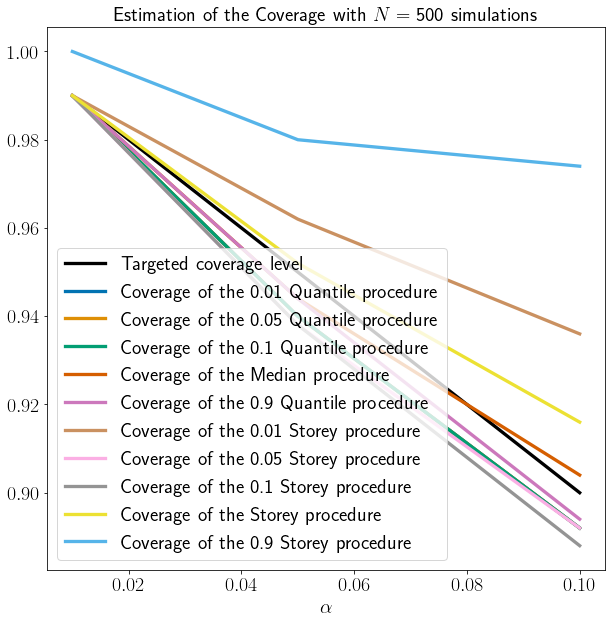

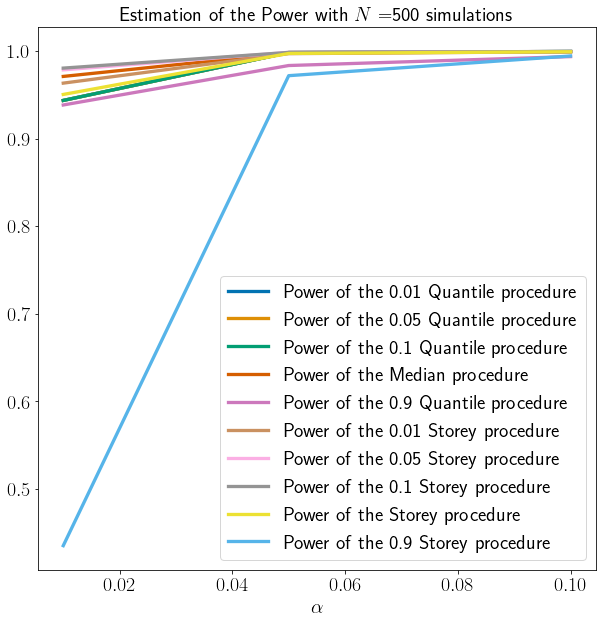

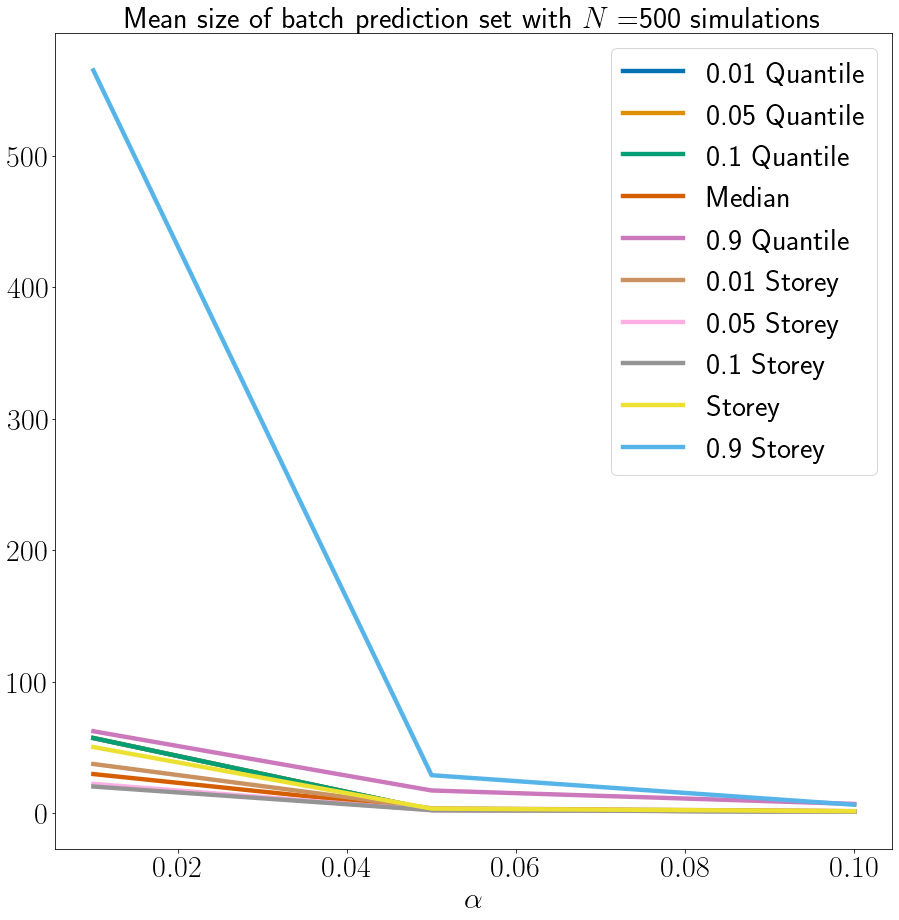

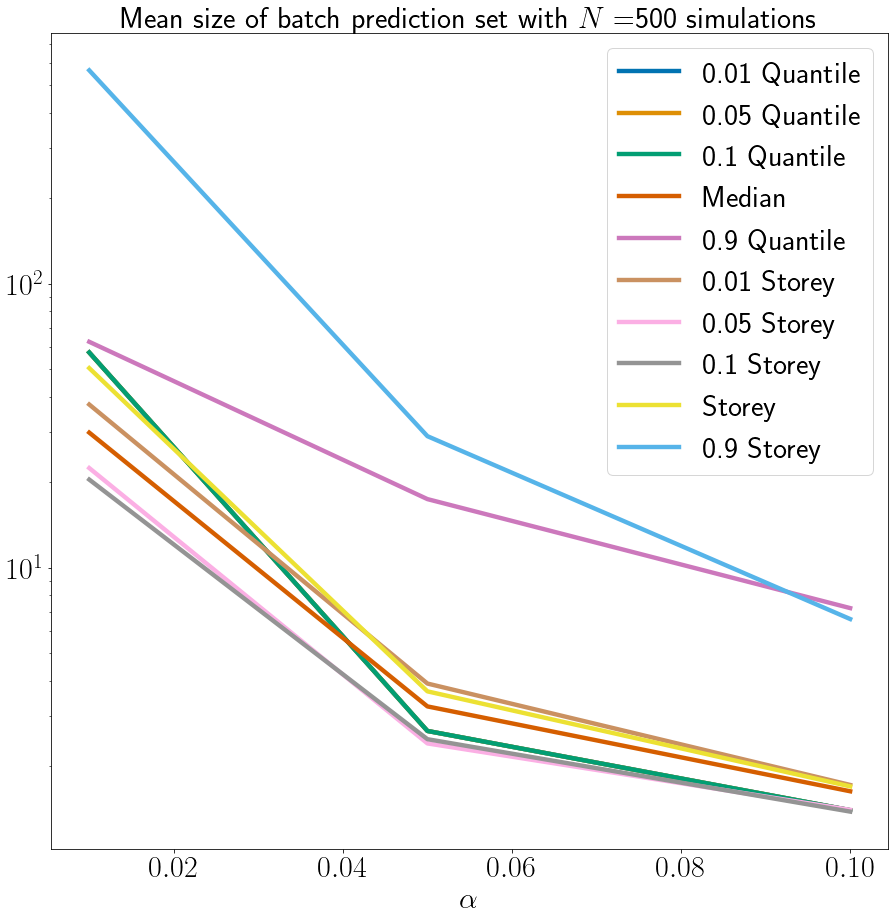

(array([[0.99 , 0.94 , 0.892],
        [0.99 , 0.94 , 0.892],
        [0.99 , 0.94 , 0.892],
        [0.99 , 0.944, 0.904],
        [0.99 , 0.944, 0.894],
        [0.99 , 0.962, 0.936],
        [0.99 , 0.938, 0.892],
        [0.99 , 0.938, 0.888],
        [0.99 , 0.952, 0.916],
        [1.   , 0.98 , 0.974]]),
 array([[0.94361962, 0.99827628, 0.99949149],
        [0.94361962, 0.99827628, 0.99949149],
        [0.94361962, 0.99827628, 0.99949149],
        [0.97103303, 0.99769369, 0.99927127],
        [0.93842643, 0.98347748, 0.99367768],
        [0.96336737, 0.99704905, 0.99921722],
        [0.97852052, 0.99853053, 0.99948749],
        [0.98052452, 0.99844645, 0.9995035 ],
        [0.95045445, 0.99727928, 0.99921722],
        [0.43535736, 0.97188188, 0.99437037]]),
 array([[ 57.314,   2.662,   1.4  ],
        [ 57.314,   2.662,   1.4  ],
        [ 57.314,   2.662,   1.4  ],
        [ 29.928,   3.248,   1.632],
        [ 62.502,  17.45 ,   7.21 ],
        [ 37.586,   3.91 ,   1.718],
    

In [64]:
MeanPlot(TotCovUSPS_700_3_lambdaFull,TotPowerUSPS_700_3_lambdaFull,TotnPredictUSPS_700_3_lambdaFull,LambdaProc,AlphaViolin,Name='0',SaveFigs=0)

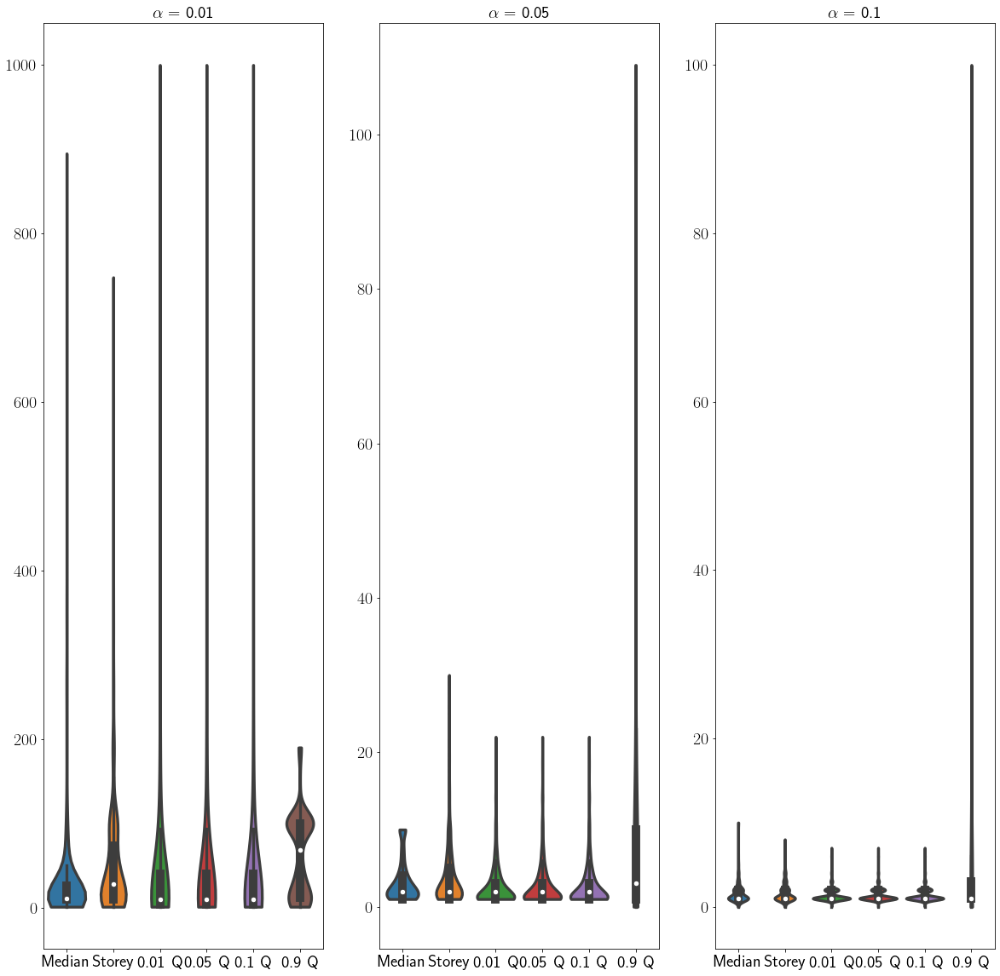

In [65]:
CombinViolinPlot(TotnPredictUSPS_700_3_lambdaFull,LambdaProcBis,np.array([3,8,0,1,2,4]).astype(int),AlphaViolin,np.array([0,1,2]).astype(int),"CIFARLambdaQuantile")

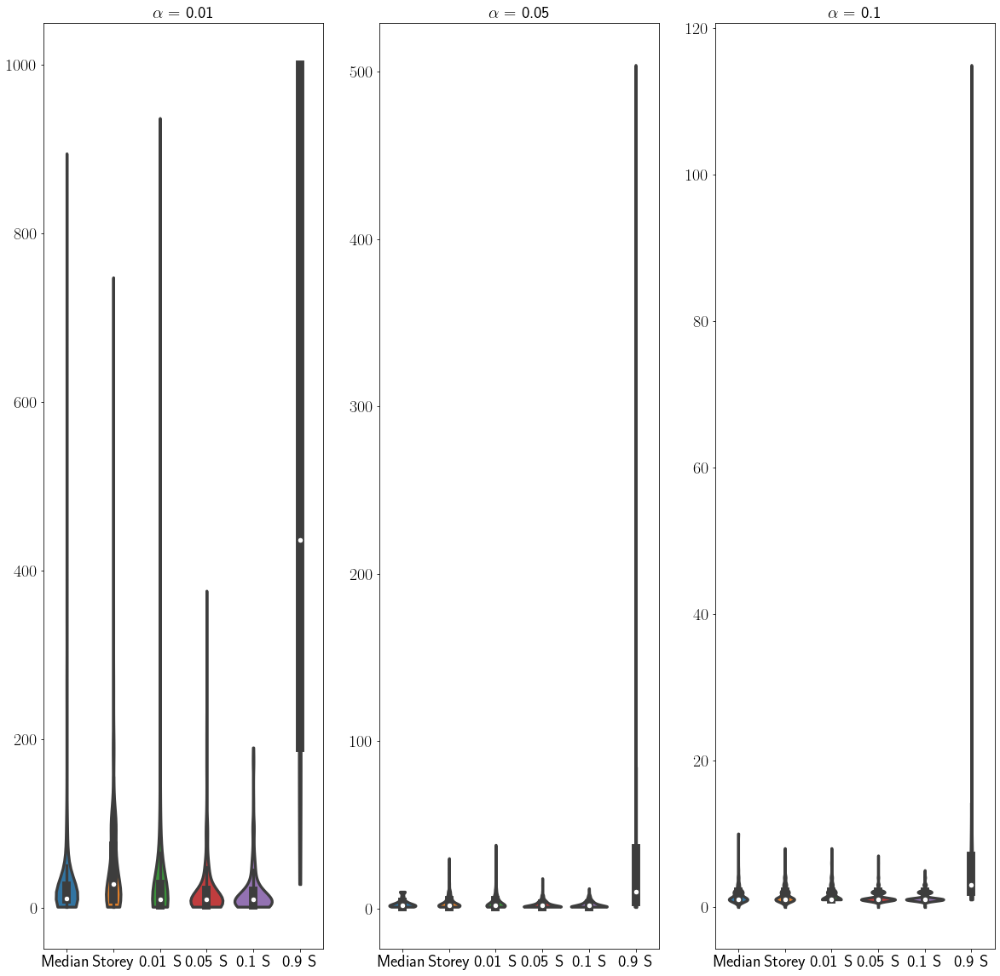

In [66]:
CombinViolinPlot(TotnPredictUSPS_700_3_lambdaFull,LambdaProcBis,np.array([3,8,5,6,7,9]).astype(int),AlphaViolin,np.array([0,1,2]).astype(int),"CIFARLambdaQuantile")

# CIFAR Choice of $\lambda$

$\alpha$=AlphaViolin.npy Convolutional Neural Network, $m=5$, $n_{cal}=2000$, Class Calibrated $p$-values. N=1000 replications

Methods: Simes, Bonf, Fisher, LambdaProcBis

In [153]:
LambdaProcBis=[str(AlphaViolin[0])+'-Q',str(AlphaViolin[1])+'-Q',str(AlphaViolin[2])+'-Q','Median',str(0.9)+'-Q',str(AlphaViolin[0])+'-S',str(AlphaViolin[1])+'-S',str(AlphaViolin[2])+'-S','Storey',str(0.9)+'-S']
AllMethod=['Simes','Bonf.','Fisher',str(AlphaViolin[0])+'-Q',str(AlphaViolin[1])+'-Q',str(AlphaViolin[2])+'-Q','Median',str(0.9)+'-Q',str(AlphaViolin[0])+'-S',str(AlphaViolin[1])+'-S',str(AlphaViolin[2])+'-S','Storey',str(0.9)+'-S']
QuantileNumber=[0,2,3,4,5,6,7]
StoreyNumber=[0,2,8,9,10,11,12]
Interest=[3,4,5,6,7,8,9,10,11,12]

In [154]:
[AllMethod[i] for i in QuantileNumber]

['Simes', 'Fisher', '0.01-Q', '0.05-Q', '0.1-Q', 'Median', '0.9-Q']

In [155]:
CovCIFAR_2000_5_lambda=np.load('TotCovCIFAR_2000_5_lambdaAllProcess_N1000.npy')
PowerCIFAR_2000_5_lambda=np.load('TotPowerCIFAR_2000_5_lambdaAllProcess_N1000.npy')
SizeCIFAR_2000_5_lambda=np.load('TotnPredictCIFAR_2000_5_lambdaAllProcess_N1000.npy')

$\alpha$=AlphaViolin.npy Convolutional Neural Network, $m=5$, $n_{cal}=2000$, Class Calibrated $p$-values. N=500 replications

Methods: Simes, Bonf, Fisher, LambdaProcBis

In [156]:
CovCIFAR_2000_5=np.load('TotCovCIFAR_2000_5_lambdaAllProcess_AlphaBis_N500.npy')
PowerCIFAR_2000_5=np.load('TotPowerCIFAR_2000_5_lambdaAllProcess_AlphaBis_N500.npy')
SizeCIFAR_2000_5=np.load('TotnPredictCIFAR_2000_5_lambdaAllProcess_AlphaBis_N500.npy')

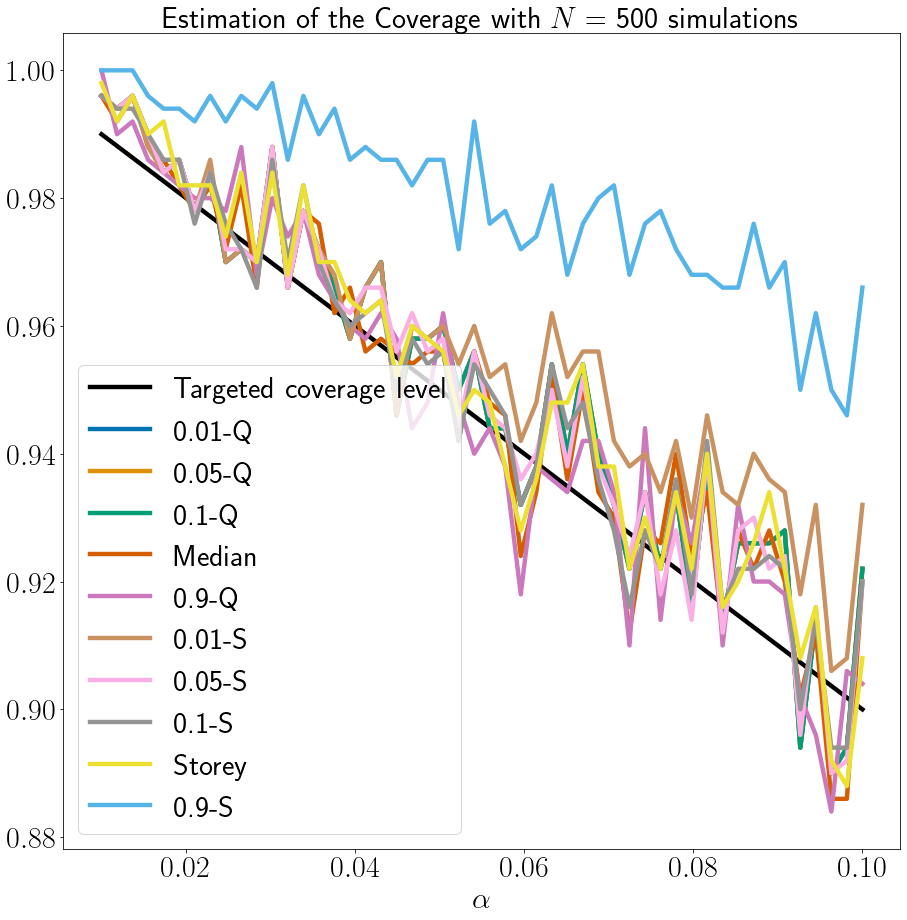

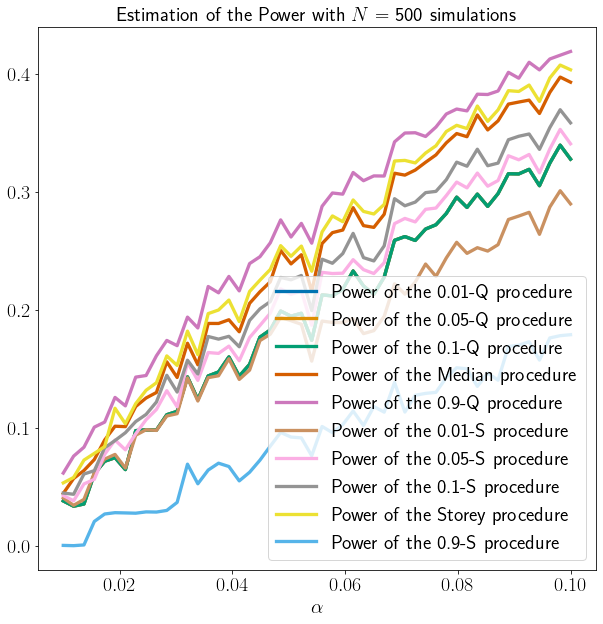

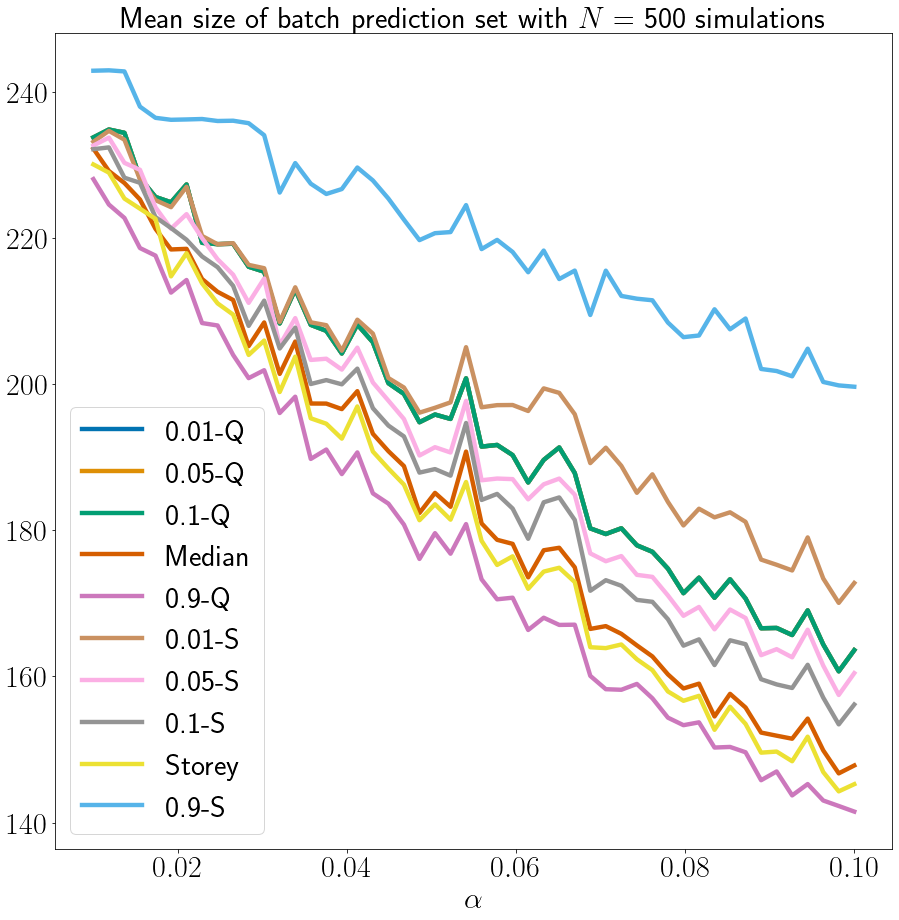

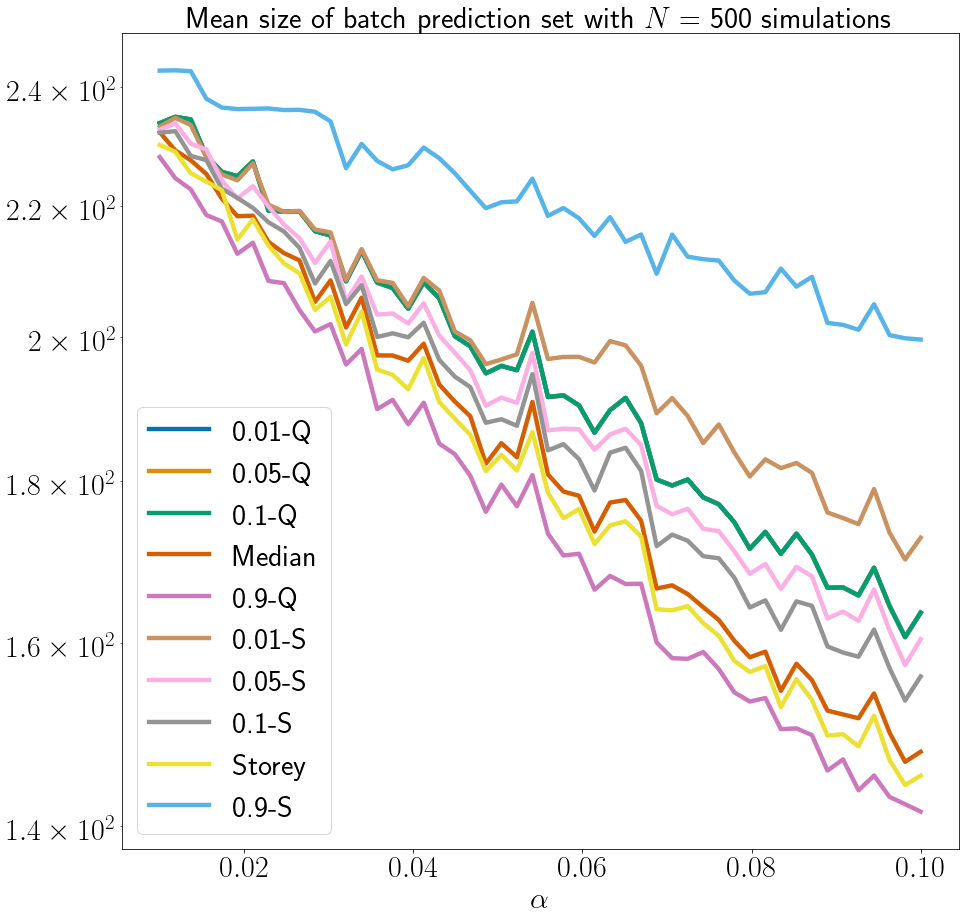

In [157]:
A,B,C=MeanPlot(CovCIFAR_2000_5[Interest],PowerCIFAR_2000_5[Interest] ,SizeCIFAR_2000_5[Interest],[AllMethod[i] for i in Interest],AlphaBis,Name='CIFAR_Comparison2',SaveFigs=True)

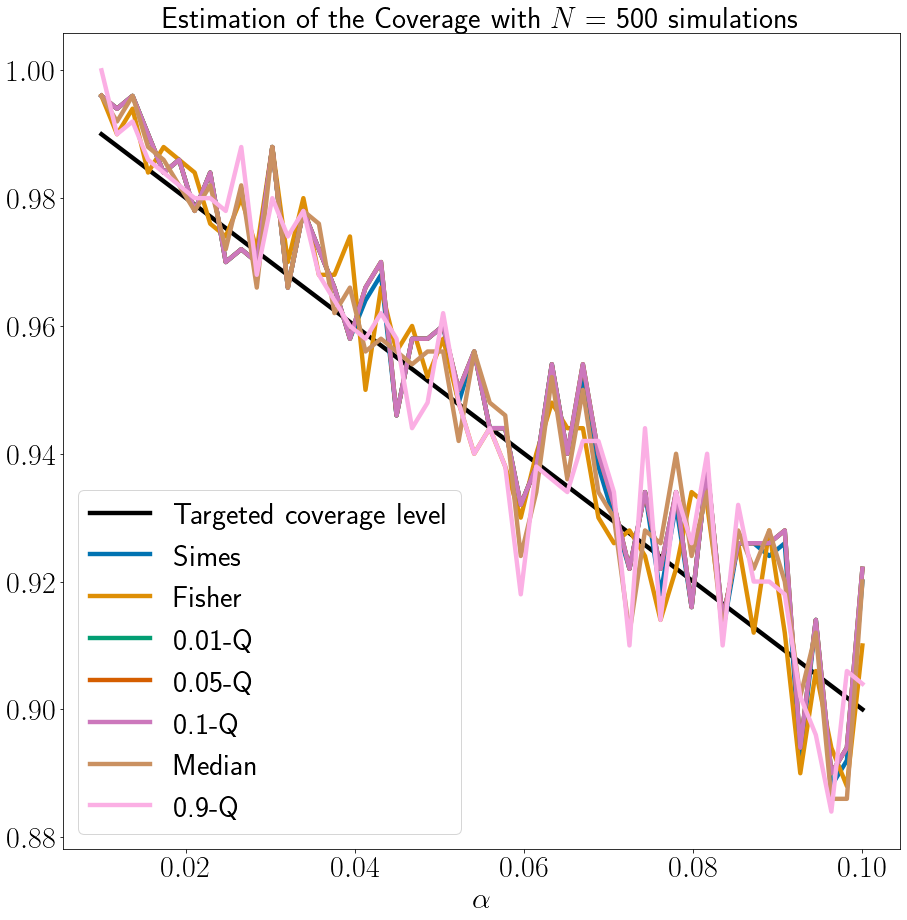

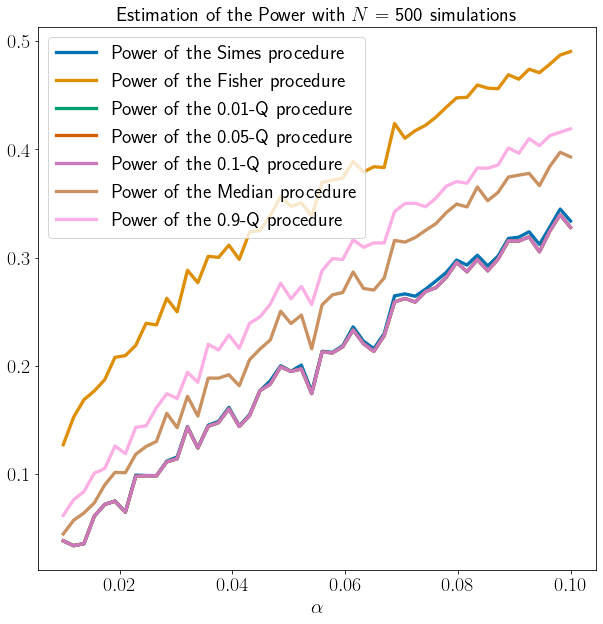

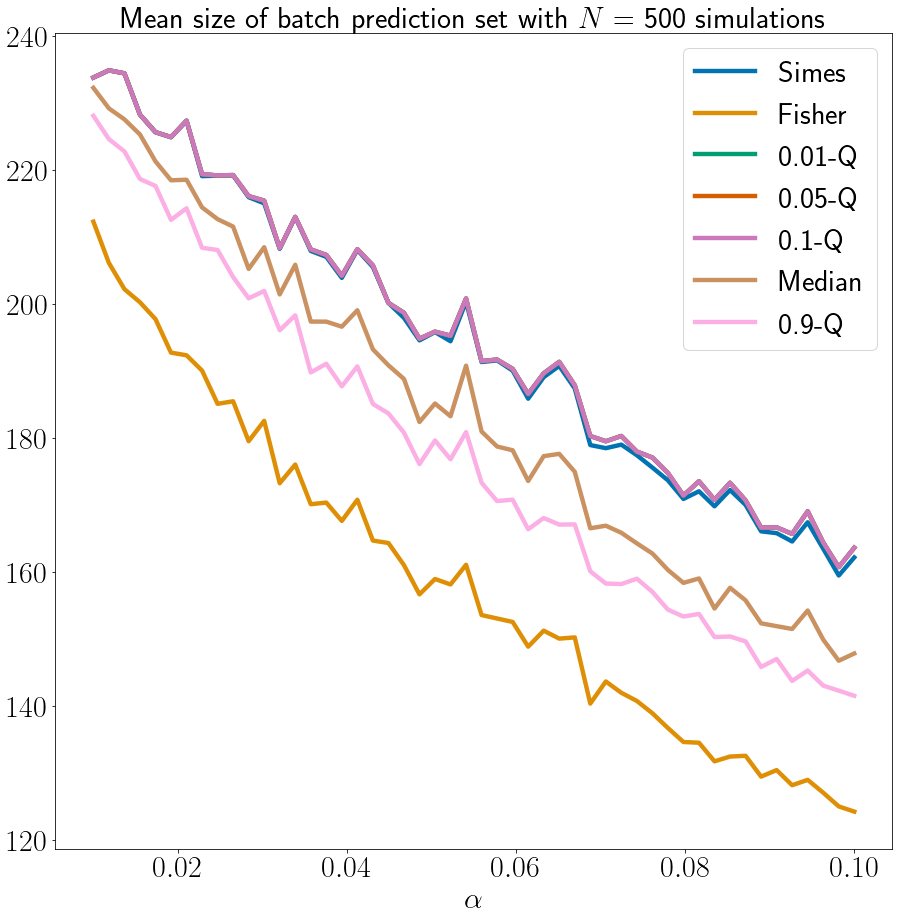

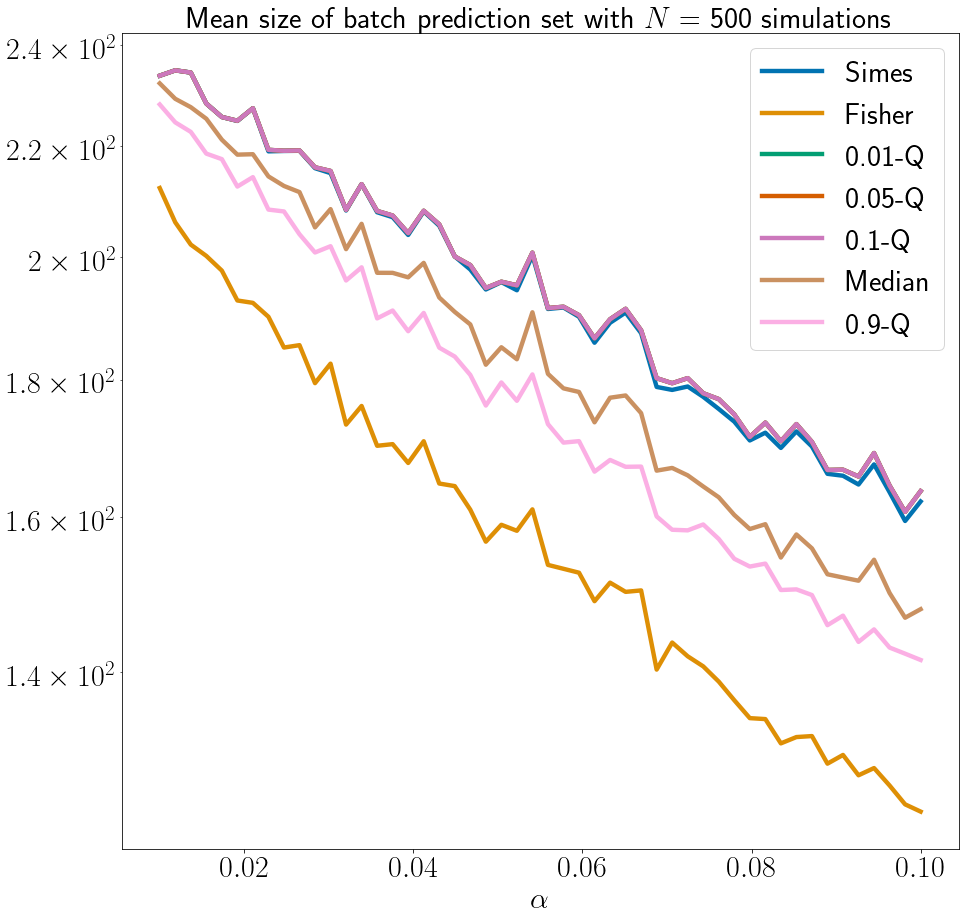

(array([[0.996, 0.994, 0.996, 0.99 , 0.984, 0.986, 0.978, 0.984, 0.97 ,
         0.972, 0.97 , 0.988, 0.966, 0.978, 0.972, 0.966, 0.958, 0.964,
         0.968, 0.946, 0.958, 0.958, 0.96 , 0.948, 0.956, 0.944, 0.944,
         0.932, 0.938, 0.954, 0.94 , 0.952, 0.938, 0.93 , 0.922, 0.934,
         0.918, 0.932, 0.916, 0.938, 0.912, 0.926, 0.926, 0.924, 0.926,
         0.892, 0.914, 0.888, 0.892, 0.92 ],
        [0.996, 0.99 , 0.994, 0.984, 0.988, 0.986, 0.984, 0.976, 0.974,
         0.98 , 0.972, 0.988, 0.97 , 0.98 , 0.968, 0.968, 0.974, 0.95 ,
         0.966, 0.956, 0.96 , 0.952, 0.958, 0.948, 0.94 , 0.944, 0.938,
         0.93 , 0.94 , 0.948, 0.944, 0.944, 0.93 , 0.926, 0.928, 0.924,
         0.914, 0.922, 0.934, 0.932, 0.914, 0.926, 0.912, 0.928, 0.912,
         0.89 , 0.906, 0.894, 0.888, 0.91 ],
        [0.996, 0.994, 0.996, 0.99 , 0.984, 0.986, 0.978, 0.984, 0.97 ,
         0.972, 0.97 , 0.988, 0.966, 0.978, 0.972, 0.966, 0.958, 0.966,
         0.97 , 0.946, 0.958, 0.958, 0.96 , 0.

In [158]:
#Quantile Only
MeanPlot(CovCIFAR_2000_5[QuantileNumber],PowerCIFAR_2000_5[QuantileNumber] ,SizeCIFAR_2000_5[QuantileNumber],[AllMethod[i] for i in QuantileNumber],AlphaBis,Name='0',SaveFigs=False)


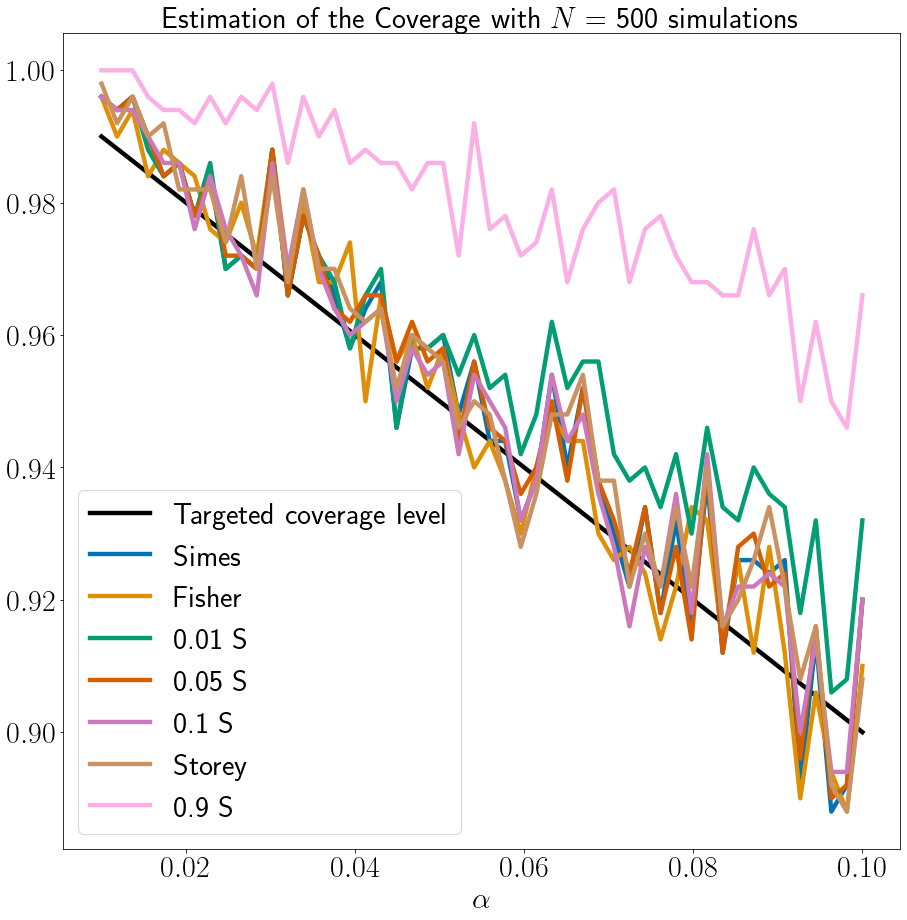

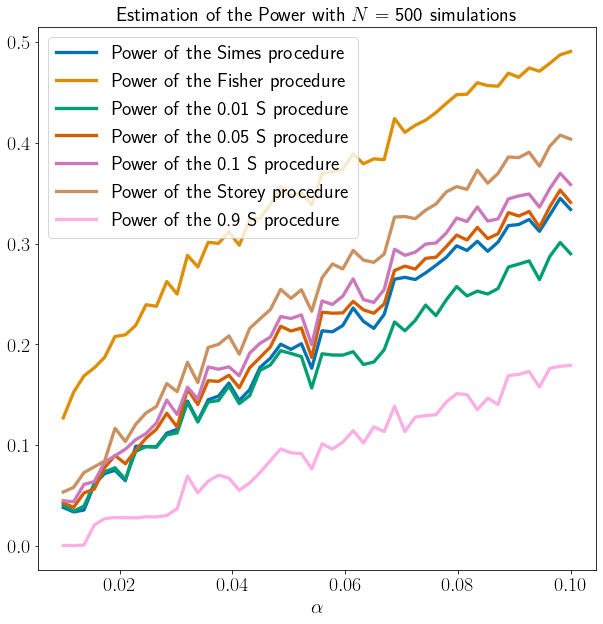

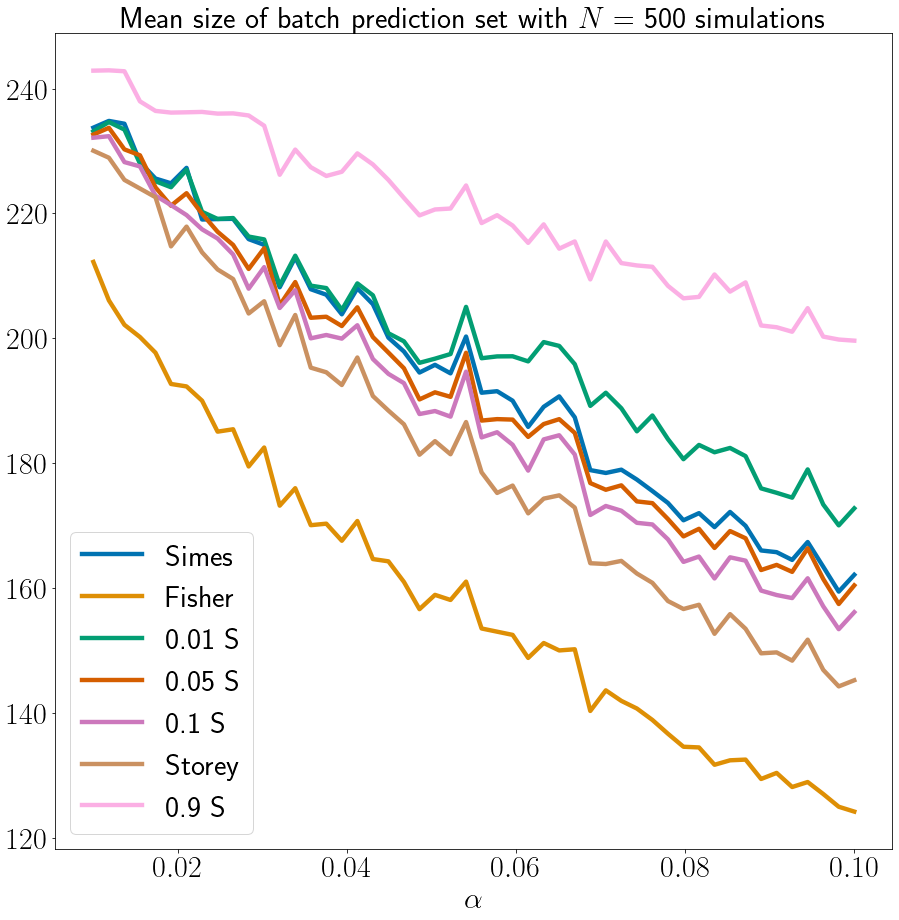

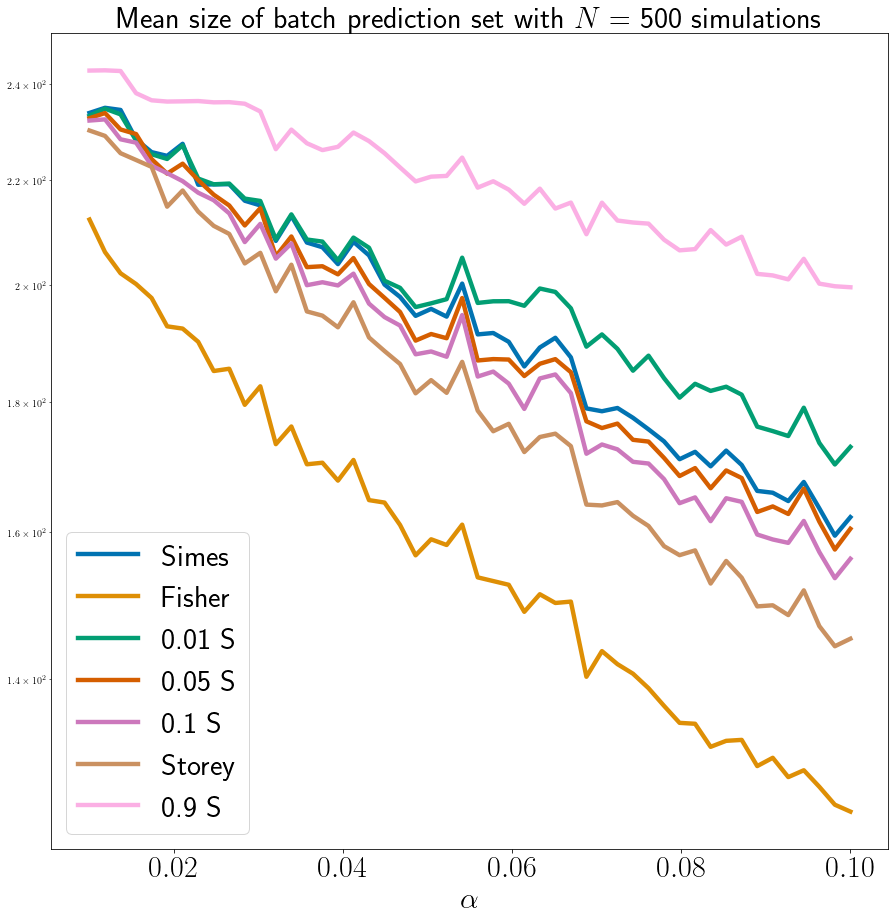

In [164]:
#Storey only
A,B,C=MeanPlot(CovCIFAR_2000_5[StoreyNumber],PowerCIFAR_2000_5[StoreyNumber] ,SizeCIFAR_2000_5[StoreyNumber],[AllMethod[i] for i in StoreyNumber],AlphaBis,Name='0',SaveFigs=False)

# USPS Choice of $\lambda$

$\alpha$=AlphaViolin.npy SVC, $m=3$, $n_{cal}=700$, Class Calibrated $p$-values. N=1000 replications

Methods: Simes, Bonf, Fisher, LambdaProcBis

In [159]:
TotCovUSPS_700_3_lambdaAllProcessClass=np.load('TotCovUSPS_700_3_lambdaAllProcessClass_N1000.npy')
TotPowerUSPS_700_3_lambdaAllProcessClass=np.load('TotPowerUSPS_700_3_lambdaAllProcessClass_N1000.npy')
TotnPredictUSPS_700_3_lambdaAllProcessClass=np.load('TotnPredictUSPS_700_3_lambdaAllProcessClass_N1000.npy')

$\alpha$=AlphaBis.npy SVC, $m=3$, $n_{cal}=700$, Class Calibrated $p$-values. N=500 replications

Methods: Simes, Bonf, Fisher, LambdaProcBis

In [160]:
CovUSPS_LambdaComparison=np.load('TotCovUSPS_700_3_lambdaAllProcessClass_AlphaBis_N500.npy')
PowerUSPS_LambdaComparison=np.load('TotPowerUSPS_700_3_lambdaAllProcessClass_AlphaBis_N500.npy')
SizeUSPS_LambdaComparison=np.load('TotnPredictUSPS_700_3_lambdaAllProcessClass_AlphaBis_N500.npy')

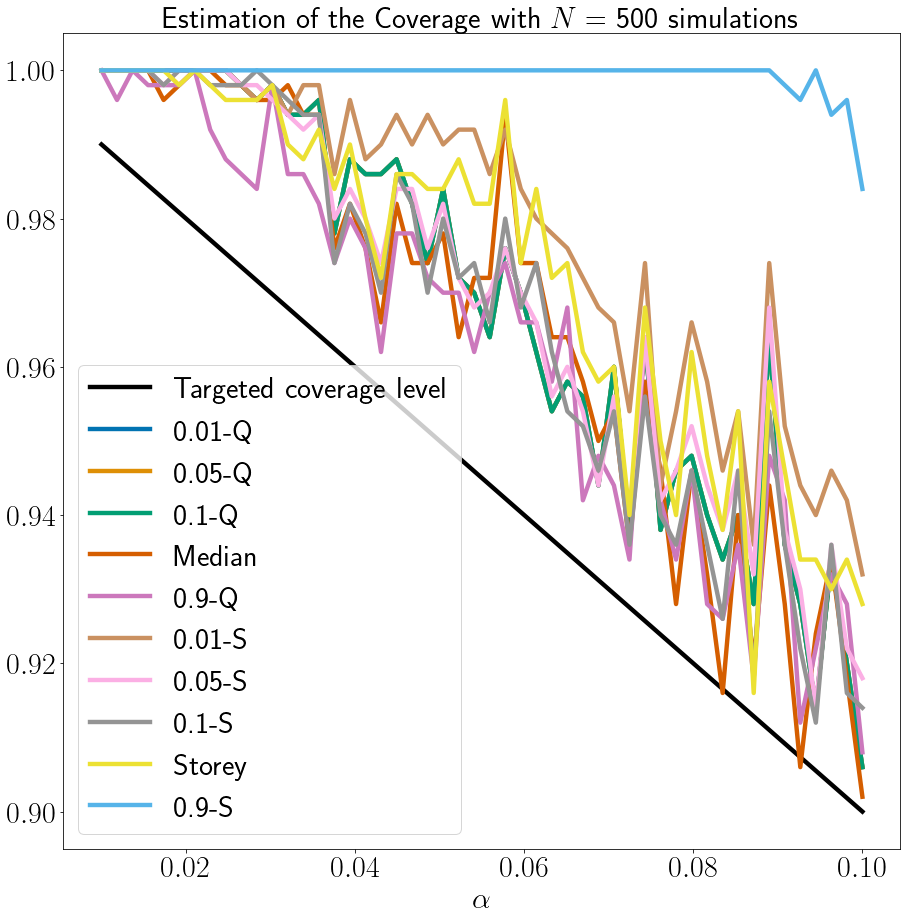

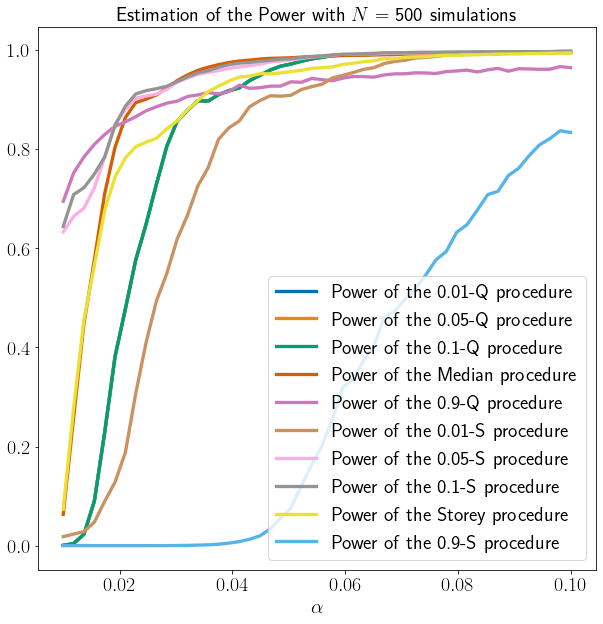

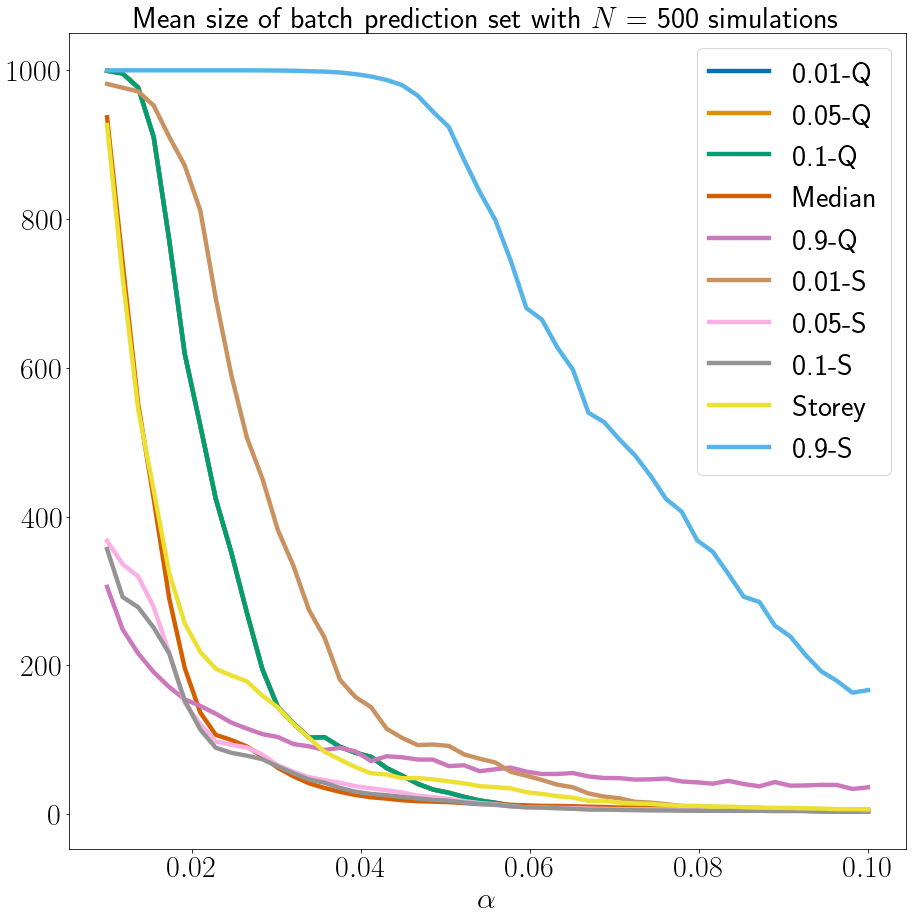

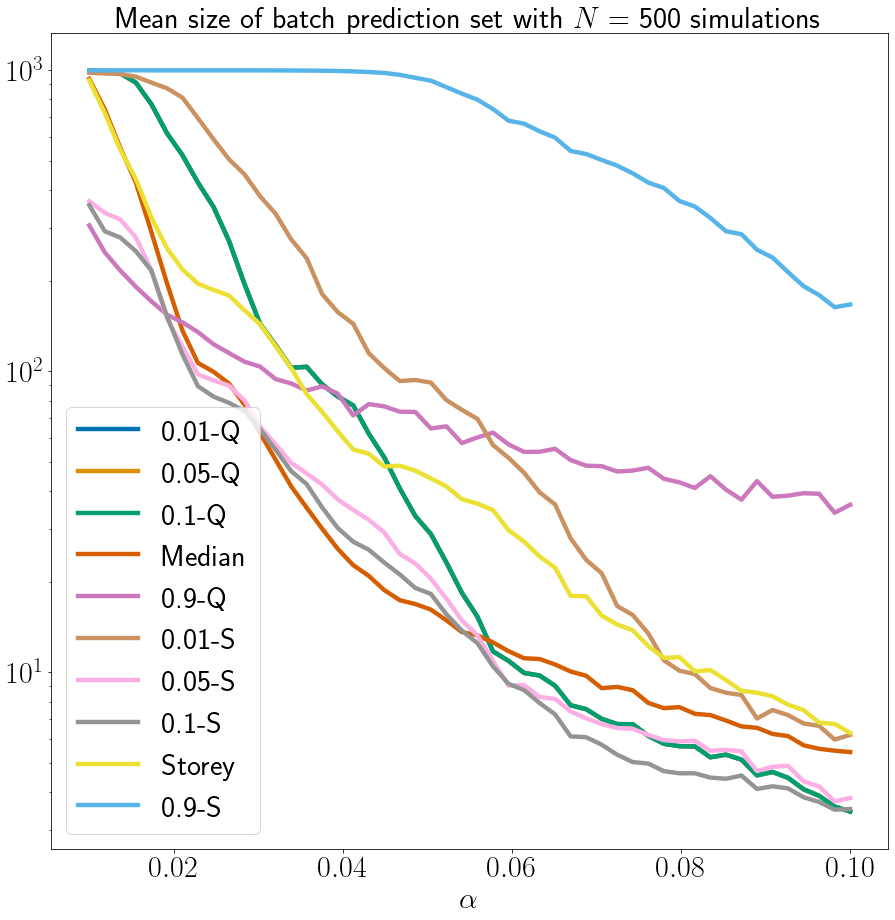

In [161]:
A,B,C=MeanPlot(CovUSPS_LambdaComparison[Interest],PowerUSPS_LambdaComparison[Interest] ,SizeUSPS_LambdaComparison[Interest],[AllMethod[i] for i in Interest],AlphaBis,Name='USPS_Comparison2',SaveFigs=True)

# CIFAR Full v Calibrated

Methods: Simes, Bonf, Storey $0.5$, Storey $0.05$, Median, Fisher

In [52]:
CovUnbal=np.load('TotCovCIFAR_TabFunctionAlphaBis_2000_01_03_06_5_09_02_02_N1000.npy')
PowerUnbal=np.load('TotPowerCIFAR_TabFunctionAlphaBis_2000_01_03_06_5_09_02_02_N1000.npy')
SizeUnbal=np.load('TotnPredictCIFAR_TabFunctionAlphaBis_2000_01_03_06_5_09_02_02_N1000.npy')

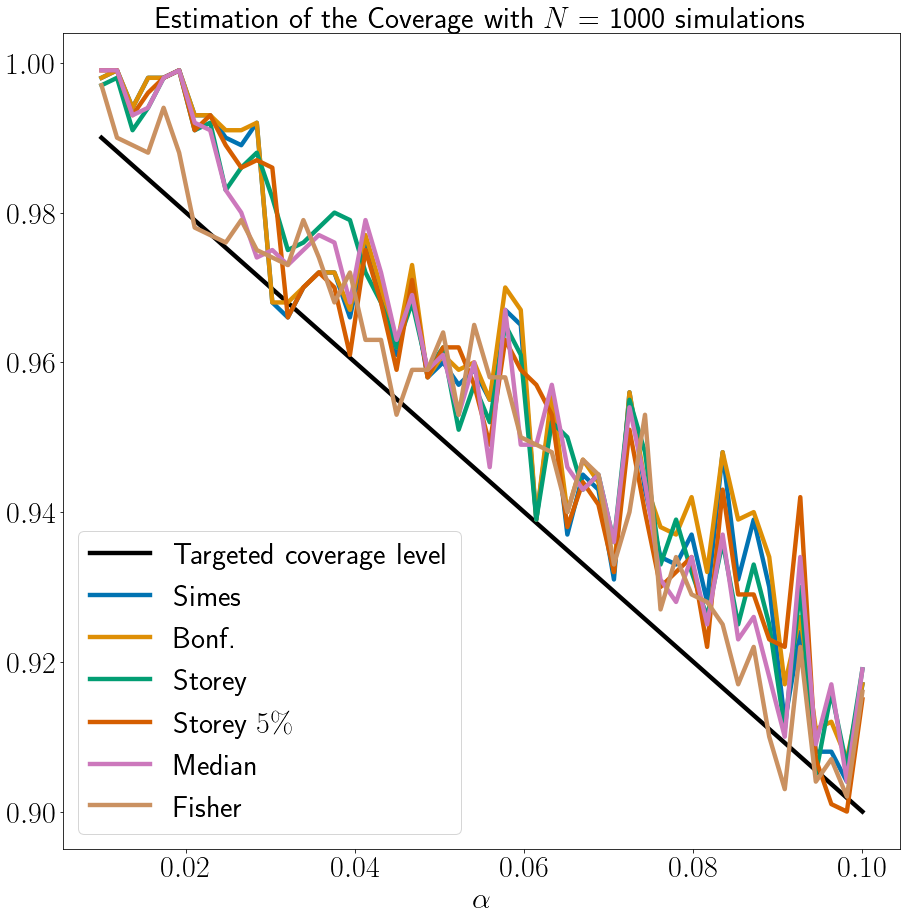

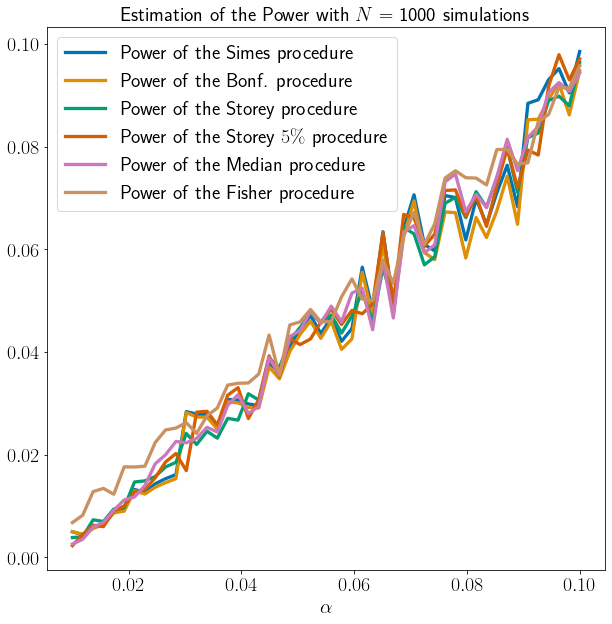

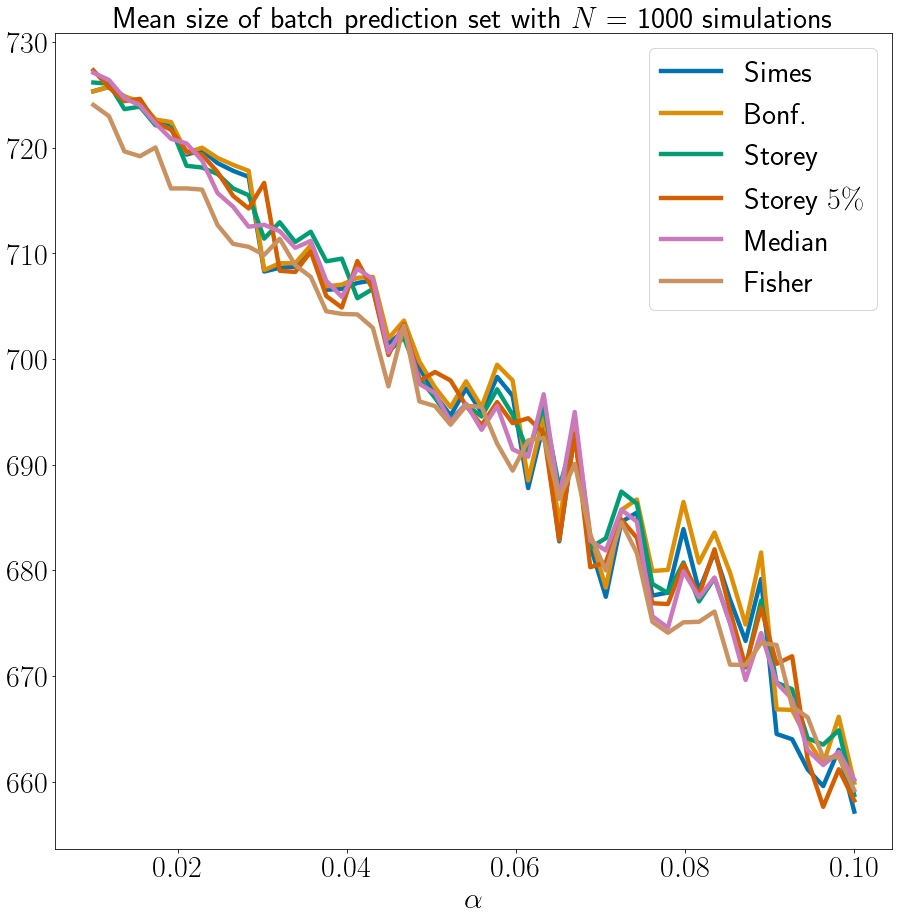

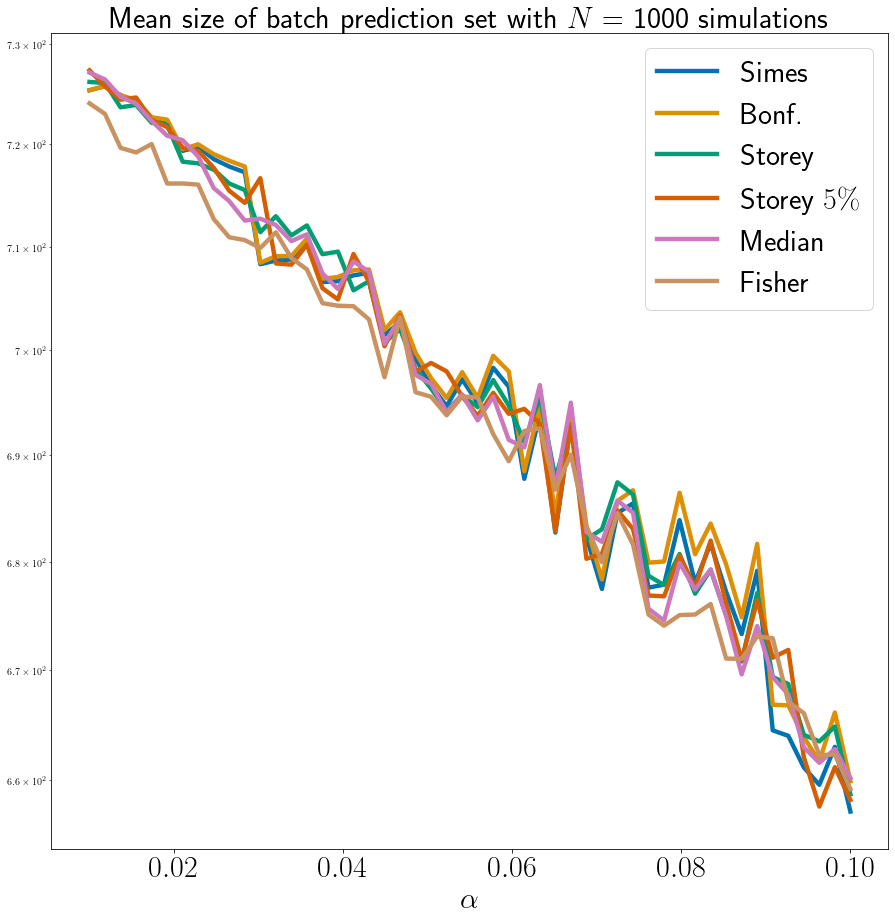

(array([[0.998, 0.999, 0.994, 0.998, 0.998, 0.999, 0.993, 0.993, 0.99 ,
         0.989, 0.992, 0.968, 0.966, 0.97 , 0.972, 0.972, 0.966, 0.976,
         0.969, 0.961, 0.97 , 0.958, 0.96 , 0.957, 0.959, 0.955, 0.967,
         0.965, 0.939, 0.955, 0.937, 0.945, 0.943, 0.931, 0.956, 0.943,
         0.934, 0.933, 0.937, 0.928, 0.948, 0.931, 0.939, 0.93 , 0.912,
         0.924, 0.908, 0.908, 0.904, 0.917],
        [0.998, 0.999, 0.994, 0.998, 0.998, 0.999, 0.993, 0.993, 0.991,
         0.991, 0.992, 0.968, 0.968, 0.97 , 0.972, 0.972, 0.967, 0.977,
         0.97 , 0.962, 0.973, 0.958, 0.961, 0.959, 0.96 , 0.955, 0.97 ,
         0.967, 0.939, 0.956, 0.94 , 0.947, 0.944, 0.932, 0.956, 0.944,
         0.938, 0.937, 0.942, 0.932, 0.948, 0.939, 0.94 , 0.934, 0.917,
         0.926, 0.911, 0.912, 0.907, 0.917],
        [0.997, 0.998, 0.991, 0.994, 0.998, 0.999, 0.991, 0.992, 0.983,
         0.986, 0.988, 0.982, 0.975, 0.976, 0.978, 0.98 , 0.979, 0.972,
         0.968, 0.962, 0.968, 0.959, 0.962, 0.

In [53]:
MeanPlot(CovUnbal[0],PowerUnbal[0],SizeUnbal[0],NewProcedure,AlphaBis,Name='CIFAR_Class',SaveFigs=1)

In [55]:
np.max(np.std(CovUnbal[0],axis=2))

0.3

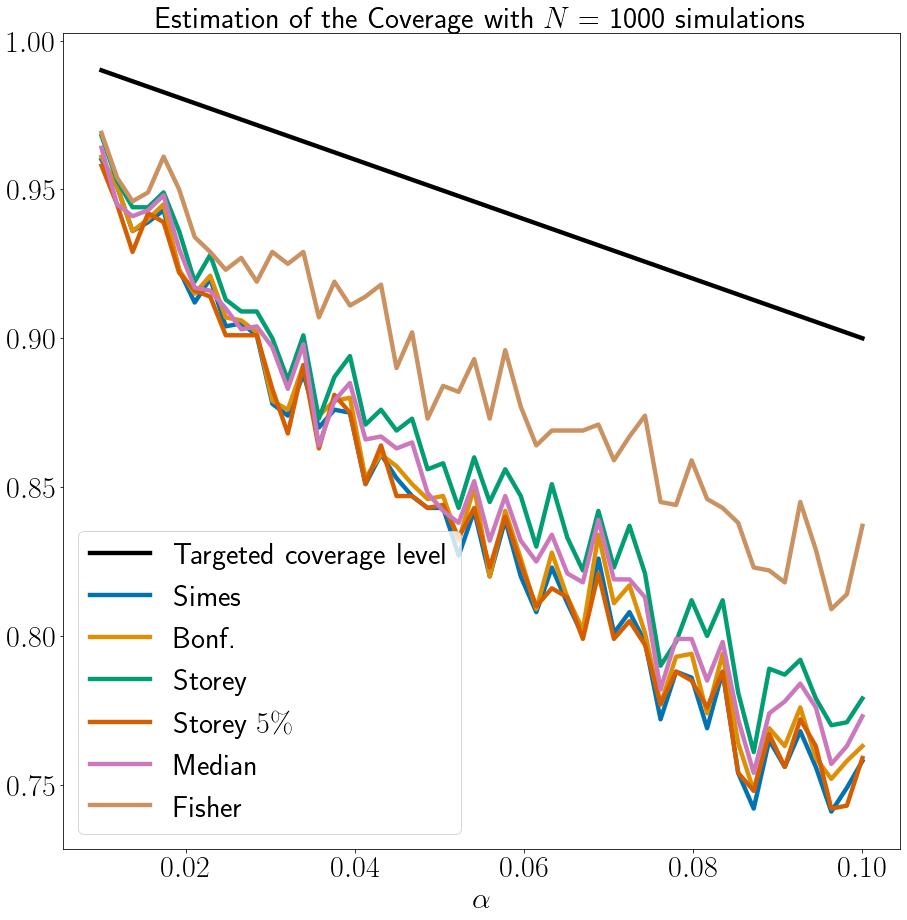

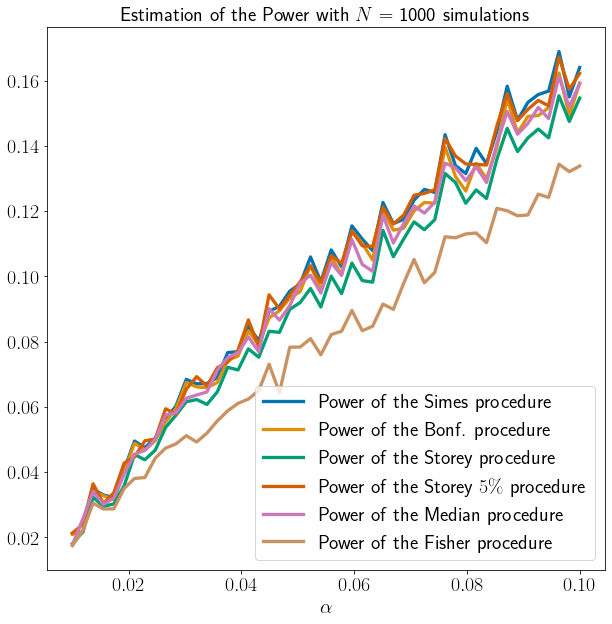

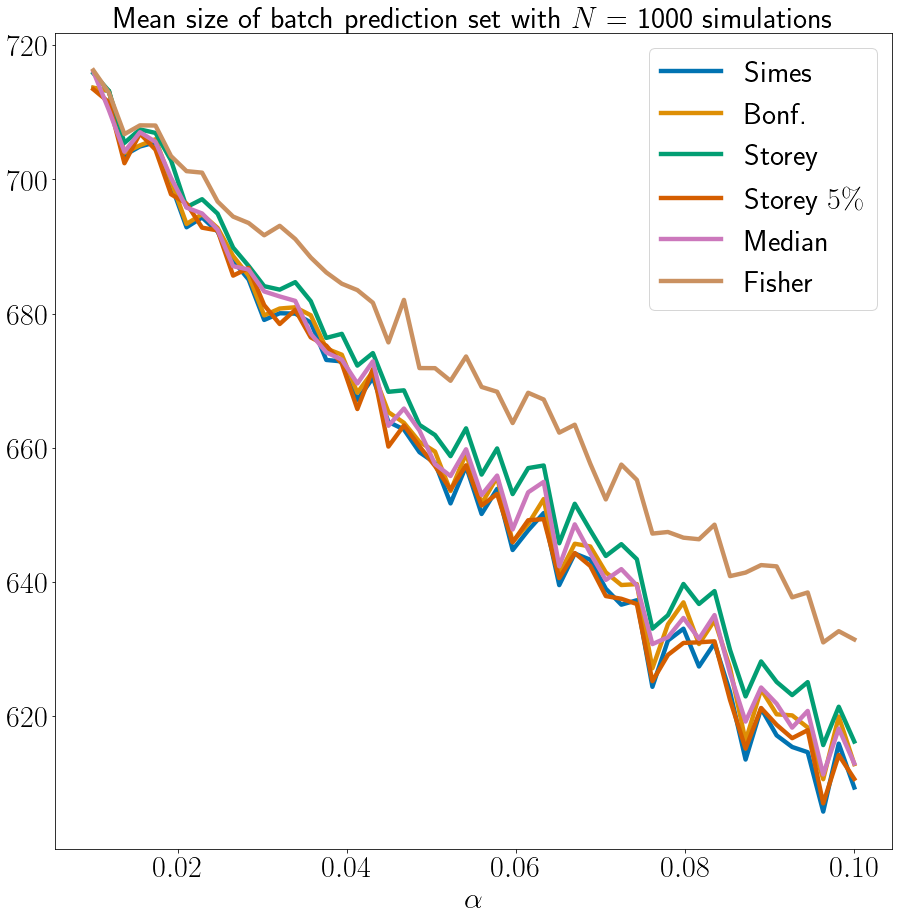

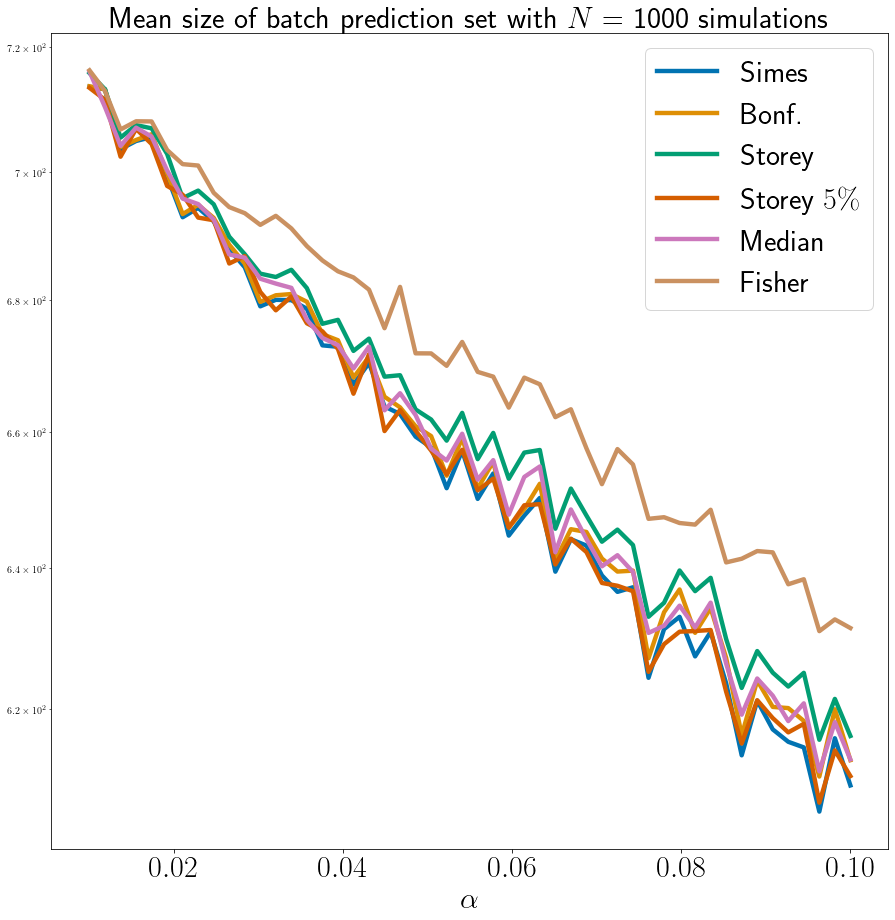

(array([[0.96 , 0.951, 0.936, 0.939, 0.943, 0.923, 0.912, 0.92 , 0.904,
         0.905, 0.901, 0.878, 0.874, 0.888, 0.87 , 0.876, 0.875, 0.851,
         0.861, 0.853, 0.847, 0.843, 0.843, 0.827, 0.842, 0.82 , 0.839,
         0.82 , 0.808, 0.823, 0.811, 0.8  , 0.826, 0.801, 0.808, 0.798,
         0.772, 0.788, 0.786, 0.769, 0.788, 0.754, 0.742, 0.765, 0.756,
         0.768, 0.756, 0.741, 0.749, 0.758],
        [0.961, 0.951, 0.936, 0.94 , 0.945, 0.923, 0.915, 0.921, 0.907,
         0.906, 0.902, 0.879, 0.876, 0.891, 0.874, 0.879, 0.88 , 0.853,
         0.861, 0.857, 0.851, 0.846, 0.847, 0.832, 0.85 , 0.82 , 0.842,
         0.826, 0.809, 0.828, 0.813, 0.802, 0.834, 0.811, 0.817, 0.801,
         0.777, 0.793, 0.794, 0.774, 0.794, 0.764, 0.748, 0.769, 0.763,
         0.776, 0.759, 0.752, 0.758, 0.763],
        [0.968, 0.953, 0.944, 0.944, 0.949, 0.936, 0.919, 0.928, 0.913,
         0.909, 0.909, 0.9  , 0.886, 0.901, 0.873, 0.887, 0.894, 0.871,
         0.876, 0.869, 0.873, 0.856, 0.858, 0.

In [172]:
MeanPlot(CovUnbal[1],PowerUnbal[1],SizeUnbal[1],NewProcedure,AlphaBis,Name='CIFAR_Full',SaveFigs=1)

In [56]:
np.max(np.std(CovUnbal[1],axis=2))

0.43808560807221225

# CIFAR with LRT

$\alpha$=AlphaViolin.npy Convolutional Neural Network, $m=5$, $n_{cal}=2000$, Class Calibrated $p$-values. N=1000 replications

Methods: Simes, Bonf, Storey $0.5$, Storey $0.05$, Median, Fisher, LRT ($B_{perm}=1000$)

In [59]:
CovCIFARLRT=np.load('TotCovCIFAR_2000_5_Proc_Bperm1000_N1000.npy')
PowerCIFARLRT=np.load('TotPowerCIFAR_2000_5_Proc_Bperm1000_N1000.npy')
SizeCIFARLRT=np.load('TotnPredictCIFAR_2000_5_Proc_Bperm1000_N1000.npy')
TimesCIFARLRT=np.load('TotTimesCIFAR_2000_5_Proc_Bperm1000_N1000.npy')

In [60]:
NewProcedureLRT=['Simes', 'Bonf.',  r"Storey",r'Storey $5\%$','Median','Fisher','LRT']

In [61]:
Times=-TimesCIFARLRT

In [62]:
np.shape(np.mean(Times,axis=2))

(7, 3)

In [63]:
np.mean(Times,axis=2)

array([[6.79089973e-03, 6.60064757e-03, 5.75456380e-03],
       [3.48832181e-03, 3.34625038e-03, 3.05355897e-03],
       [5.26921072e-03, 5.13348108e-03, 4.79113869e-03],
       [4.83511962e-03, 4.69865873e-03, 4.57011180e-03],
       [3.95486069e-03, 3.86658964e-03, 3.80367826e-03],
       [1.54772753e-02, 1.51487523e-02, 1.48782972e-02],
       [7.47463277e+00, 7.46094744e+00, 7.50573840e+00]])

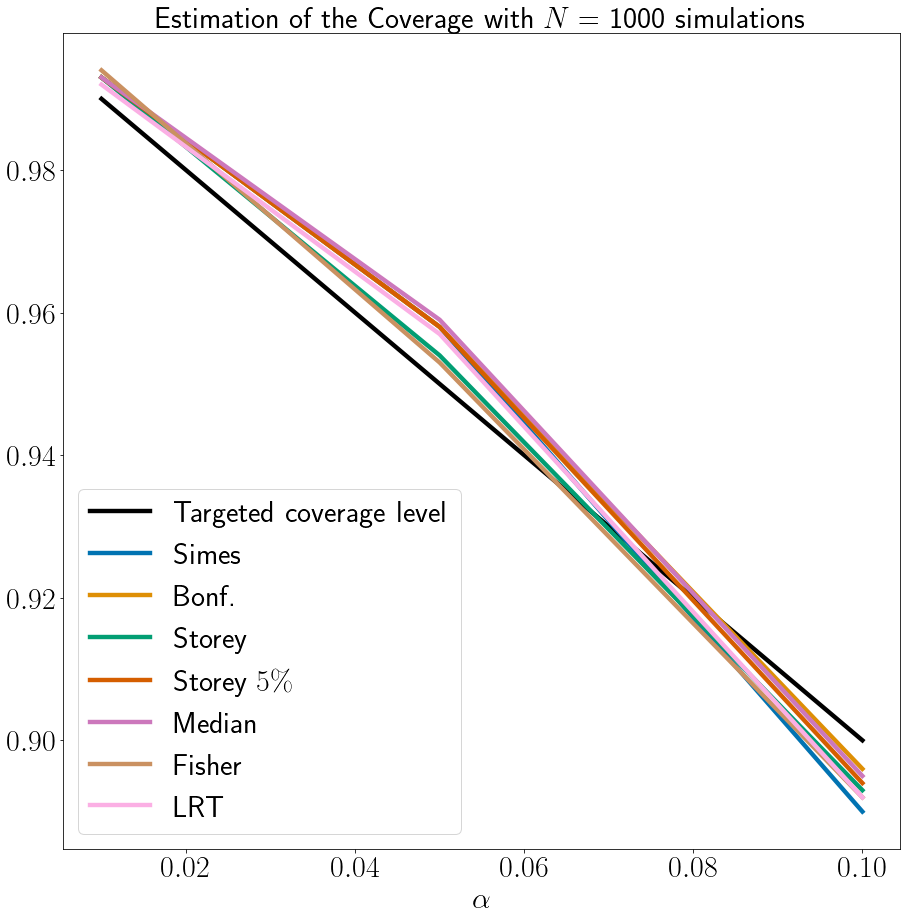

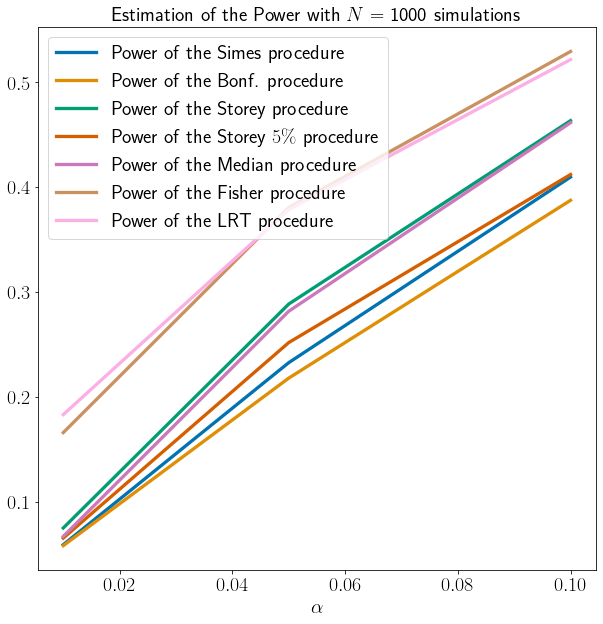

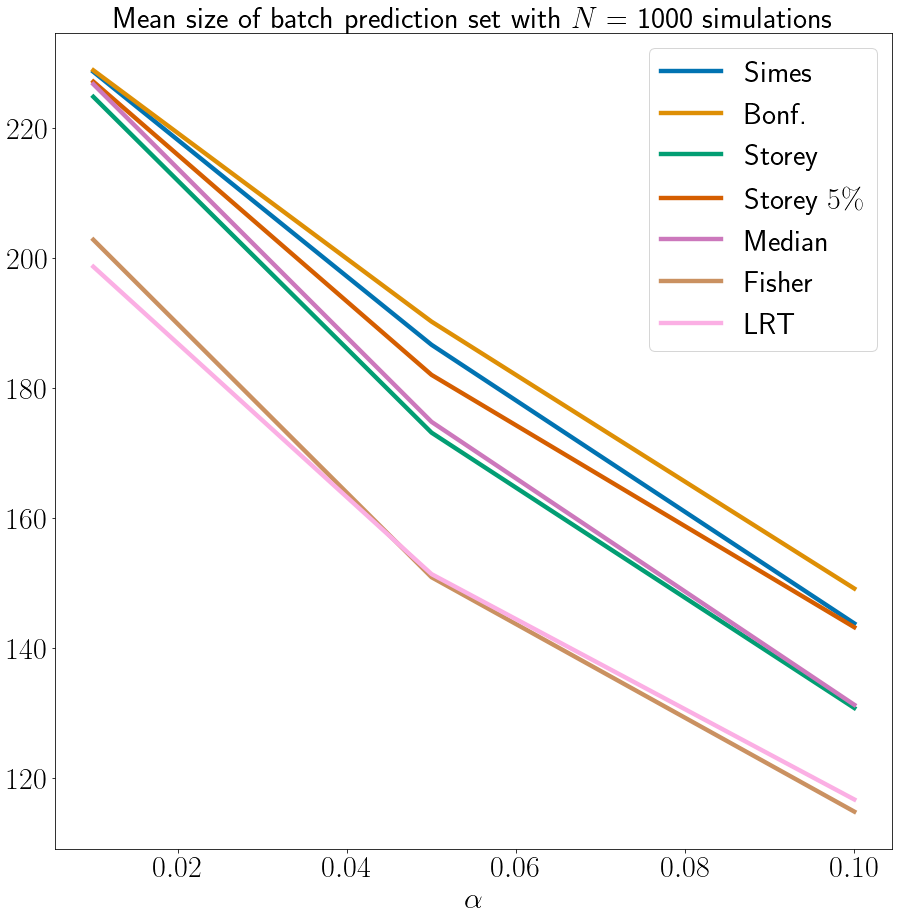

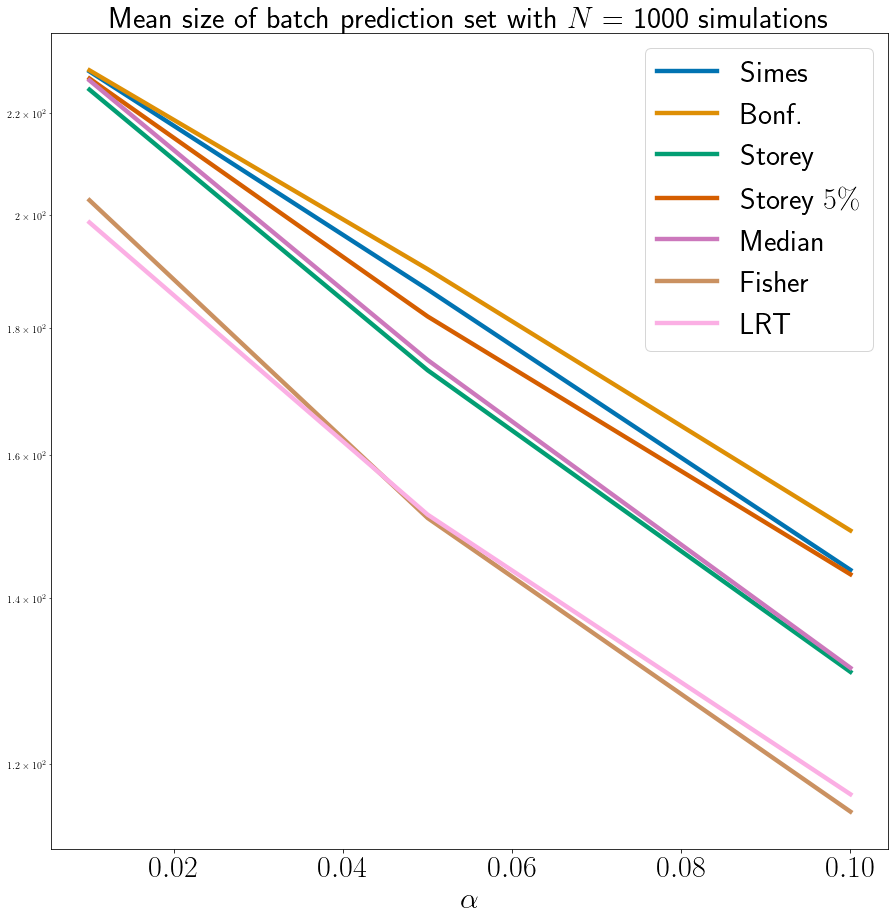

In [64]:
CovCIFAR,PowCifar,SizeCIFAR=MeanPlot(CovCIFARLRT,PowerCIFARLRT,SizeCIFARLRT,NewProcedureLRT,AlphaViolin,0)

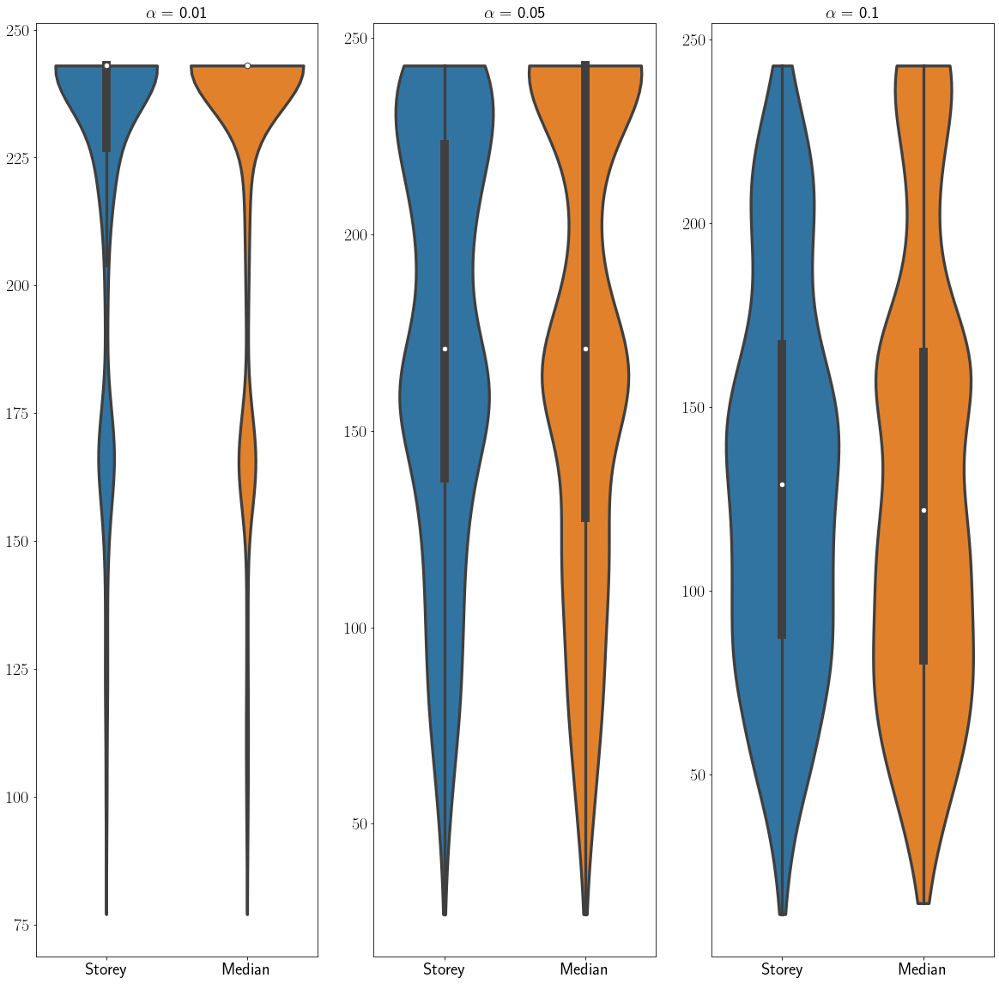

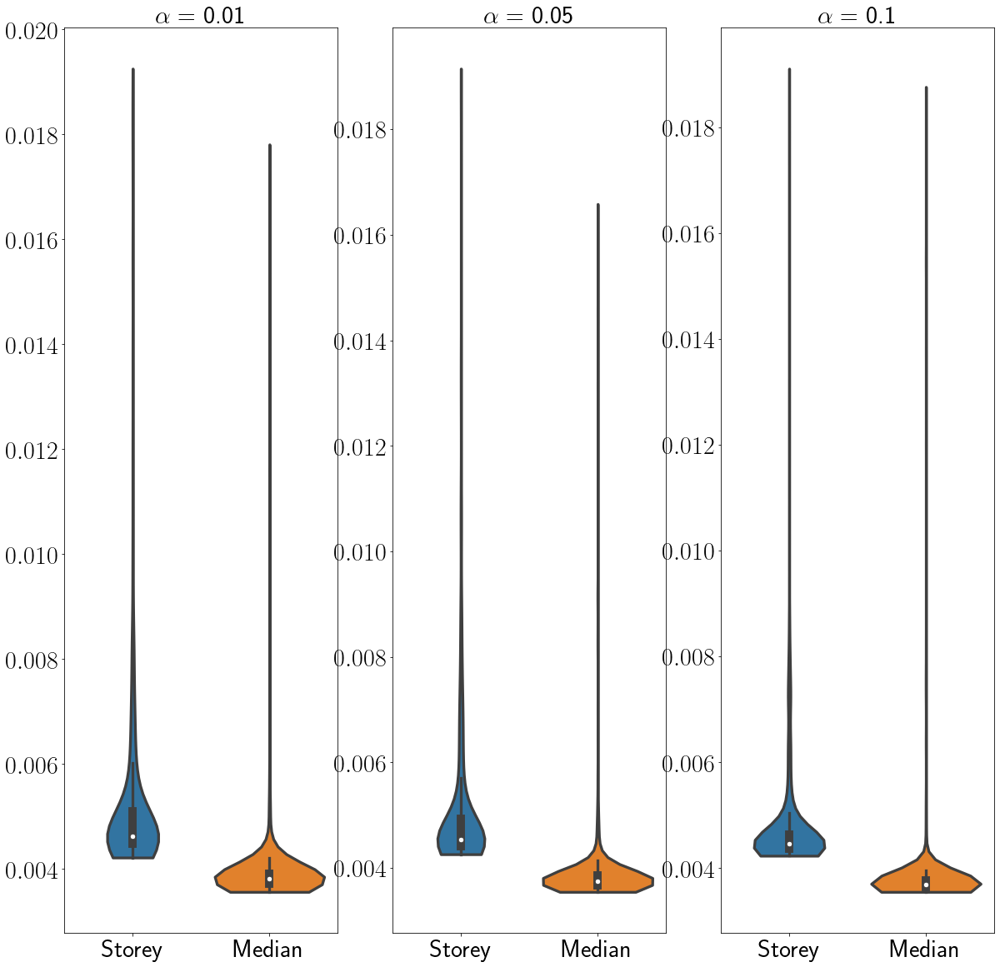

In [65]:
CombinViolinPlot(SizeCIFARLRT,NewProcedureLRT,np.array([2,4]).astype(int),AlphaViolin,np.array([0,1,2]).astype(int),'CIFARLRT5',SaveFigs=False,SeeTimes=True,TotTimes=-TimesCIFARLRT)

In [66]:
CovDataCIFAR=pd.DataFrame(CovCIFAR.T, index=1-AlphaViolin, columns=NewProcedureLRT)
CovDataCIFAR.index.name = 'Targeted Coverage'
CovDataCIFAR.T.to_latex('Test',index=True)

# USPS with LRT

$\alpha$=AlphaViolin.npy SVC, $m=3$, $n_{cal}=700$, Class Calibrated $p$-values. N=500 replications

Methods: Simes, Bonf, Storey $0.5$, Storey $0.05$, Median, Fisher, LRT ($B_{perm}=300$)

In [65]:
CovUSPSLRT=np.load('TotCovUSPS_700_3_Proc_Bperm300_N500.npy')
PowerUSPSLRT=np.load('TotPowerUSPS_700_3_Proc_Bperm300_N500.npy')
SizeUSPSLRT=np.load('TotnPredictUSPS_700_3_Proc_Bperm300_N500.npy')
TimesUSPSLRT=np.load('TotTimesUSPS_700_3_Proc_Bperm300_N500.npy')

In [66]:
10**3

1000

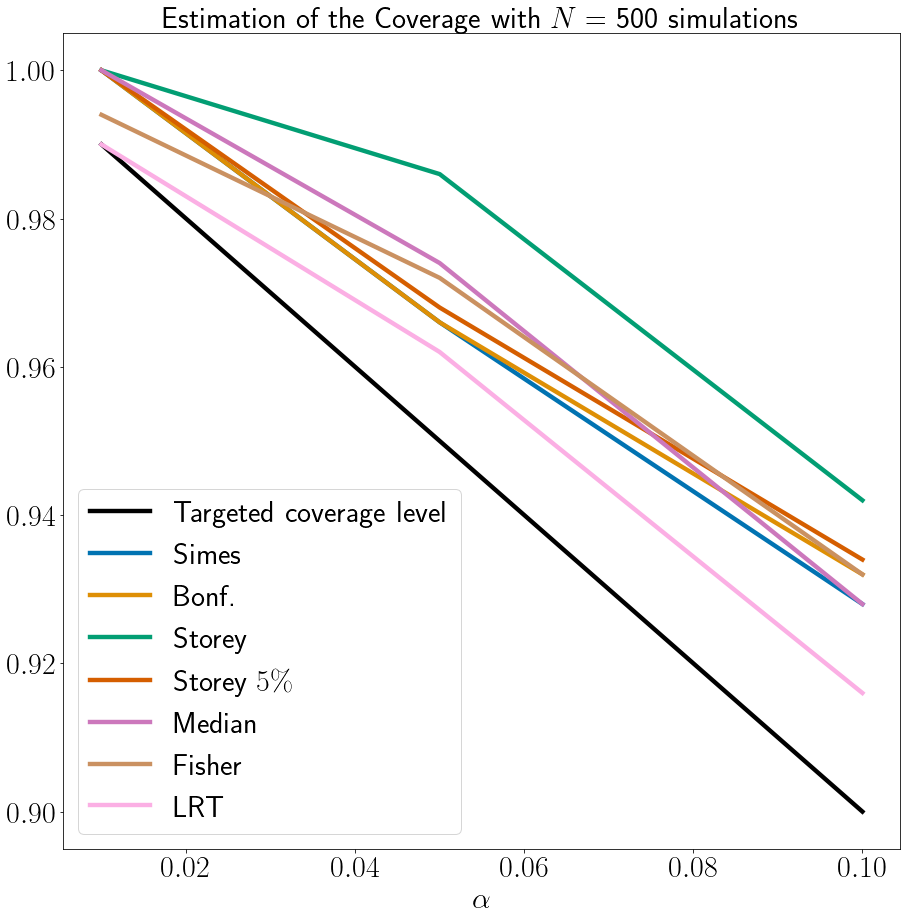

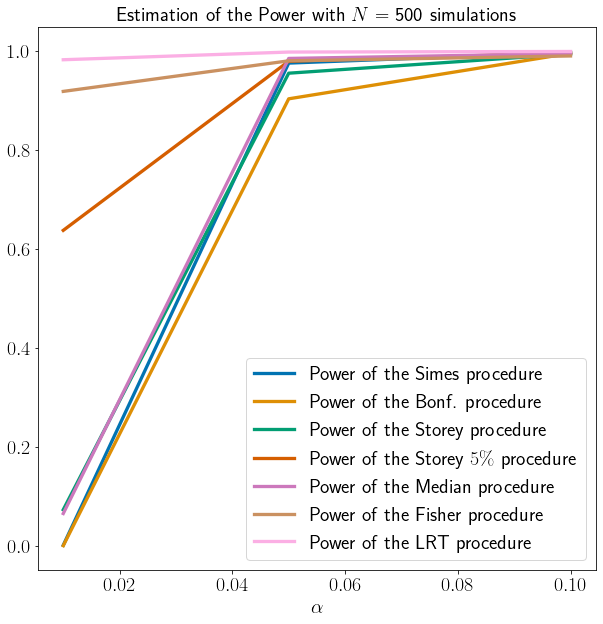

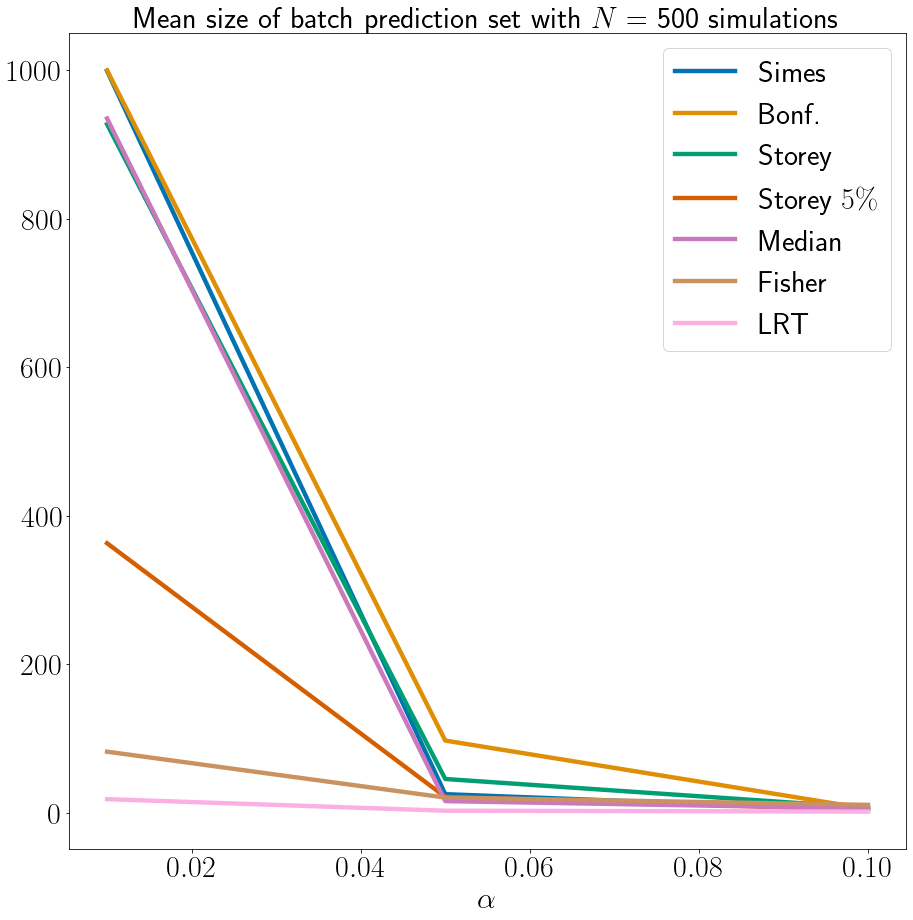

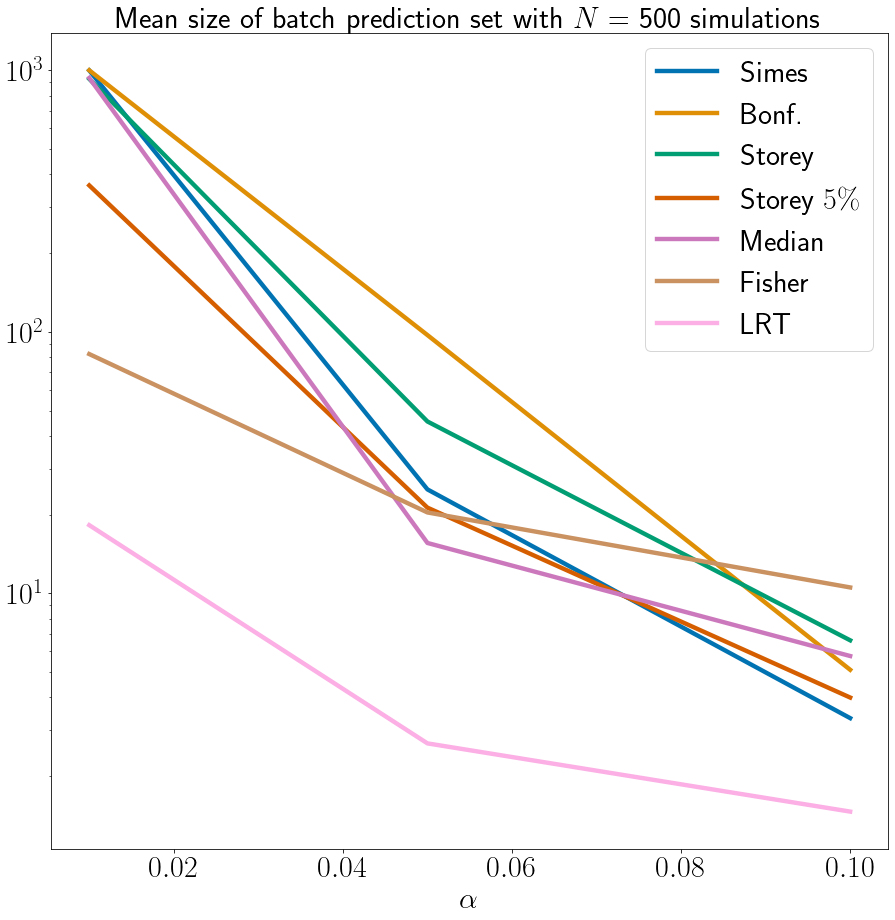

In [67]:
CovUSPS,Mpower,Msize=MeanPlot(CovUSPSLRT,PowerUSPSLRT,SizeUSPSLRT,NewProcedureLRT,AlphaViolin,0)

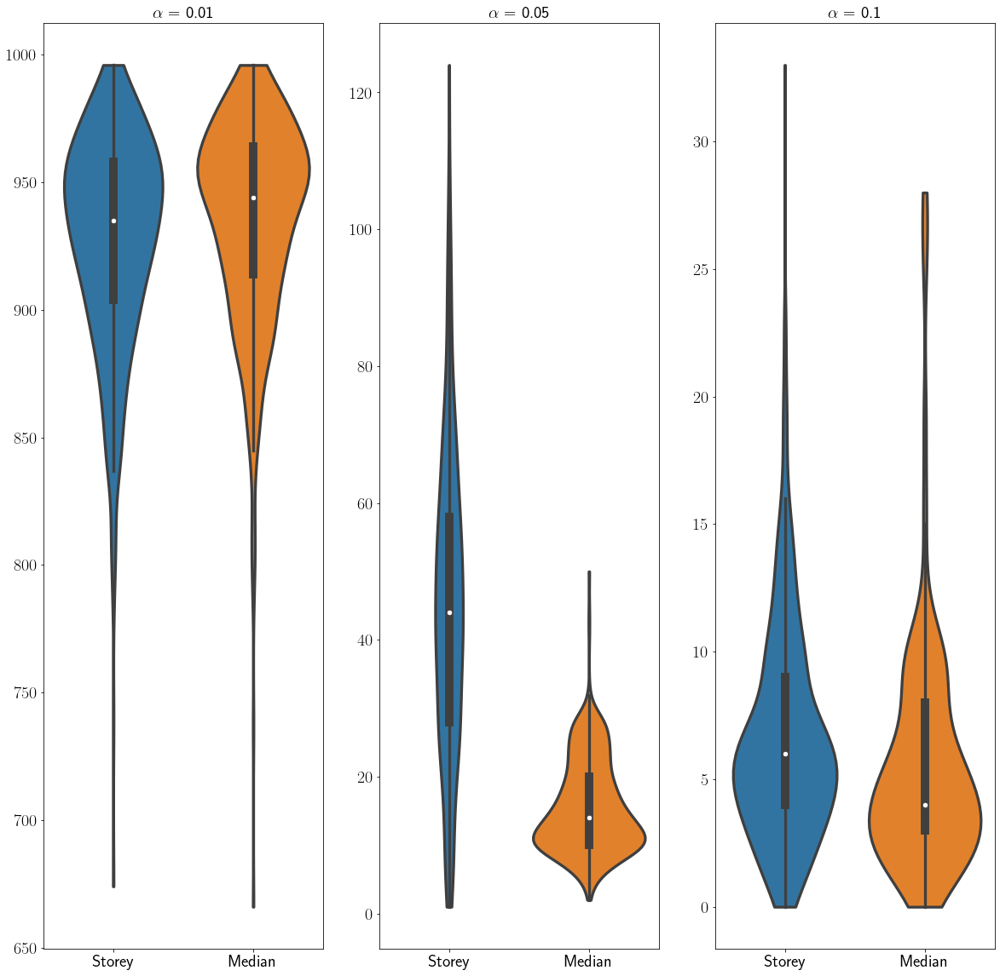

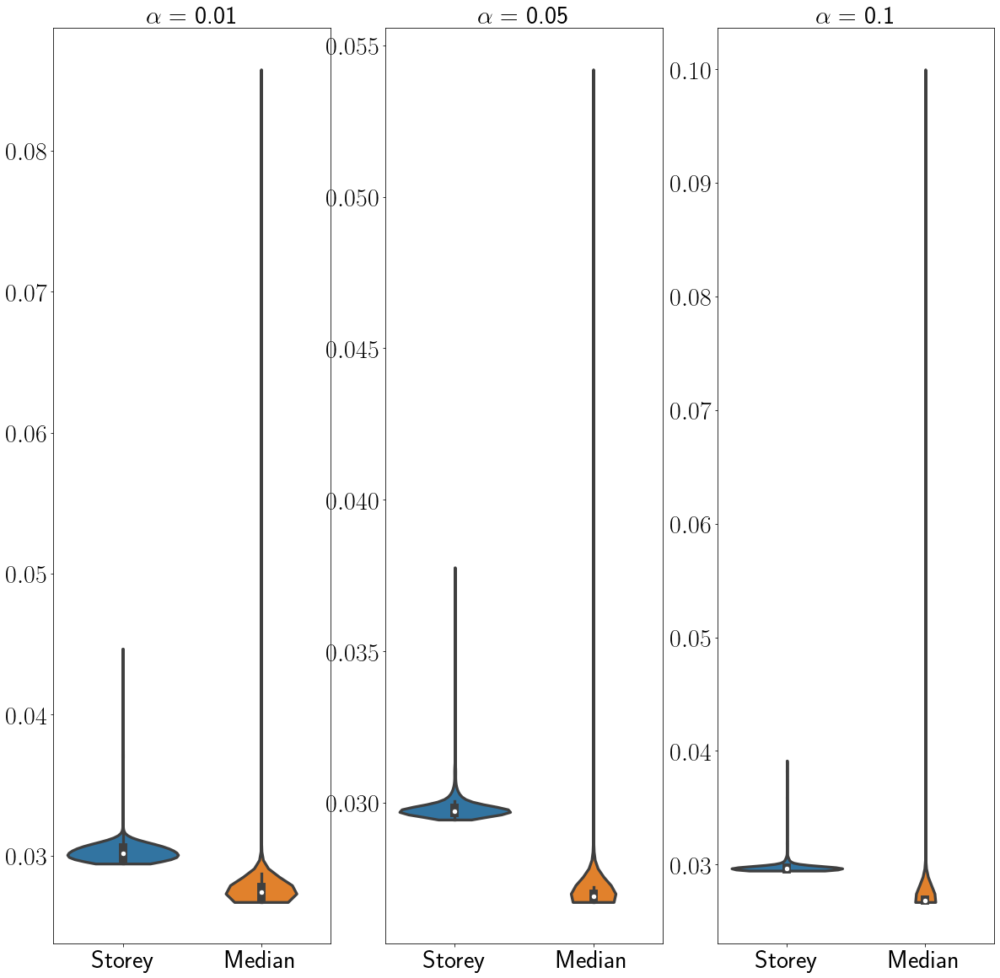

In [70]:
CombinViolinPlot(SizeUSPSLRT,NewProcedureLRT,np.array([2,4]).astype(int),AlphaViolin,np.array([0,1,2]).astype(int),'USPSLRT10',SaveFigs=False,SeeTimes=True,TotTimes=TimesUSPSLRT)